## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

# Save the calibration matrix and distortion coefficients

import pickle
%matplotlib inline



img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = img.shape[0:2]

print(img_size)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

undist = cv2.undistort(img, mtx, dist, None, mtx)

#save the calibration results
# dist_pickle = {}
# dist_pickle["mtx"] = mtx
# dist_pickle["dist"] = dist
# pickle.dump(dist_pickle, open("./camera_cal/dist_pickle.p", "wb"))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)

# Load and test distortion and warp perspective

True


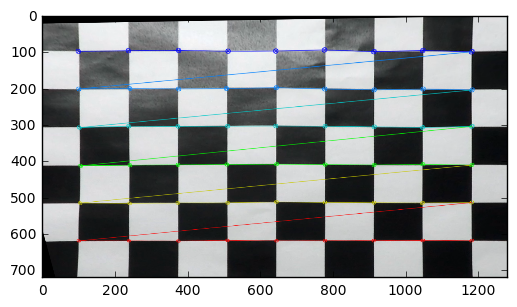

In [1]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# Read in the saved camera matrix and distortion coefficients
# These are the arrays you calculated using cv2.calibrateCamera()
dist_pickle = pickle.load(open( "./camera_cal/dist_pickle.p", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Read in an image
img = cv2.imread('./camera_cal/calibration3.jpg')
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    print(ret)
    warped = None
    M = None
    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return warped, M

warped_img, M = corners_unwarp(img, nx, ny, mtx, dist)

plt.imshow(warped_img)




In [2]:
import glob
image_files = glob.glob('./test_images/*.jpg')

images = []
for fname in image_files:
    img = plt.imread(fname)
    images.append(img)
    
print(len(images))

image = images[0]

8


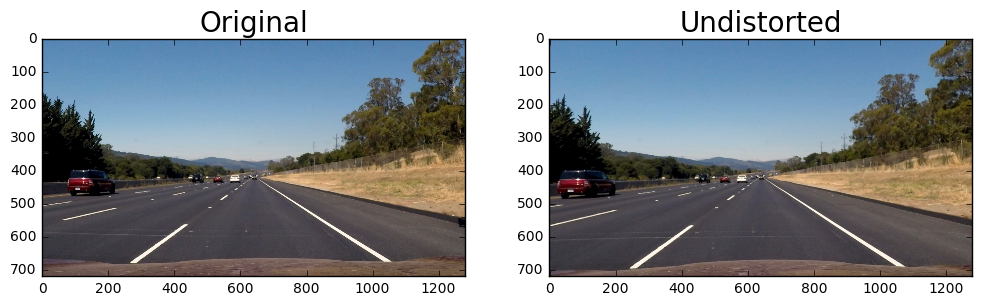

In [3]:
image = images[1]
undistorted = cv2.undistort(image, mtx, dist, None, mtx)  
f, ax = plt.subplots(1, 2, figsize=(12,12))
ax[0].imshow(image)
ax[0].set_title('Original', fontsize=20)
ax[1].imshow(undistorted)
ax[1].set_title('Undistorted', fontsize=20)

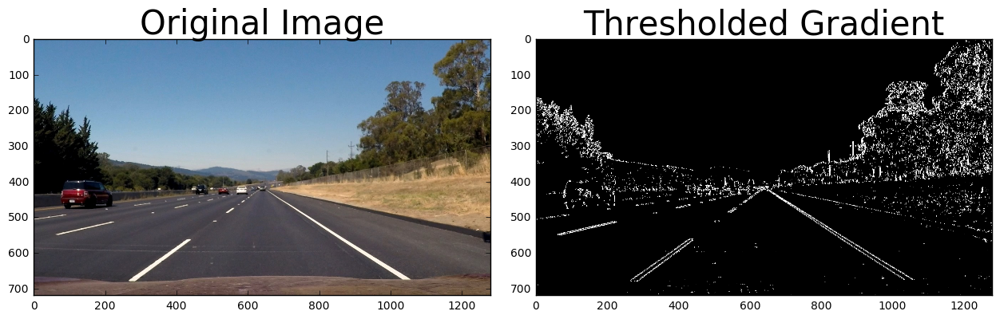

In [4]:
%matplotlib inline

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    # Convert to HLS and use lightness as the gray
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    L = hls[:,:,1]
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient=='x':
        sobel = cv2.Sobel(L, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(L, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary
    return binary_output

# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', thresh=(20, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

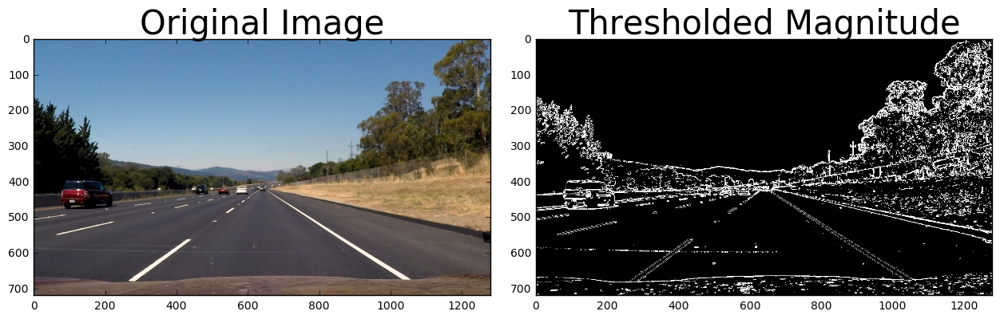

In [5]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Convert to HLS and use lightness as the gray
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    L = hls[:,:,1]
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(L, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(L, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    mag = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    
    scaled_mag = np.uint8(255*mag/np.max(mag))
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_mag)
    sxbinary[(scaled_mag >= mag_thresh[0]) & (scaled_mag <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary # Remove this line
    return binary_output
    
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(20, 100))
# print(mag_binary)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

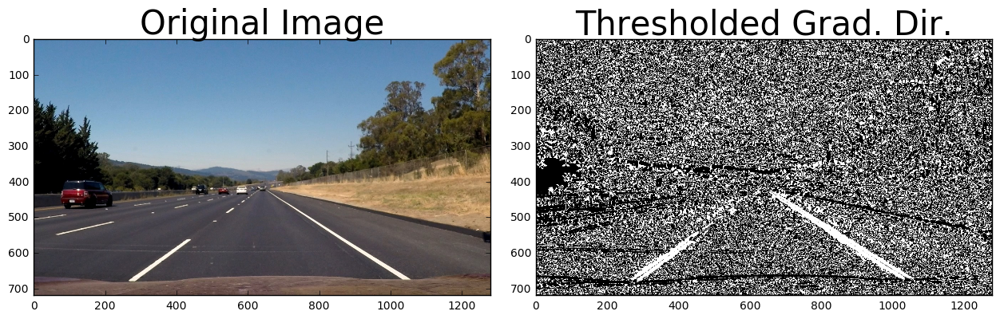

In [6]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Convert to HLS and use lightness as the gray
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    L = hls[:,:,1]
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(L, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(L, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    G = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    mask = np.zeros_like(G)
    mask[(G > thresh[0]) & (G < thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = mask
    return binary_output
    
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

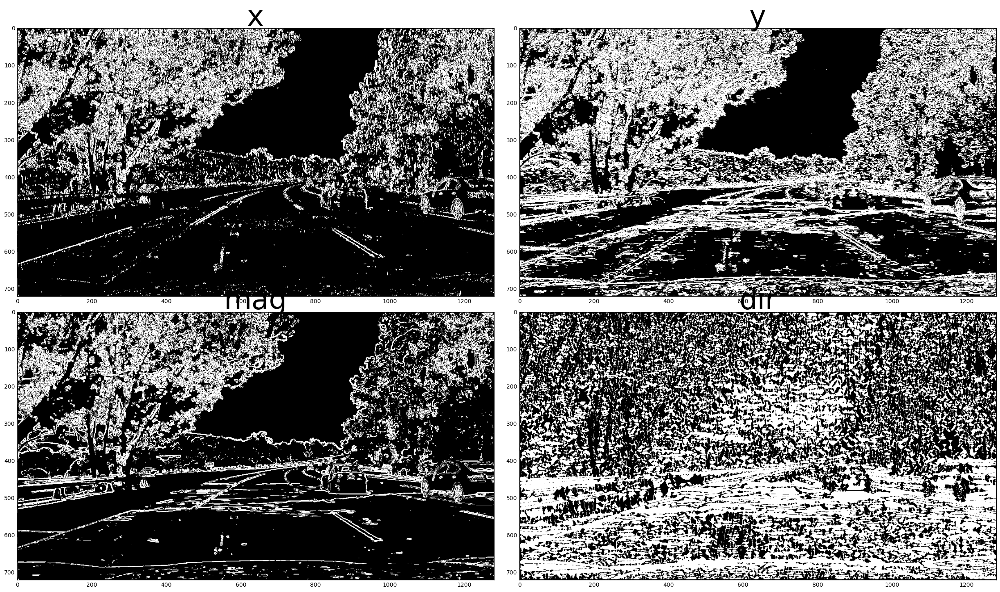

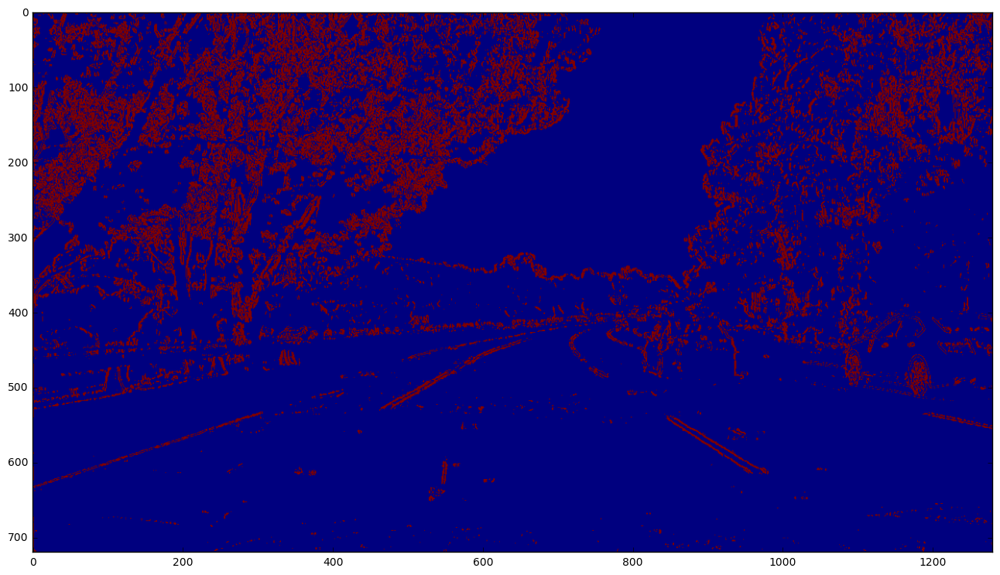

In [7]:
%matplotlib inline

image = images[6]

x_grad_binary = abs_sobel_thresh(image, orient='x', thresh=(10, 100))
y_grad_binary = abs_sobel_thresh(image, orient='y', thresh=(5, 150))
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(20, 100))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(1, 1.6))

f, ax = plt.subplots(2, 2, figsize=(24, 15))
f.tight_layout()
ax[0][0].imshow(x_grad_binary, cmap='gray')
ax[0][0].set_title('x', fontsize=50)
ax[0][1].imshow(y_grad_binary, cmap='gray')
ax[0][1].set_title('y', fontsize=50)

ax[1][0].imshow(mag_binary, cmap='gray')
ax[1][0].set_title('mag', fontsize=50)
ax[1][1].imshow(dir_binary, cmap='gray')
ax[1][1].set_title('dir', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


binary = np.zeros_like(dir_binary)
binary[(x_grad_binary == 1) & (mag_binary == 1)] = 1

plt.figure(2)
f, ax1 = plt.subplots(1, 1, figsize=(24, 9))
ax1.imshow(binary)

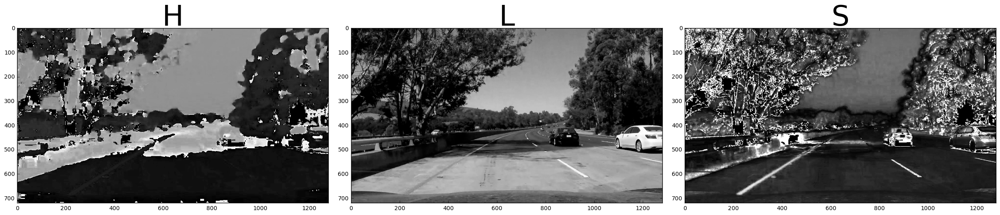

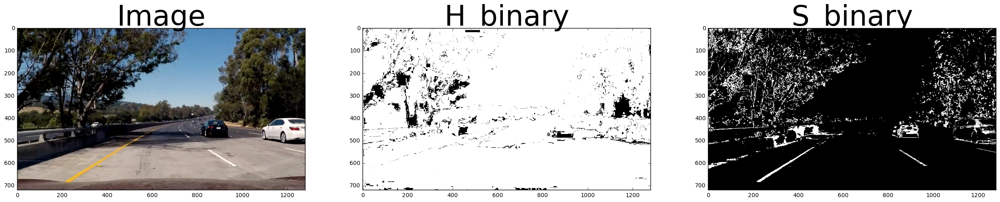

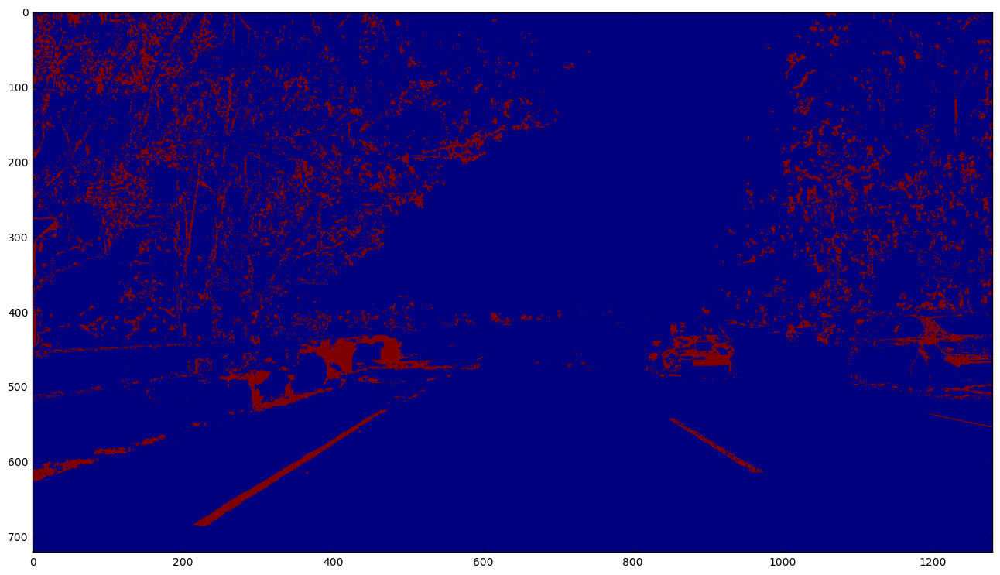

In [8]:
%matplotlib inline

image = images[6]
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H, cmap='gray')
ax1.set_title('H', fontsize=50)
ax2.imshow(L, cmap='gray')
ax2.set_title('L', fontsize=50)
ax3.imshow(S, cmap='gray')
ax3.set_title('S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

plt.figure(1)

H_thresh = (0, 180)
H_binary = np.zeros_like(H)
H_binary[(H > H_thresh[0]) & (H <= H_thresh[1])] = 1

S_thresh = (170, 255)
S_binary = np.zeros_like(S)
S_binary[(S > S_thresh[0]) & (S <= S_thresh[1])] = 1

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))

ax1.imshow(image, cmap='gray')
ax1.set_title('Image', fontsize=50)
ax2.imshow(H_binary, cmap='gray')
ax2.set_title('H_binary', fontsize=50)
ax3.imshow(S_binary, cmap='gray')
ax3.set_title('S_binary', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


binary = np.zeros_like(S)
binary[(S_binary == 1) & (H_binary == 1)] = 1
plt.figure(2)
f, ax1 = plt.subplots(1, 1, figsize=(24, 9))
ax1.imshow(binary)

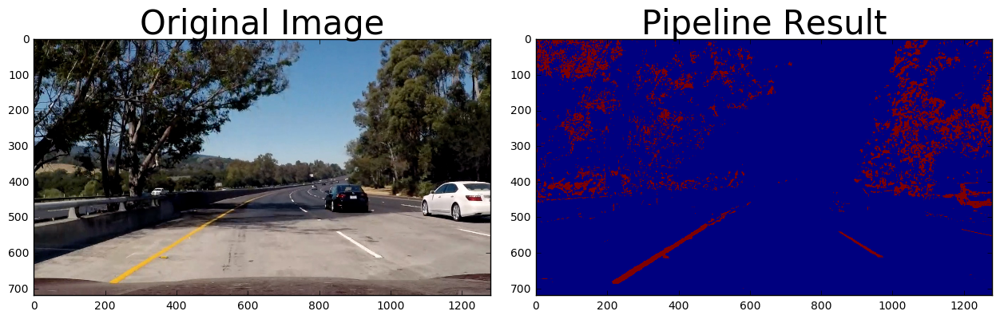

In [9]:
%matplotlib inline

image = images[6]
# image = plt.imread('./output_images/575_before.jpg')
def hsl_channel_threshold(img, s_thresh=(90, 255), h_thresh=(30, 140)):
    img = np.copy(img)

    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    h_channel = hls[:,:,0]
    s_channel = hls[:,:,2]
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel > h_thresh[0]) & (h_channel <= h_thresh[1])] = 1

    binary = np.zeros_like(h_channel)
#     binary[(s_binary == 1)] = 1
    binary[(s_binary == 1) & (h_binary == 1)] = 1
    return binary
    
result = hsl_channel_threshold(image, s_thresh=(100, 255), h_thresh=(0, 100))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

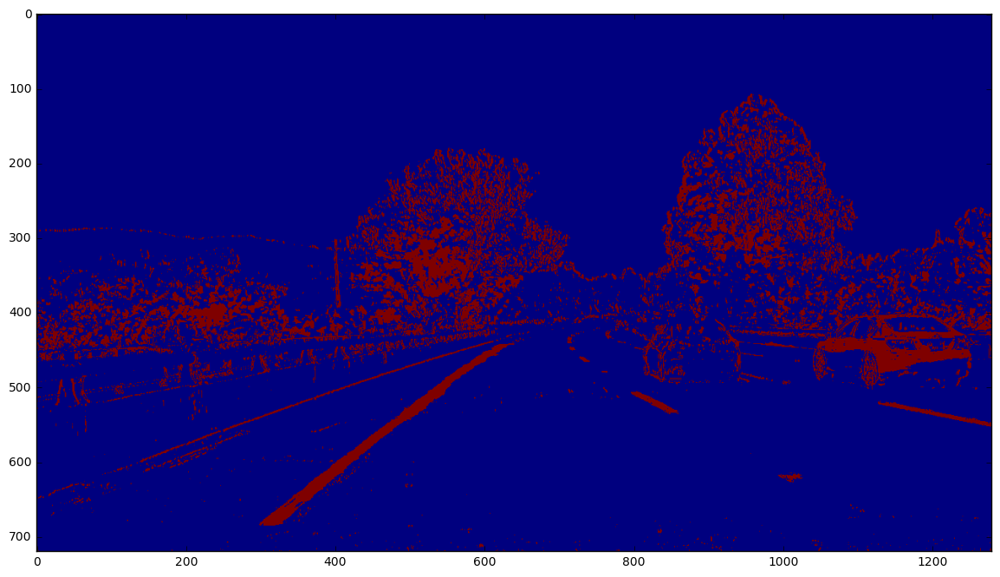

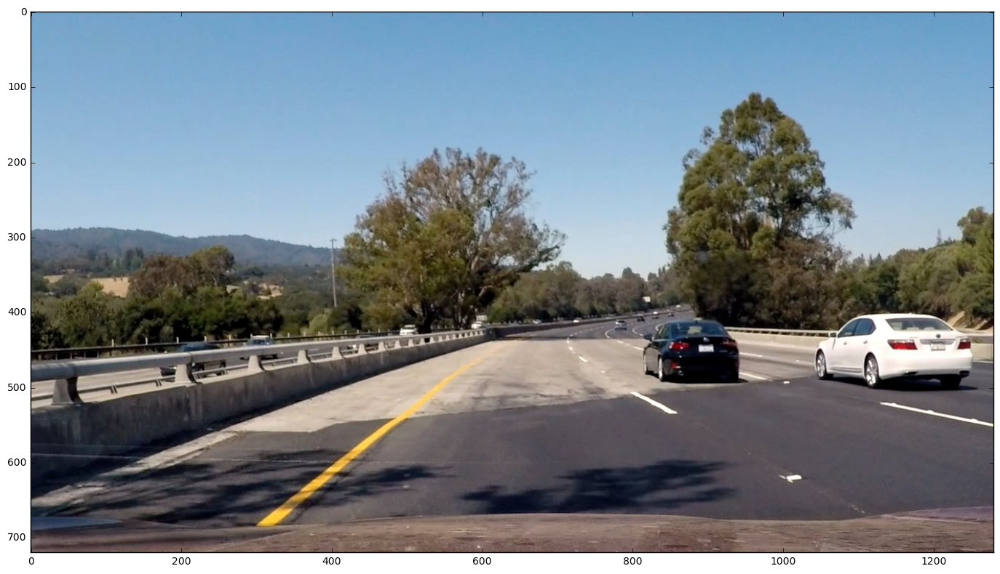

In [10]:
##### %matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib.widgets import Button

# fig_size = plt.rcParams["figure.figsize"]
# print(fig_size)
# plt.rcParams['figure.figsize'] = (20.0, 10.0)

image = images[5]
# image = plt.imread('./output_images/575_before.jpg')
def filter_lanes(image):
    x_grad_binary = abs_sobel_thresh(image, orient='x', thresh=(20, 100))
    y_grad_binary = abs_sobel_thresh(image, orient='y', thresh=(10, 100))
    mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(20, 100))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.0))
    hsl_channel_binary = hsl_channel_threshold(image, s_thresh=(100, 255), h_thresh=(0, 100))

    combined = np.zeros_like(dir_binary)
#     combined[(x_grad_binary == 1)] = 1
#     combined[(y_grad_binary == 1)] = 1
#     combined[(y_grad_binary == 1) & (x_grad_binary == 1)] = 1
#     combined[(mag_binary == 1)] = 1
#     combined[(dir_binary == 1)] = 1
    combined[(hsl_channel_binary == 1) | (x_grad_binary == 1)] = 1
#     combined[(dir_binary == 1) & (hsl_channel_binary == 1)] = 1
    return combined

plt.figure(figsize=(16,8))
plt.imshow(filter_lanes(image))
plt.figure(figsize=(16,8))
plt.imshow(image)
plt.tight_layout()

Wall time: 149 ms


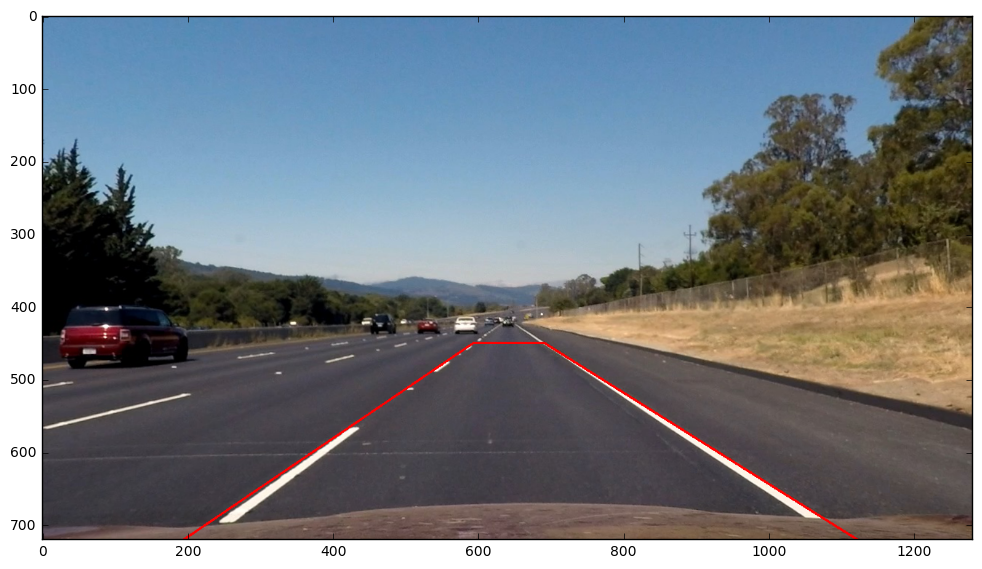

In [11]:
%%time
image = np.copy(images[1])
image = cv2.undistort(image, mtx, dist, None, mtx)    
# modified_image = filter_lanes(undistored)
color=[255, 0, 0]
warp_vertices_src = [(195, image.shape[0]), (593, 450), (690, 450), (1120, image.shape[0])]
cv2.line(image, warp_vertices_src[0], warp_vertices_src[1], color, 2)
cv2.line(image, warp_vertices_src[2], warp_vertices_src[3], color, 2)
cv2.line(image, warp_vertices_src[1], warp_vertices_src[2], color, 2)


f, ax = plt.subplots(1, 1, figsize=(12,12))
ax.imshow(image)

(720, 1280, 3)


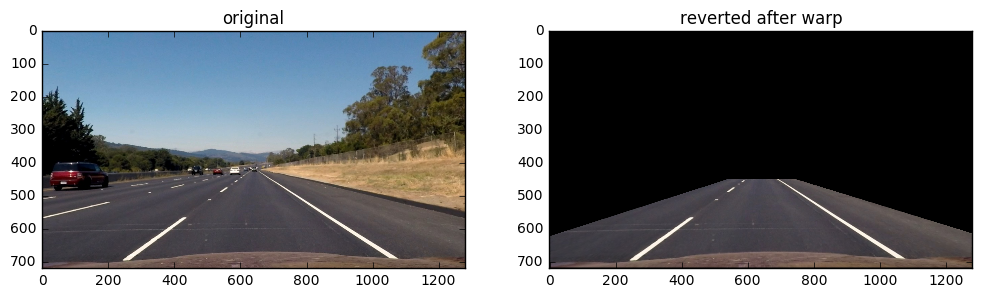

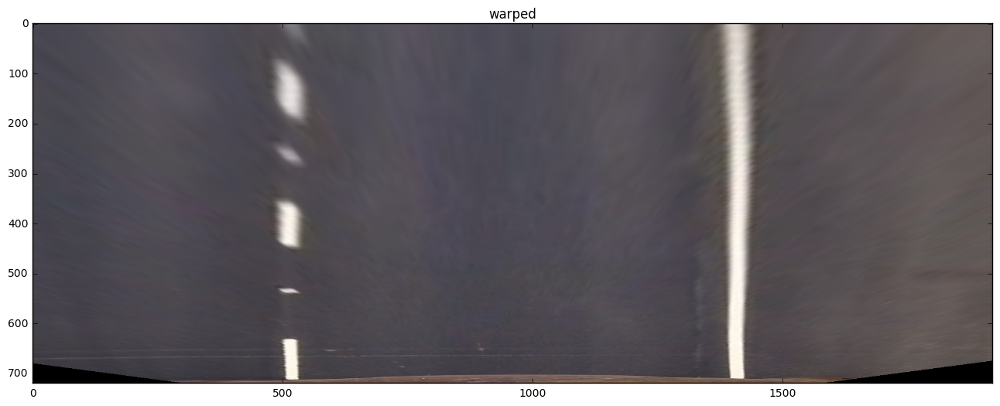

In [12]:

def warp_image(image, mode='normal'):
    image = np.copy(image)
#     warp_vertices_src = [(195, image.shape[0]), (593, 450), (690, 450), (1120, image.shape[0])]
#     src = np.float32(warp_vertices_src)
#     dst = np.float32([[195, 720], [195, 0], [1120, 0], [1120, 720]])
    warp_vertices_src = [(195, 720), (593, 450), (690, 450), (1120, 720)]
    src = np.float32(warp_vertices_src)
#     dst = np.float32([[195, 720], [195, 0], [1120, 0], [1120, 720]])
    dst = np.float32([[495, 720], [495, 0], [1420, 0], [1420, 720]])
#     color=[255, 0, 0]
#     cv2.line(image, warp_vertices_src[0], warp_vertices_src[1], color, 1)
#     cv2.line(image, warp_vertices_src[2], warp_vertices_src[3], color, 1)
#     cv2.line(image, warp_vertices_src[1], warp_vertices_src[2], color, 1)
    if mode=='normal':
        M = cv2.getPerspectiveTransform(src, dst)
        warped = cv2.warpPerspective(image, M, (1920, 720), flags=cv2.INTER_LINEAR)
    elif mode=='inverse':
        M = cv2.getPerspectiveTransform(dst, src)
        warped = cv2.warpPerspective(image, M, (1280, 720), flags=cv2.INTER_LINEAR)
    return warped

# image = np.copy(images[1])
image = images[1]
# image = plt.imread('./output_images/613_before.jpg')
image = cv2.undistort(image, mtx, dist, None, mtx)  
print(image.shape)
warped = warp_image(image)
warped_inverse = warp_image(warped, mode='inverse')
f, ax = plt.subplots(1, 2, figsize=(12,12))
ax[0].imshow(image)
ax[0].set_title('original')
ax[1].imshow(warped_inverse)
ax[1].set_title('reverted after warp')
plt.figure(figsize=(16,8))
plt.title('warped')
plt.imshow(warped)


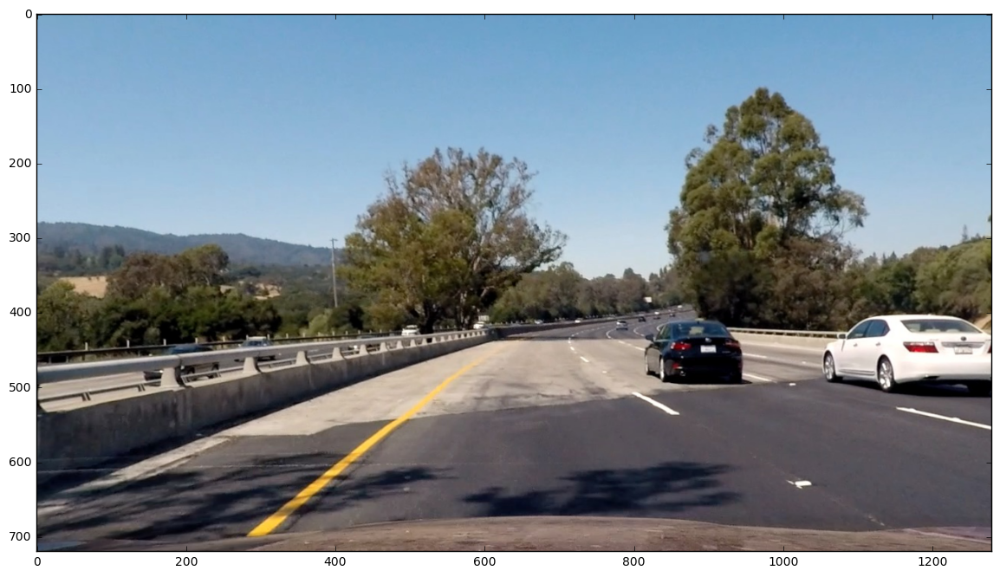

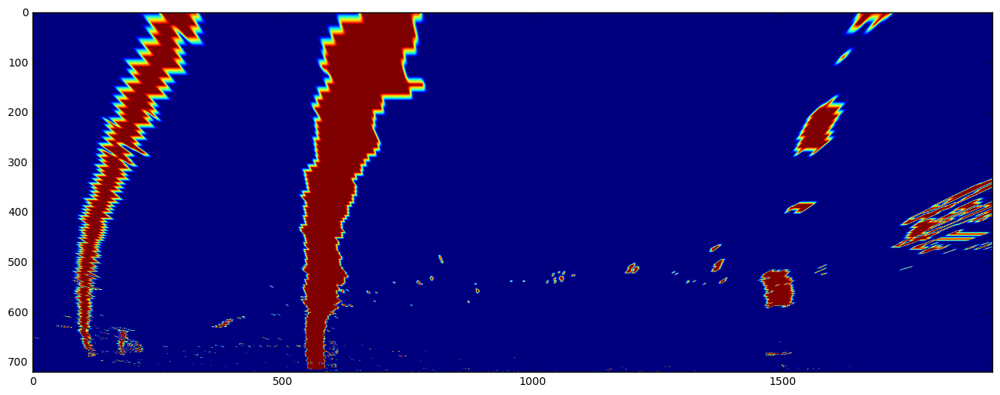

In [13]:
image = images[5]
# image = plt.imread('./output_images/126_before.jpg')
image = cv2.undistort(image, mtx, dist, None, mtx)  
filtered = filter_lanes(image)
warped = warp_image(filtered)

plt.figure(figsize=(16,8))
plt.imshow(image)
plt.figure(figsize=(16,8))
plt.imshow(warped)

C:\Continuum\Anaconda3\lib\site-packages\ipykernel\__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


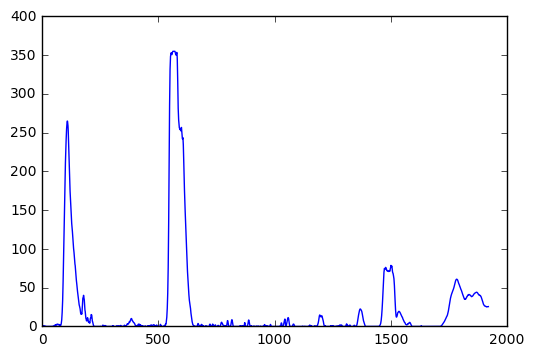

In [14]:
image = images[5]
# image = plt.imread('./output_images/613_before.jpg')
image = cv2.undistort(image, mtx, dist, None, mtx)  
filtered = filter_lanes(image)
warped = warp_image(filtered)

histogram = np.sum(warped[warped.shape[0]/2:,:], axis=0)
plt.plot(histogram)

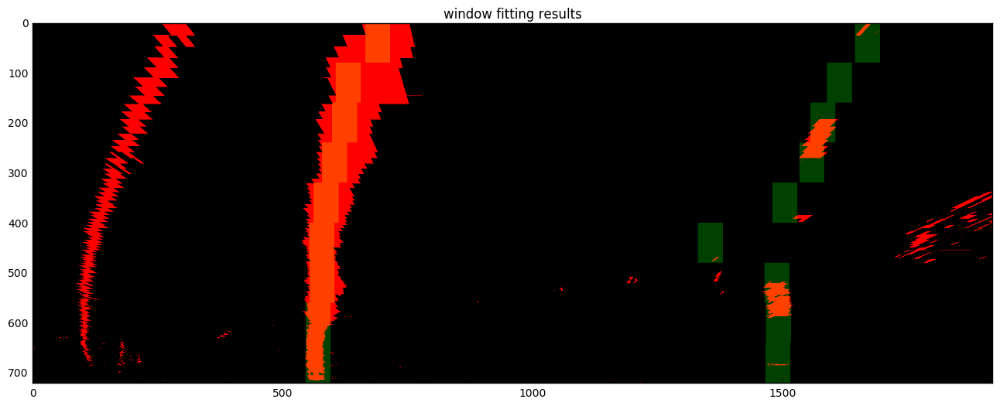

In [15]:



def find_lane_pixels(warped):
    # window settings
    window_width = 50 
    window_height = 80 # Break image into 9 vertical layers since image height is 720
    margin = 150 # How much to slide left and right for searching

    def window_mask(width, height, img_ref, center,level):
        output = np.zeros_like(img_ref)
        output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
        return output

    def find_window_centroids(image, window_width, window_height, margin):

        window_centroids = [] # Store the (left,right) window centroid positions per level
        window = np.ones(window_width) # Create our window template that we will use for convolutions

        # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
        # and then np.convolve the vertical image slice with the window template 

        # Sum quarter bottom of image to get slice, could use a different ratio
        l_sum = np.sum(warped[int(6*warped.shape[0]/10):,:int(warped.shape[1]/2)], axis=0)
        l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
        r_sum = np.sum(warped[int(6*warped.shape[0]/10):,int(warped.shape[1]/2):], axis=0)
        r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
#         print(r_center)
        
        # Add what we found for the first layer
        window_centroids.append((l_center,r_center))

        # Go through each layer looking for max pixel locations
        for level in range(1,(int)(warped.shape[0]/window_height)):
            # convolve the window into the vertical slice of the image
            image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
            conv_signal = np.convolve(window, image_layer)
            # Find the best left centroid by using past left center as a reference
            # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
            offset = window_width/2
            l_min_index = int(max(l_center+offset-margin,0))
            l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
            l_signal_center = np.argmax(conv_signal[l_min_index:l_max_index]) 
            if l_signal_center > 0:
                l_center = l_signal_center+l_min_index-offset
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-margin,0))
            r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
            r_signal_center = np.argmax(conv_signal[r_min_index:r_max_index])
            
#             print(level, r_min_index, r_max_index, r_signal_center)
            if r_signal_center > 0:
                r_center = r_signal_center+r_min_index-offset
            # Add what we found for that layer
            window_centroids.append((l_center,r_center))

        return window_centroids

    window_centroids = find_window_centroids(warped, window_width, window_height, margin)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channle 
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
        
    return l_points, r_points, output

image = images[5]
# image = plt.imread('./output_images/172_before.jpg')
image = cv2.undistort(image, mtx, dist, None, mtx)    
filtered = filter_lanes(image)
warped = warp_image(filtered)
l_points, r_points, output = find_lane_pixels(warped)

# Display the final results
plt.figure(figsize=(16,8))
warped[warped==1] = 255
warped = np.array(warped, np.uint8)
warped = np.array(cv2.merge((warped,np.zeros_like(warped),np.zeros_like(warped)))) # making the original road pixels 3 color channels
output = cv2.addWeighted(warped, 1, output, 0.5, 0)
plt.imshow(output)
plt.title('window fitting results')



In [16]:
np.convolve([1, 2, 3, 4], [0, 1], mode='full')

array([0, 1, 2, 3, 4])

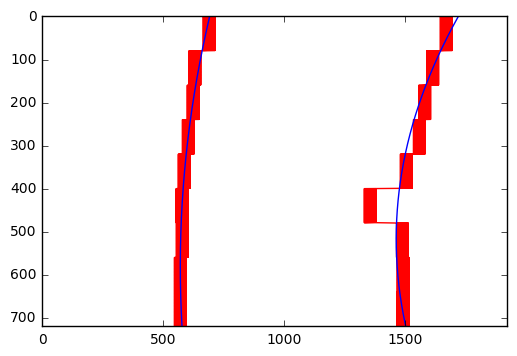

In [17]:

def get_line_fit(points):
    y, x = np.nonzero(points)
    image_height = points.shape[0]
    y_axis = np.linspace(0, image_height-1, num=image_height)
    fit = np.polyfit(y, x, 2)
    line_fitx = fit[0]*y_axis**2 + fit[1]*y_axis + fit[2]
    return line_fitx

y, x = np.nonzero(l_points)
left_fitx = get_line_fit(l_points)

image_height = l_points.shape[0]
y_axis = np.linspace(0, image_height-1, num=image_height)
# print(left_fit)
plt.plot(x, y, color='red')
plt.plot(left_fitx, y_axis, color='blue')
plt.xlim(0, l_points.shape[1])
plt.ylim(0, image_height)

y, x = np.nonzero(r_points)
right_fitx = get_line_fit(r_points)

plt.plot(x, y, color='red')
plt.plot(right_fitx, y_axis, color='blue')
plt.gca().invert_yaxis() # to visualize as we do the images

# y_eval = 720
# left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
# right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
# print(left_curverad, right_curverad)


In [18]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

image_height = l_points.shape[0]

y_left, x_left = np.nonzero(l_points)
y_right, x_right = np.nonzero(r_points)


# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(y_left*ym_per_pix, x_left*xm_per_pix, 2)
right_fit_cr = np.polyfit(y_right*ym_per_pix, x_right*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*image_height*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*image_height*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m

456.993461099 m 172.022245646 m


In [19]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

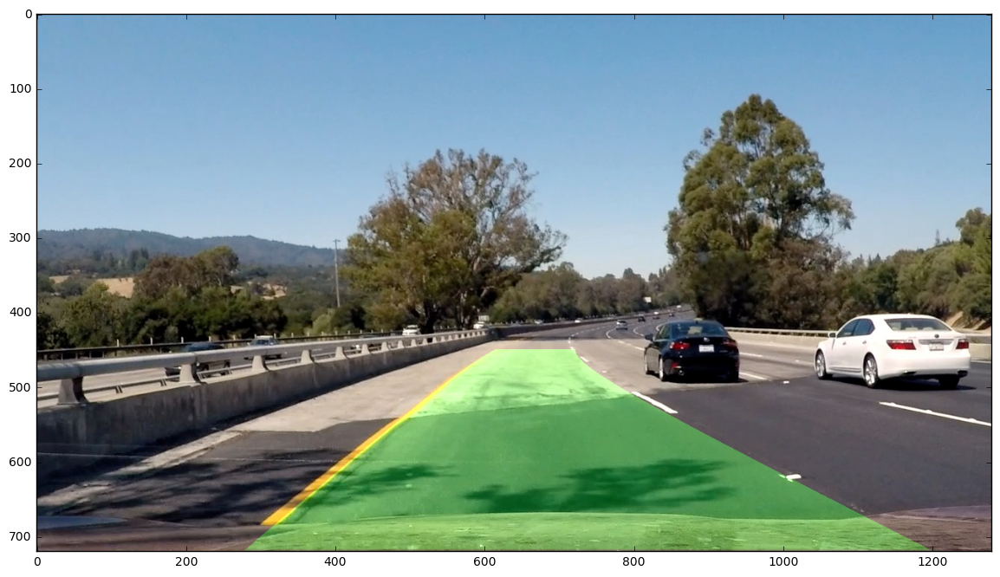

In [20]:
def overlay_lanes(original, warped, left_fitx, right_fitx):
    image_height = warped.shape[0]
    y_axis = np.linspace(0, image_height-1, num=image_height)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, y_axis]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, y_axis])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    # newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    newwarp = warp_image(color_warp, mode='inverse')
    # Combine the result with the original image
    result = cv2.addWeighted(original, 1, newwarp, 0.3, 0)
    return result

image = images[5]
# image = plt.imread('./output_images/575_before.jpg')
filtered = filter_lanes(image)
warped = warp_image(filtered)
result = overlay_lanes(image, warped, left_fitx, right_fitx)
plt.figure(figsize=(16,8))
plt.imshow(result)

In [21]:
def IdGenerator(path):
    count = 0
    while True:
        before = path + str(count) + '_before.jpg'
        after = path + str(count) + '_after.jpg'
        yield before, after
        count += 1
        
id_gen = IdGenerator('./output_images/')

587.568375517 m 293.363187309 m


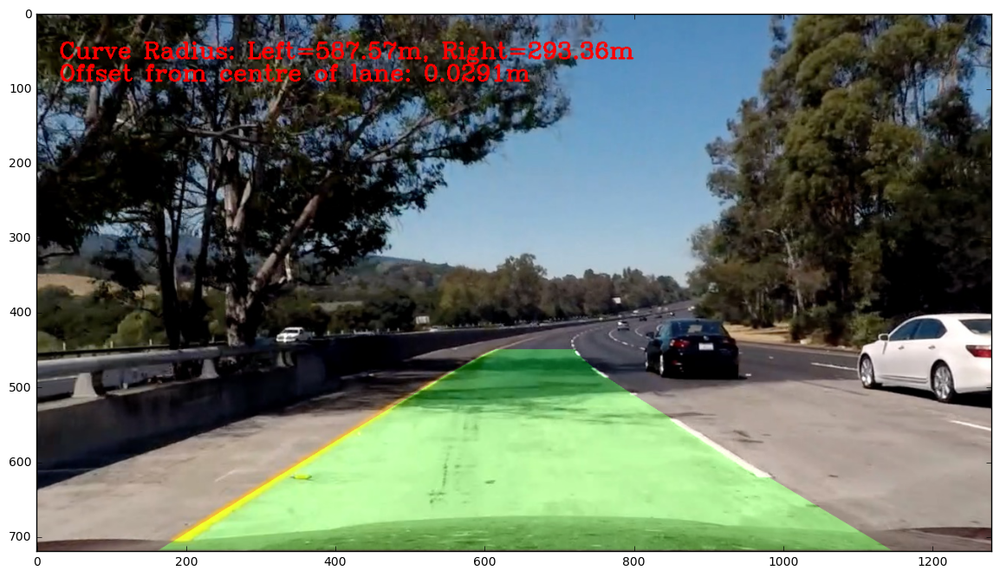

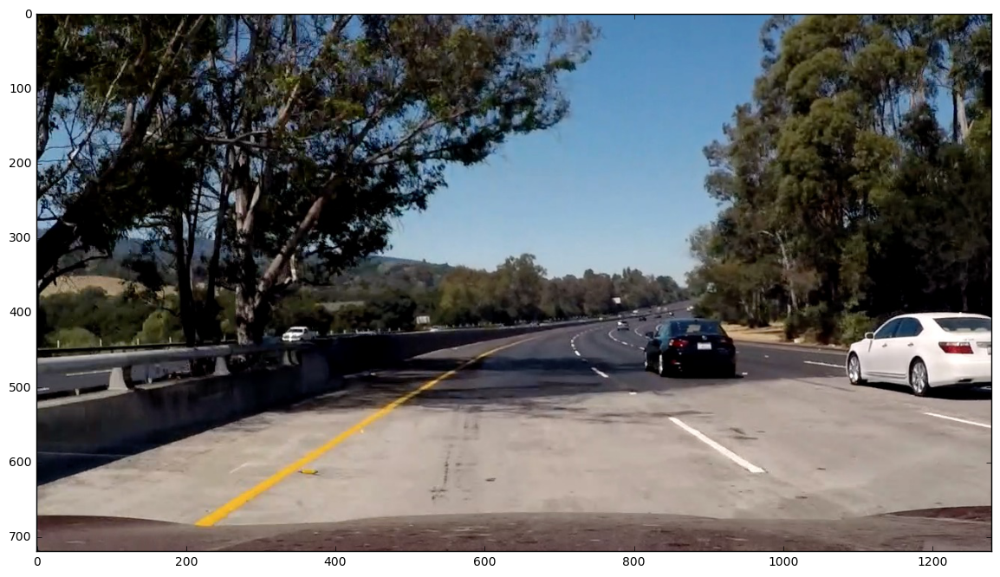

In [22]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# Read in the saved camera matrix and distortion coefficients
# These are the arrays you calculated using cv2.calibrateCamera()
dist_pickle = pickle.load(open( "./camera_cal/dist_pickle.p", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]


def pipeline(image, debug=False):
    if debug == True:
        before, after = next(id_gen)
        cv2.imwrite(before, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
    
    # Use the OpenCV undistort() function to remove distortion
    undistored = cv2.undistort(image, mtx, dist, None, mtx)    
    filtered_image = filter_lanes(undistored)
    warped_image = warp_image(filtered_image)
    modified_image = warped_image
    l_points, r_points, lane_drawing = find_lane_pixels(modified_image)
    
            
    left_fitx = get_line_fit(l_points)
    right_fitx = get_line_fit(r_points)
    
    modified_image = overlay_lanes(undistored, modified_image, left_fitx, right_fitx)
    #debug
    if debug == True:
        filtered_image[filtered_image > 0] = 255
        filtered_image = np.array(cv2.merge((filtered_image,np.zeros_like(filtered_image),np.zeros_like(filtered_image))),np.uint8)
        combined = cv2.addWeighted(modified_image, 1, filtered_image, 0.9, 0.0)
        modified_image = combined
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    image_height = l_points.shape[0]

    y_left, x_left = np.nonzero(l_points)
    y_right, x_right = np.nonzero(r_points)


    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(y_left*ym_per_pix, x_left*xm_per_pix, 2)
    right_fit_cr = np.polyfit(y_right*ym_per_pix, x_right*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*image_height*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*image_height*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    
    text = "Curve Radius: Left=" + str(np.round(left_curverad, 2)) + "m, Right=" + str(np.round(right_curverad, 2)) + "m"
    font = cv2.FONT_HERSHEY_COMPLEX    
    cv2.putText(modified_image, text, (30, 60), font, 1, (255,0,0), 2)
    center_offset = (warped_image.shape[1]/2 - (left_fitx[-1] + right_fitx[-1])/2)*xm_per_pix
    center_offset_text = "Offset from centre of lane: {:2.4f}m".format(center_offset)
    cv2.putText(modified_image, center_offset_text, (30, 90), font, 1, (255,0,0), 2)
    
    if debug == True:
        cv2.imwrite(after, cv2.cvtColor(modified_image, cv2.COLOR_RGB2BGR))
    return modified_image



image = images[6]
# image = plt.imread('./output_images/18_before.jpg')
result = pipeline(image, debug=False)
plt.figure(figsize=(16,8))
plt.imshow(result)
plt.figure(figsize=(16,8))
plt.imshow(image)


In [23]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [24]:
video_output = "output_images/project_video.mp4"
clip1 = VideoFileClip("project_video.mp4")
clip1_output = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time clip1_output.write_videofile(video_output, audio=False)

278.469508216 m 332.822191175 m
[MoviePy] >>>> Building video output_images/project_video.mp4
[MoviePy] Writing video output_images/project_video.mp4


  0%|                                                                                                                                 | 0/1261 [00:00<?, ?it/s]

278.469508216 m 332.822191175 m


  0%|                                                                                                                         | 1/1261 [00:00<14:53,  1.41it/s]

270.393488824 m 389.402012987 m


  0%|▏                                                                                                                        | 2/1261 [00:01<14:42,  1.43it/s]

277.416072057 m 454.667219414 m


  0%|▎                                                                                                                        | 3/1261 [00:02<14:37,  1.43it/s]

286.704541751 m 436.546479131 m


  0%|▍                                                                                                                        | 4/1261 [00:02<14:30,  1.44it/s]

289.345735766 m 371.057283138 m


  0%|▍                                                                                                                        | 5/1261 [00:03<14:30,  1.44it/s]

279.497891028 m 232.769334609 m


  0%|▌                                                                                                                        | 6/1261 [00:04<14:23,  1.45it/s]

290.070341848 m 201.428105417 m


  1%|▋                                                                                                                        | 7/1261 [00:04<14:24,  1.45it/s]

308.863419991 m 231.434787168 m


  1%|▊                                                                                                                        | 8/1261 [00:05<14:16,  1.46it/s]

329.743790662 m 230.308747424 m


  1%|▊                                                                                                                        | 9/1261 [00:06<14:14,  1.47it/s]

325.284117012 m 368.192105734 m


  1%|▉                                                                                                                       | 10/1261 [00:06<14:10,  1.47it/s]

331.97004929 m 361.478239245 m


  1%|█                                                                                                                       | 11/1261 [00:07<14:09,  1.47it/s]

317.398775749 m 390.511738045 m


  1%|█▏                                                                                                                      | 12/1261 [00:08<14:14,  1.46it/s]

326.110679008 m 388.131464478 m


  1%|█▏                                                                                                                      | 13/1261 [00:08<14:15,  1.46it/s]

341.968809442 m 598.798334623 m


  1%|█▎                                                                                                                      | 14/1261 [00:09<14:09,  1.47it/s]

305.040450486 m 428.69103211 m


  1%|█▍                                                                                                                      | 15/1261 [00:10<14:17,  1.45it/s]

308.868916809 m 430.232546711 m


  1%|█▌                                                                                                                      | 16/1261 [00:10<14:18,  1.45it/s]

322.453244029 m 191.836783672 m


  1%|█▌                                                                                                                      | 17/1261 [00:11<14:26,  1.44it/s]

328.602645509 m 215.823188627 m


  1%|█▋                                                                                                                      | 18/1261 [00:12<14:26,  1.44it/s]

300.606744635 m 203.227840752 m


  2%|█▊                                                                                                                      | 19/1261 [00:13<14:20,  1.44it/s]

300.69470167 m 185.607705765 m


  2%|█▉                                                                                                                      | 20/1261 [00:13<14:20,  1.44it/s]

310.070791128 m 206.285583843 m


  2%|█▉                                                                                                                      | 21/1261 [00:14<14:11,  1.46it/s]

339.606864745 m 196.176727518 m


  2%|██                                                                                                                      | 22/1261 [00:15<14:16,  1.45it/s]

338.492783253 m 336.835262582 m


  2%|██▏                                                                                                                     | 23/1261 [00:15<14:11,  1.45it/s]

298.350807649 m 340.143128005 m


  2%|██▎                                                                                                                     | 24/1261 [00:16<14:09,  1.46it/s]

292.944939331 m 311.788116343 m


  2%|██▍                                                                                                                     | 25/1261 [00:17<14:17,  1.44it/s]

295.876956617 m 325.922239546 m


  2%|██▍                                                                                                                     | 26/1261 [00:17<14:23,  1.43it/s]

283.088147509 m 306.666643705 m


  2%|██▌                                                                                                                     | 27/1261 [00:18<14:25,  1.43it/s]

280.557907959 m 802.157383259 m


  2%|██▋                                                                                                                     | 28/1261 [00:19<14:18,  1.44it/s]

277.472353363 m 294.39483252 m


  2%|██▊                                                                                                                     | 29/1261 [00:20<14:17,  1.44it/s]

267.162279478 m 308.353345945 m


  2%|██▊                                                                                                                     | 30/1261 [00:20<14:19,  1.43it/s]

262.423314787 m 283.171766369 m


  2%|██▉                                                                                                                     | 31/1261 [00:21<14:18,  1.43it/s]

244.058976163 m 196.661001986 m


  3%|███                                                                                                                     | 32/1261 [00:22<14:11,  1.44it/s]

241.607905248 m 184.641699118 m


  3%|███▏                                                                                                                    | 33/1261 [00:22<14:12,  1.44it/s]

233.492601026 m 173.336022591 m


  3%|███▏                                                                                                                    | 34/1261 [00:23<14:14,  1.44it/s]

232.233718542 m 322.107774712 m


  3%|███▎                                                                                                                    | 35/1261 [00:24<14:14,  1.44it/s]

243.816999766 m 325.027989655 m


  3%|███▍                                                                                                                    | 36/1261 [00:24<14:11,  1.44it/s]

228.587805456 m 300.245833915 m


  3%|███▌                                                                                                                    | 37/1261 [00:25<14:16,  1.43it/s]

218.326624953 m 170.008474865 m


  3%|███▌                                                                                                                    | 38/1261 [00:26<14:13,  1.43it/s]

220.928433948 m 343.40940695 m


  3%|███▋                                                                                                                    | 39/1261 [00:26<14:06,  1.44it/s]

231.896899101 m 346.794130163 m


  3%|███▊                                                                                                                    | 40/1261 [00:27<14:11,  1.43it/s]

237.857915513 m 358.298405233 m


  3%|███▉                                                                                                                    | 41/1261 [00:28<14:04,  1.44it/s]

249.192673285 m 160.019550274 m


  3%|███▉                                                                                                                    | 42/1261 [00:29<14:01,  1.45it/s]

259.438772383 m 211.401105914 m


  3%|████                                                                                                                    | 43/1261 [00:29<14:15,  1.42it/s]

258.27263831 m 195.708754079 m


  3%|████▏                                                                                                                   | 44/1261 [00:30<14:13,  1.43it/s]

264.210438406 m 189.707306528 m


  4%|████▎                                                                                                                   | 45/1261 [00:31<14:04,  1.44it/s]

279.342865489 m 187.323359369 m


  4%|████▍                                                                                                                   | 46/1261 [00:31<14:03,  1.44it/s]

285.832653757 m 191.79394004 m


  4%|████▍                                                                                                                   | 47/1261 [00:32<14:15,  1.42it/s]

300.979841506 m 293.754070239 m


  4%|████▌                                                                                                                   | 48/1261 [00:33<14:32,  1.39it/s]

303.191290293 m 298.051462992 m


  4%|████▋                                                                                                                   | 49/1261 [00:34<14:41,  1.37it/s]

321.589632744 m 280.455538517 m


  4%|████▊                                                                                                                   | 50/1261 [00:34<14:28,  1.39it/s]

330.964476912 m 283.980592453 m


  4%|████▊                                                                                                                   | 51/1261 [00:35<14:17,  1.41it/s]

316.756717927 m 378.584733585 m


  4%|████▉                                                                                                                   | 52/1261 [00:36<14:15,  1.41it/s]

313.010186715 m 387.437832499 m


  4%|█████                                                                                                                   | 53/1261 [00:36<14:05,  1.43it/s]

316.844119229 m 390.430540679 m


  4%|█████▏                                                                                                                  | 54/1261 [00:37<14:03,  1.43it/s]

329.787755107 m 179.085349487 m


  4%|█████▏                                                                                                                  | 55/1261 [00:38<14:03,  1.43it/s]

338.427292477 m 162.07376832 m


  4%|█████▎                                                                                                                  | 56/1261 [00:38<14:05,  1.43it/s]

325.727101234 m 211.023545325 m


  5%|█████▍                                                                                                                  | 57/1261 [00:39<14:04,  1.43it/s]

325.922239546 m 208.773824906 m


  5%|█████▌                                                                                                                  | 58/1261 [00:40<14:05,  1.42it/s]

312.986692141 m 191.199927483 m


  5%|█████▌                                                                                                                  | 59/1261 [00:41<14:10,  1.41it/s]

293.85897227 m 352.495354991 m


  5%|█████▋                                                                                                                  | 60/1261 [00:41<14:07,  1.42it/s]

313.546889682 m 212.532976328 m


  5%|█████▊                                                                                                                  | 61/1261 [00:42<14:05,  1.42it/s]

310.439004201 m 1258.54835054 m


  5%|█████▉                                                                                                                  | 62/1261 [00:43<14:04,  1.42it/s]

313.924891766 m 341.752268675 m


  5%|█████▉                                                                                                                  | 63/1261 [00:43<13:56,  1.43it/s]

321.536264224 m 275.214066775 m


  5%|██████                                                                                                                  | 64/1261 [00:44<13:57,  1.43it/s]

322.337773515 m 239.039587806 m


  5%|██████▏                                                                                                                 | 65/1261 [00:45<13:58,  1.43it/s]

324.359511206 m 223.796788295 m


  5%|██████▎                                                                                                                 | 66/1261 [00:45<14:05,  1.41it/s]

342.397818169 m 566.361924586 m


  5%|██████▍                                                                                                                 | 67/1261 [00:46<14:02,  1.42it/s]

328.479498377 m 241.455643015 m


  5%|██████▍                                                                                                                 | 68/1261 [00:47<13:59,  1.42it/s]

340.593545704 m 175.225024535 m


  5%|██████▌                                                                                                                 | 69/1261 [00:48<14:11,  1.40it/s]

360.544753534 m 204.660188656 m


  6%|██████▋                                                                                                                 | 70/1261 [00:48<14:01,  1.42it/s]

360.921413471 m 222.0189105 m


  6%|██████▊                                                                                                                 | 71/1261 [00:49<14:00,  1.42it/s]

383.121994412 m 315.044046601 m


  6%|██████▊                                                                                                                 | 72/1261 [00:50<13:57,  1.42it/s]

396.949434264 m 309.936865833 m


  6%|██████▉                                                                                                                 | 73/1261 [00:50<13:56,  1.42it/s]

421.382370267 m 203.120589557 m


  6%|███████                                                                                                                 | 74/1261 [00:51<13:56,  1.42it/s]

433.398736401 m 201.949924789 m


  6%|███████▏                                                                                                                | 75/1261 [00:52<13:57,  1.42it/s]

416.456673969 m 310.979557956 m


  6%|███████▏                                                                                                                | 76/1261 [00:53<13:59,  1.41it/s]

425.195008678 m 413.320279024 m


  6%|███████▎                                                                                                                | 77/1261 [00:53<13:54,  1.42it/s]

425.360894519 m 405.941895222 m


  6%|███████▍                                                                                                                | 78/1261 [00:54<13:53,  1.42it/s]

434.472310461 m 374.125170216 m


  6%|███████▌                                                                                                                | 79/1261 [00:55<13:51,  1.42it/s]

399.694908166 m 366.485615959 m


  6%|███████▌                                                                                                                | 80/1261 [00:55<13:45,  1.43it/s]

393.903834957 m 240.899994623 m


  6%|███████▋                                                                                                                | 81/1261 [00:56<13:49,  1.42it/s]

386.25200737 m 218.54497159 m


  7%|███████▊                                                                                                                | 82/1261 [00:57<13:47,  1.43it/s]

386.830019254 m 198.756801587 m


  7%|███████▉                                                                                                                | 83/1261 [00:57<13:53,  1.41it/s]

381.268893311 m 198.109870599 m


  7%|███████▉                                                                                                                | 84/1261 [00:58<13:48,  1.42it/s]

366.153927088 m 234.036413551 m


  7%|████████                                                                                                                | 85/1261 [00:59<13:53,  1.41it/s]

345.838293691 m 330.052456095 m


  7%|████████▏                                                                                                               | 86/1261 [01:00<13:51,  1.41it/s]

331.131039408 m 367.155561411 m


  7%|████████▎                                                                                                               | 87/1261 [01:00<13:48,  1.42it/s]

312.921918416 m 201.022707398 m


  7%|████████▎                                                                                                               | 88/1261 [01:01<13:47,  1.42it/s]

287.722764724 m 491.170471694 m


  7%|████████▍                                                                                                               | 89/1261 [01:02<13:48,  1.41it/s]

267.743924308 m 243.287421289 m


  7%|████████▌                                                                                                               | 90/1261 [01:02<13:48,  1.41it/s]

278.827071886 m 240.614261014 m


  7%|████████▋                                                                                                               | 91/1261 [01:03<13:44,  1.42it/s]

288.121673328 m 214.424114831 m


  7%|████████▊                                                                                                               | 92/1261 [01:04<13:41,  1.42it/s]

279.871004808 m 192.028417392 m


  7%|████████▊                                                                                                               | 93/1261 [01:05<13:45,  1.41it/s]

277.916634268 m 194.118094054 m


  7%|████████▉                                                                                                               | 94/1261 [01:05<13:44,  1.42it/s]

284.077341286 m 192.673635159 m


  8%|█████████                                                                                                               | 95/1261 [01:06<13:44,  1.41it/s]

278.500493054 m 178.213723014 m


  8%|█████████▏                                                                                                              | 96/1261 [01:07<13:45,  1.41it/s]

291.74985521 m 245.871682592 m


  8%|█████████▏                                                                                                              | 97/1261 [01:07<13:47,  1.41it/s]

303.102843538 m 294.715022843 m


  8%|█████████▎                                                                                                              | 98/1261 [01:08<13:59,  1.38it/s]

306.239374657 m 311.861523152 m


  8%|█████████▍                                                                                                              | 99/1261 [01:09<13:47,  1.40it/s]

302.836389637 m 306.578085549 m


  8%|█████████▍                                                                                                             | 100/1261 [01:10<13:43,  1.41it/s]

270.91204397 m 184.411050386 m


  8%|█████████▌                                                                                                             | 101/1261 [01:10<13:44,  1.41it/s]

274.792484407 m 347.497306218 m


  8%|█████████▋                                                                                                             | 102/1261 [01:11<13:51,  1.39it/s]

279.840884858 m 341.374111708 m


  8%|█████████▋                                                                                                             | 103/1261 [01:12<13:40,  1.41it/s]

278.86133757 m 368.366965525 m


  8%|█████████▊                                                                                                             | 104/1261 [01:12<13:37,  1.41it/s]

287.44950443 m 334.556928581 m


  8%|█████████▉                                                                                                             | 105/1261 [01:13<13:35,  1.42it/s]

270.977546615 m 293.119919546 m


  8%|██████████                                                                                                             | 106/1261 [01:14<13:35,  1.42it/s]

289.207038179 m 170.307331174 m


  8%|██████████                                                                                                             | 107/1261 [01:14<13:34,  1.42it/s]

272.685099116 m 220.761041216 m


  9%|██████████▏                                                                                                            | 108/1261 [01:15<13:38,  1.41it/s]

273.402603685 m 229.373699715 m


  9%|██████████▎                                                                                                            | 109/1261 [01:16<13:37,  1.41it/s]

269.281757594 m 206.926691052 m


  9%|██████████▍                                                                                                            | 110/1261 [01:17<13:35,  1.41it/s]

267.547436784 m 305.338129323 m


  9%|██████████▍                                                                                                            | 111/1261 [01:17<13:30,  1.42it/s]

287.434799968 m 345.994638397 m


  9%|██████████▌                                                                                                            | 112/1261 [01:18<13:31,  1.42it/s]

272.034789919 m 277.017360808 m


  9%|██████████▋                                                                                                            | 113/1261 [01:19<13:31,  1.42it/s]

272.322055137 m 177.556173384 m


  9%|██████████▊                                                                                                            | 114/1261 [01:19<13:34,  1.41it/s]

263.856044822 m 327.073910404 m


  9%|██████████▊                                                                                                            | 115/1261 [01:20<13:34,  1.41it/s]

259.559263499 m 331.86712453 m


  9%|██████████▉                                                                                                            | 116/1261 [01:21<13:28,  1.42it/s]

249.495819848 m 342.380961696 m


  9%|███████████                                                                                                            | 117/1261 [01:22<13:33,  1.41it/s]

256.655623374 m 177.552451497 m


  9%|███████████▏                                                                                                           | 118/1261 [01:22<13:30,  1.41it/s]

258.638046198 m 217.968511327 m


  9%|███████████▏                                                                                                           | 119/1261 [01:23<13:27,  1.41it/s]

257.031368862 m 169.007561934 m


 10%|███████████▎                                                                                                           | 120/1261 [01:24<13:29,  1.41it/s]

255.693353225 m 161.617831691 m


 10%|███████████▍                                                                                                           | 121/1261 [01:24<13:29,  1.41it/s]

251.285858648 m 182.053172671 m


 10%|███████████▌                                                                                                           | 122/1261 [01:25<13:19,  1.42it/s]

251.463544593 m 291.772342652 m


 10%|███████████▌                                                                                                           | 123/1261 [01:26<13:19,  1.42it/s]

253.617495513 m 181.348470779 m


 10%|███████████▋                                                                                                           | 124/1261 [01:26<13:15,  1.43it/s]

255.80828076 m 206.670706161 m


 10%|███████████▊                                                                                                           | 125/1261 [01:27<13:19,  1.42it/s]

269.592326229 m 205.438842426 m


 10%|███████████▉                                                                                                           | 126/1261 [01:28<13:21,  1.42it/s]

260.174387331 m 387.069507439 m


 10%|███████████▉                                                                                                           | 127/1261 [01:29<13:16,  1.42it/s]

270.152232147 m 366.10952481 m


 10%|████████████                                                                                                           | 128/1261 [01:29<13:16,  1.42it/s]

268.261181149 m 208.851921137 m


 10%|████████████▏                                                                                                          | 129/1261 [01:30<13:17,  1.42it/s]

285.190397542 m 209.266346109 m


 10%|████████████▎                                                                                                          | 130/1261 [01:31<13:11,  1.43it/s]

282.0797357 m 231.612831048 m


 10%|████████████▎                                                                                                          | 131/1261 [01:31<13:15,  1.42it/s]

268.259007014 m 171.37912627 m


 10%|████████████▍                                                                                                          | 132/1261 [01:32<13:26,  1.40it/s]

278.138115868 m 174.770537944 m


 11%|████████████▌                                                                                                          | 133/1261 [01:33<13:36,  1.38it/s]

277.541521772 m 208.629640556 m


 11%|████████████▋                                                                                                          | 134/1261 [01:34<13:32,  1.39it/s]

279.49059781 m 425.287547184 m


 11%|████████████▋                                                                                                          | 135/1261 [01:34<13:32,  1.39it/s]

295.706840038 m 402.819603387 m


 11%|████████████▊                                                                                                          | 136/1261 [01:35<13:26,  1.40it/s]

322.440538812 m 208.552549214 m


 11%|████████████▉                                                                                                          | 137/1261 [01:36<13:19,  1.41it/s]

334.538730124 m 203.96876182 m


 11%|█████████████                                                                                                          | 138/1261 [01:36<13:17,  1.41it/s]

324.055191276 m 199.660528031 m


 11%|█████████████                                                                                                          | 139/1261 [01:37<13:18,  1.41it/s]

334.970322136 m 471.20397502 m


 11%|█████████████▏                                                                                                         | 140/1261 [01:38<13:18,  1.40it/s]

336.057347985 m 473.752990096 m


 11%|█████████████▎                                                                                                         | 141/1261 [01:39<14:35,  1.28it/s]

328.271010218 m 468.07954921 m


 11%|█████████████▍                                                                                                         | 142/1261 [01:40<15:33,  1.20it/s]

311.752752107 m 212.49561085 m


 11%|█████████████▍                                                                                                         | 143/1261 [01:41<17:00,  1.10it/s]

311.190266898 m 243.849677855 m


 11%|█████████████▌                                                                                                         | 144/1261 [01:42<16:22,  1.14it/s]

328.063393617 m 236.130794947 m


 11%|█████████████▋                                                                                                         | 145/1261 [01:42<15:49,  1.17it/s]

316.329035293 m 186.334663221 m


 12%|█████████████▊                                                                                                         | 146/1261 [01:43<15:51,  1.17it/s]

315.461410025 m 205.788665245 m


 12%|█████████████▊                                                                                                         | 147/1261 [01:44<14:58,  1.24it/s]

296.231429489 m 212.799632143 m


 12%|█████████████▉                                                                                                         | 148/1261 [01:45<14:27,  1.28it/s]

296.31780285 m 213.859582973 m


 12%|██████████████                                                                                                         | 149/1261 [01:45<14:04,  1.32it/s]

323.651473149 m 224.479840279 m


 12%|██████████████▏                                                                                                        | 150/1261 [01:46<13:46,  1.34it/s]

330.159743177 m 240.890169155 m


 12%|██████████████▏                                                                                                        | 151/1261 [01:47<13:40,  1.35it/s]

305.68049233 m 494.355183376 m


 12%|██████████████▎                                                                                                        | 152/1261 [01:48<13:41,  1.35it/s]

300.971023216 m 246.760310734 m


 12%|██████████████▍                                                                                                        | 153/1261 [01:48<13:29,  1.37it/s]

306.676513433 m 463.806509707 m


 12%|██████████████▌                                                                                                        | 154/1261 [01:49<13:20,  1.38it/s]

316.911354953 m 6692.61634879 m


 12%|██████████████▋                                                                                                        | 155/1261 [01:50<13:06,  1.41it/s]

316.620075868 m 191.195216676 m


 12%|██████████████▋                                                                                                        | 156/1261 [01:50<13:02,  1.41it/s]

295.131086581 m 205.459118093 m


 12%|██████████████▊                                                                                                        | 157/1261 [01:51<13:00,  1.41it/s]

274.693691755 m 180.327520292 m


 13%|██████████████▉                                                                                                        | 158/1261 [01:52<12:57,  1.42it/s]

297.331960799 m 189.662388347 m


 13%|███████████████                                                                                                        | 159/1261 [01:53<12:52,  1.43it/s]

272.087796915 m 361.090233178 m


 13%|███████████████                                                                                                        | 160/1261 [01:53<12:53,  1.42it/s]

315.55293064 m 351.983630073 m


 13%|███████████████▏                                                                                                       | 161/1261 [01:54<12:55,  1.42it/s]

283.011169662 m 352.17953036 m


 13%|███████████████▎                                                                                                       | 162/1261 [01:55<12:49,  1.43it/s]

277.174570168 m 373.256714395 m


 13%|███████████████▍                                                                                                       | 163/1261 [01:55<12:48,  1.43it/s]

280.173900387 m 323.64396729 m


 13%|███████████████▍                                                                                                       | 164/1261 [01:56<12:52,  1.42it/s]

278.891648625 m 3081.68264971 m


 13%|███████████████▌                                                                                                       | 165/1261 [01:57<12:47,  1.43it/s]

281.009876641 m 202.544215501 m


 13%|███████████████▋                                                                                                       | 166/1261 [01:57<12:50,  1.42it/s]

259.585705913 m 164.343443026 m


 13%|███████████████▊                                                                                                       | 167/1261 [01:58<12:54,  1.41it/s]

288.450951898 m 186.001676335 m


 13%|███████████████▊                                                                                                       | 168/1261 [01:59<12:50,  1.42it/s]

272.639418925 m 199.666342375 m


 13%|███████████████▉                                                                                                       | 169/1261 [02:00<12:54,  1.41it/s]

287.328707285 m 196.145546386 m


 13%|████████████████                                                                                                       | 170/1261 [02:00<12:50,  1.42it/s]

307.945241638 m 163.301900227 m


 14%|████████████████▏                                                                                                      | 171/1261 [02:01<12:53,  1.41it/s]

290.312097891 m 5258.11038379 m


 14%|████████████████▏                                                                                                      | 172/1261 [02:02<12:45,  1.42it/s]

267.011462885 m 232.030246374 m


 14%|████████████████▎                                                                                                      | 173/1261 [02:02<12:47,  1.42it/s]

262.675399686 m 151.46839157 m


 14%|████████████████▍                                                                                                      | 174/1261 [02:03<12:44,  1.42it/s]

244.328566247 m 171.10793972 m


 14%|████████████████▌                                                                                                      | 175/1261 [02:04<12:42,  1.43it/s]

236.627354845 m 511.98160262 m


 14%|████████████████▌                                                                                                      | 176/1261 [02:04<12:39,  1.43it/s]

257.005479941 m 286.616887718 m


 14%|████████████████▋                                                                                                      | 177/1261 [02:05<12:38,  1.43it/s]

250.176359698 m 695.520076779 m


 14%|████████████████▊                                                                                                      | 178/1261 [02:06<12:52,  1.40it/s]

245.437095454 m 156.945969244 m


 14%|████████████████▉                                                                                                      | 179/1261 [02:07<12:49,  1.41it/s]

237.838168391 m 154.367163858 m


 14%|████████████████▉                                                                                                      | 180/1261 [02:07<12:54,  1.40it/s]

229.774504076 m 158.073596053 m


 14%|█████████████████                                                                                                      | 181/1261 [02:08<12:59,  1.38it/s]

225.975764269 m 155.737561997 m


 14%|█████████████████▏                                                                                                     | 182/1261 [02:09<12:53,  1.40it/s]

225.347224731 m 6606.09124409 m


 15%|█████████████████▎                                                                                                     | 183/1261 [02:10<12:48,  1.40it/s]

213.00204812 m 228.357081963 m


 15%|█████████████████▎                                                                                                     | 184/1261 [02:10<12:48,  1.40it/s]

211.729765296 m 166.733593544 m


 15%|█████████████████▍                                                                                                     | 185/1261 [02:11<12:46,  1.40it/s]

190.736123587 m 978.153167535 m


 15%|█████████████████▌                                                                                                     | 186/1261 [02:12<12:38,  1.42it/s]

197.654128434 m 723.253973223 m


 15%|█████████████████▋                                                                                                     | 187/1261 [02:12<12:36,  1.42it/s]

189.321856692 m 214.760895092 m


 15%|█████████████████▋                                                                                                     | 188/1261 [02:13<12:42,  1.41it/s]

201.938808695 m 167.62984343 m


 15%|█████████████████▊                                                                                                     | 189/1261 [02:14<12:35,  1.42it/s]

207.70742421 m 226.55528184 m


 15%|█████████████████▉                                                                                                     | 190/1261 [02:14<12:37,  1.41it/s]

200.668613404 m 368.041471791 m


 15%|██████████████████                                                                                                     | 191/1261 [02:15<12:42,  1.40it/s]

207.029966711 m 266.115517043 m


 15%|██████████████████                                                                                                     | 192/1261 [02:16<12:46,  1.40it/s]

193.731701114 m 128.160539573 m


 15%|██████████████████▏                                                                                                    | 193/1261 [02:17<12:38,  1.41it/s]

215.769356712 m 129.899607804 m


 15%|██████████████████▎                                                                                                    | 194/1261 [02:17<12:37,  1.41it/s]

218.59083699 m 129.335287318 m


 15%|██████████████████▍                                                                                                    | 195/1261 [02:18<12:33,  1.41it/s]

244.95312737 m 180.432488605 m


 16%|██████████████████▍                                                                                                    | 196/1261 [02:19<12:27,  1.43it/s]

275.614688009 m 207.666676899 m


 16%|██████████████████▌                                                                                                    | 197/1261 [02:19<12:26,  1.43it/s]

288.612393663 m 236.953033276 m


 16%|██████████████████▋                                                                                                    | 198/1261 [02:20<12:23,  1.43it/s]

309.152546003 m 331.225597612 m


 16%|██████████████████▊                                                                                                    | 199/1261 [02:21<12:25,  1.42it/s]

294.531803319 m 329.63639064 m


 16%|██████████████████▊                                                                                                    | 200/1261 [02:22<12:25,  1.42it/s]

300.786032031 m 236.756787435 m


 16%|██████████████████▉                                                                                                    | 201/1261 [02:22<12:24,  1.42it/s]

286.612326956 m 290.073827248 m


 16%|███████████████████                                                                                                    | 202/1261 [02:23<12:27,  1.42it/s]

279.260821907 m 305.978723658 m


 16%|███████████████████▏                                                                                                   | 203/1261 [02:24<12:18,  1.43it/s]

276.943029984 m 305.563424176 m


 16%|███████████████████▎                                                                                                   | 204/1261 [02:24<12:18,  1.43it/s]

264.552321453 m 172.032485995 m


 16%|███████████████████▎                                                                                                   | 205/1261 [02:25<12:17,  1.43it/s]

253.040062614 m 177.615982284 m


 16%|███████████████████▍                                                                                                   | 206/1261 [02:26<12:19,  1.43it/s]

240.464711279 m 171.050615584 m


 16%|███████████████████▌                                                                                                   | 207/1261 [02:26<12:15,  1.43it/s]

228.73103234 m 183.926231645 m


 16%|███████████████████▋                                                                                                   | 208/1261 [02:27<12:23,  1.42it/s]

247.121746773 m 188.003355176 m


 17%|███████████████████▋                                                                                                   | 209/1261 [02:28<12:25,  1.41it/s]

248.724764879 m 294.876745368 m


 17%|███████████████████▊                                                                                                   | 210/1261 [02:29<12:18,  1.42it/s]

258.926033252 m 272.286274841 m


 17%|███████████████████▉                                                                                                   | 211/1261 [02:29<12:14,  1.43it/s]

243.917377833 m 286.462439941 m


 17%|████████████████████                                                                                                   | 212/1261 [02:30<12:15,  1.43it/s]

250.103289889 m 330.184050657 m


 17%|████████████████████                                                                                                   | 213/1261 [02:31<12:19,  1.42it/s]

260.029139478 m 436.037990486 m


 17%|████████████████████▏                                                                                                  | 214/1261 [02:31<12:23,  1.41it/s]

263.001949641 m 434.366098652 m


 17%|████████████████████▎                                                                                                  | 215/1261 [02:32<12:27,  1.40it/s]

270.922503971 m 450.144966767 m


 17%|████████████████████▍                                                                                                  | 216/1261 [02:33<12:43,  1.37it/s]

276.057052326 m 205.575274561 m


 17%|████████████████████▍                                                                                                  | 217/1261 [02:34<12:25,  1.40it/s]

275.469187697 m 216.264735602 m


 17%|████████████████████▌                                                                                                  | 218/1261 [02:34<12:32,  1.39it/s]

271.421037185 m 230.838085626 m


 17%|████████████████████▋                                                                                                  | 219/1261 [02:35<12:21,  1.41it/s]

293.03827618 m 230.029625286 m


 17%|████████████████████▊                                                                                                  | 220/1261 [02:36<12:14,  1.42it/s]

283.868609412 m 229.263295655 m


 18%|████████████████████▊                                                                                                  | 221/1261 [02:36<12:13,  1.42it/s]

292.957620356 m 296.338484819 m


 18%|████████████████████▉                                                                                                  | 222/1261 [02:37<12:10,  1.42it/s]

292.126205693 m 327.204350158 m


 18%|█████████████████████                                                                                                  | 223/1261 [02:38<12:07,  1.43it/s]

270.003217217 m 194.292076198 m


 18%|█████████████████████▏                                                                                                 | 224/1261 [02:38<12:07,  1.42it/s]

293.118110857 m 192.360145885 m


 18%|█████████████████████▏                                                                                                 | 225/1261 [02:39<12:12,  1.41it/s]

292.866065477 m 438.613589609 m


 18%|█████████████████████▎                                                                                                 | 226/1261 [02:40<12:06,  1.42it/s]

300.439033565 m 442.956825812 m


 18%|█████████████████████▍                                                                                                 | 227/1261 [02:41<12:06,  1.42it/s]

304.331432346 m 443.947649151 m


 18%|█████████████████████▌                                                                                                 | 228/1261 [02:41<12:13,  1.41it/s]

305.139392755 m 206.219806581 m


 18%|█████████████████████▌                                                                                                 | 229/1261 [02:42<12:15,  1.40it/s]

312.61587824 m 132.661222515 m


 18%|█████████████████████▋                                                                                                 | 230/1261 [02:43<12:20,  1.39it/s]

294.869321575 m 216.554321973 m


 18%|█████████████████████▊                                                                                                 | 231/1261 [02:43<12:12,  1.41it/s]

314.704080029 m 163.649017858 m


 18%|█████████████████████▉                                                                                                 | 232/1261 [02:44<12:09,  1.41it/s]

314.894457185 m 166.458547445 m


 18%|█████████████████████▉                                                                                                 | 233/1261 [02:45<12:06,  1.41it/s]

307.31078481 m 178.132396854 m


 19%|██████████████████████                                                                                                 | 234/1261 [02:46<12:04,  1.42it/s]

306.218263524 m 246.003242524 m


 19%|██████████████████████▏                                                                                                | 235/1261 [02:46<12:11,  1.40it/s]

297.494335312 m 174.736110732 m


 19%|██████████████████████▎                                                                                                | 236/1261 [02:47<12:18,  1.39it/s]

288.852914788 m 196.09139565 m


 19%|██████████████████████▎                                                                                                | 237/1261 [02:48<12:11,  1.40it/s]

275.469689741 m 214.54662822 m


 19%|██████████████████████▍                                                                                                | 238/1261 [02:48<12:10,  1.40it/s]

263.680024292 m 174.757279024 m


 19%|██████████████████████▌                                                                                                | 239/1261 [02:49<12:04,  1.41it/s]

269.026197857 m 205.705651413 m


 19%|██████████████████████▋                                                                                                | 240/1261 [02:50<12:00,  1.42it/s]

284.015785526 m 202.508053383 m


 19%|██████████████████████▋                                                                                                | 241/1261 [02:51<11:59,  1.42it/s]

284.719308659 m 337.340472667 m


 19%|██████████████████████▊                                                                                                | 242/1261 [02:51<12:01,  1.41it/s]

267.775357966 m 162.048335582 m


 19%|██████████████████████▉                                                                                                | 243/1261 [02:52<12:05,  1.40it/s]

275.839389954 m 163.062515755 m


 19%|███████████████████████                                                                                                | 244/1261 [02:53<11:58,  1.41it/s]

270.013961763 m 141.889212893 m


 19%|███████████████████████                                                                                                | 245/1261 [02:53<11:56,  1.42it/s]

266.402889326 m 189.31114381 m


 20%|███████████████████████▏                                                                                               | 246/1261 [02:54<11:49,  1.43it/s]

267.090792755 m 196.352478576 m


 20%|███████████████████████▎                                                                                               | 247/1261 [02:55<11:45,  1.44it/s]

262.954746744 m 157.349742791 m


 20%|███████████████████████▍                                                                                               | 248/1261 [02:55<11:44,  1.44it/s]

267.919292092 m 176.667963319 m


 20%|███████████████████████▍                                                                                               | 249/1261 [02:56<11:52,  1.42it/s]

278.893591717 m 237.915432863 m


 20%|███████████████████████▌                                                                                               | 250/1261 [02:57<11:51,  1.42it/s]

294.782768512 m 217.989268568 m


 20%|███████████████████████▋                                                                                               | 251/1261 [02:58<11:48,  1.43it/s]

304.231941482 m 215.427431169 m


 20%|███████████████████████▊                                                                                               | 252/1261 [02:58<11:48,  1.42it/s]

296.815163499 m 252.876067118 m


 20%|███████████████████████▉                                                                                               | 253/1261 [02:59<11:49,  1.42it/s]

300.695987053 m 220.383191848 m


 20%|███████████████████████▉                                                                                               | 254/1261 [03:00<11:43,  1.43it/s]

292.788540889 m 167.347605357 m


 20%|████████████████████████                                                                                               | 255/1261 [03:00<11:44,  1.43it/s]

303.969945902 m 178.006666943 m


 20%|████████████████████████▏                                                                                              | 256/1261 [03:01<11:40,  1.44it/s]

314.407424646 m 213.674493356 m


 20%|████████████████████████▎                                                                                              | 257/1261 [03:02<11:35,  1.44it/s]

313.175272491 m 186.250743249 m


 20%|████████████████████████▎                                                                                              | 258/1261 [03:02<11:42,  1.43it/s]

311.763746956 m 197.501234167 m


 21%|████████████████████████▍                                                                                              | 259/1261 [03:03<11:42,  1.43it/s]

303.01014214 m 157.252309706 m


 21%|████████████████████████▌                                                                                              | 260/1261 [03:04<11:40,  1.43it/s]

324.168797102 m 221.831951786 m


 21%|████████████████████████▋                                                                                              | 261/1261 [03:05<11:40,  1.43it/s]

313.476734892 m 213.362703291 m


 21%|████████████████████████▋                                                                                              | 262/1261 [03:05<11:41,  1.42it/s]

313.195239737 m 233.232002518 m


 21%|████████████████████████▊                                                                                              | 263/1261 [03:06<11:45,  1.42it/s]

321.667994609 m 208.340257912 m


 21%|████████████████████████▉                                                                                              | 264/1261 [03:07<11:50,  1.40it/s]

329.657694647 m 211.670730495 m


 21%|█████████████████████████                                                                                              | 265/1261 [03:07<11:59,  1.38it/s]

332.299531688 m 206.961374771 m


 21%|█████████████████████████                                                                                              | 266/1261 [03:08<12:32,  1.32it/s]

335.861397494 m 268.742873387 m


 21%|█████████████████████████▏                                                                                             | 267/1261 [03:09<12:50,  1.29it/s]

342.303246926 m 239.087858463 m


 21%|█████████████████████████▎                                                                                             | 268/1261 [03:10<12:49,  1.29it/s]

357.682324755 m 237.298867991 m


 21%|█████████████████████████▍                                                                                             | 269/1261 [03:11<12:25,  1.33it/s]

349.947256459 m 217.593992674 m


 21%|█████████████████████████▍                                                                                             | 270/1261 [03:11<12:19,  1.34it/s]

382.688340894 m 418.432928632 m


 21%|█████████████████████████▌                                                                                             | 271/1261 [03:12<12:04,  1.37it/s]

361.950482669 m 241.74078601 m


 22%|█████████████████████████▋                                                                                             | 272/1261 [03:13<11:54,  1.38it/s]

381.007603173 m 395.395315305 m


 22%|█████████████████████████▊                                                                                             | 273/1261 [03:13<11:47,  1.40it/s]

379.340428635 m 309.316434883 m


 22%|█████████████████████████▊                                                                                             | 274/1261 [03:14<11:37,  1.42it/s]

391.092271789 m 272.092641514 m


 22%|█████████████████████████▉                                                                                             | 275/1261 [03:15<11:31,  1.43it/s]

414.426485389 m 282.180129361 m


 22%|██████████████████████████                                                                                             | 276/1261 [03:15<11:31,  1.42it/s]

423.415172606 m 255.781946691 m


 22%|██████████████████████████▏                                                                                            | 277/1261 [03:16<11:27,  1.43it/s]

441.292869344 m 408.848197414 m


 22%|██████████████████████████▏                                                                                            | 278/1261 [03:17<11:30,  1.42it/s]

460.548516817 m 297.245595869 m


 22%|██████████████████████████▎                                                                                            | 279/1261 [03:18<11:26,  1.43it/s]

461.784457262 m 236.913280351 m


 22%|██████████████████████████▍                                                                                            | 280/1261 [03:18<11:30,  1.42it/s]

493.035373115 m 298.782092694 m


 22%|██████████████████████████▌                                                                                            | 281/1261 [03:19<11:28,  1.42it/s]

460.766898471 m 272.639661274 m


 22%|██████████████████████████▌                                                                                            | 282/1261 [03:20<11:26,  1.43it/s]

494.453203684 m 460.433898262 m


 22%|██████████████████████████▋                                                                                            | 283/1261 [03:20<11:17,  1.44it/s]

483.145240564 m 264.637865625 m


 23%|██████████████████████████▊                                                                                            | 284/1261 [03:21<11:16,  1.44it/s]

530.184056028 m 288.543210353 m


 23%|██████████████████████████▉                                                                                            | 285/1261 [03:22<11:16,  1.44it/s]

536.511142643 m 369.567994277 m


 23%|██████████████████████████▉                                                                                            | 286/1261 [03:22<11:16,  1.44it/s]

534.574034176 m 405.845068504 m


 23%|███████████████████████████                                                                                            | 287/1261 [03:23<11:18,  1.44it/s]

601.385862016 m 581.272633494 m


 23%|███████████████████████████▏                                                                                           | 288/1261 [03:24<11:19,  1.43it/s]

612.430911386 m 269.118598308 m


 23%|███████████████████████████▎                                                                                           | 289/1261 [03:25<11:20,  1.43it/s]

626.145453159 m 285.697198601 m


 23%|███████████████████████████▎                                                                                           | 290/1261 [03:25<11:19,  1.43it/s]

623.888489686 m 353.519345422 m


 23%|███████████████████████████▍                                                                                           | 291/1261 [03:26<11:15,  1.44it/s]

637.346823126 m 319.970849784 m


 23%|███████████████████████████▌                                                                                           | 292/1261 [03:27<11:21,  1.42it/s]

641.697092909 m 315.379023389 m


 23%|███████████████████████████▋                                                                                           | 293/1261 [03:27<11:25,  1.41it/s]

655.940786173 m 374.102222173 m


 23%|███████████████████████████▋                                                                                           | 294/1261 [03:28<11:29,  1.40it/s]

642.4939717 m 520.397923882 m


 23%|███████████████████████████▊                                                                                           | 295/1261 [03:29<11:20,  1.42it/s]

683.680469175 m 326.309572477 m


 23%|███████████████████████████▉                                                                                           | 296/1261 [03:29<11:15,  1.43it/s]

666.500942423 m 406.457214522 m


 24%|████████████████████████████                                                                                           | 297/1261 [03:30<11:12,  1.43it/s]

704.629306291 m 634.496934803 m


 24%|████████████████████████████                                                                                           | 298/1261 [03:31<11:15,  1.43it/s]

741.496914926 m 564.801733447 m


 24%|████████████████████████████▏                                                                                          | 299/1261 [03:32<11:14,  1.43it/s]

793.846522442 m 528.920366056 m


 24%|████████████████████████████▎                                                                                          | 300/1261 [03:32<11:29,  1.39it/s]

799.98666974 m 422.570847106 m


 24%|████████████████████████████▍                                                                                          | 301/1261 [03:33<11:25,  1.40it/s]

861.270465359 m 314.362898558 m


 24%|████████████████████████████▍                                                                                          | 302/1261 [03:34<11:22,  1.40it/s]

826.844870477 m 537.377262316 m


 24%|████████████████████████████▌                                                                                          | 303/1261 [03:34<11:28,  1.39it/s]

821.59031429 m 533.203188393 m


 24%|████████████████████████████▋                                                                                          | 304/1261 [03:35<11:20,  1.41it/s]

967.630219924 m 610.285008516 m


 24%|████████████████████████████▊                                                                                          | 305/1261 [03:36<11:16,  1.41it/s]

1085.40138539 m 1009.76903165 m


 24%|████████████████████████████▉                                                                                          | 306/1261 [03:37<11:16,  1.41it/s]

1339.91756701 m 1906.40238236 m


 24%|████████████████████████████▉                                                                                          | 307/1261 [03:37<11:13,  1.42it/s]

1336.41623293 m 1149.90423956 m


 24%|█████████████████████████████                                                                                          | 308/1261 [03:38<11:12,  1.42it/s]

1403.50568626 m 717.95251867 m


 25%|█████████████████████████████▏                                                                                         | 309/1261 [03:39<11:12,  1.42it/s]

1993.0460774 m 723.561532003 m


 25%|█████████████████████████████▎                                                                                         | 310/1261 [03:39<11:08,  1.42it/s]

3172.97280372 m 871.172711263 m


 25%|█████████████████████████████▎                                                                                         | 311/1261 [03:40<11:09,  1.42it/s]

2273.36717376 m 902.23243272 m


 25%|█████████████████████████████▍                                                                                         | 312/1261 [03:41<11:06,  1.42it/s]

5331.86924591 m 4063.59382854 m


 25%|█████████████████████████████▌                                                                                         | 313/1261 [03:42<11:08,  1.42it/s]

20687.7881383 m 563.695902223 m


 25%|█████████████████████████████▋                                                                                         | 314/1261 [03:42<11:13,  1.41it/s]

39784.2826371 m 633.045822408 m


 25%|█████████████████████████████▋                                                                                         | 315/1261 [03:43<11:13,  1.40it/s]

8917.26037541 m 580.461284062 m


 25%|█████████████████████████████▊                                                                                         | 316/1261 [03:44<11:05,  1.42it/s]

3.74099047369e+15 m 663.068116551 m


 25%|█████████████████████████████▉                                                                                         | 317/1261 [03:44<11:02,  1.43it/s]

12462.4503146 m 560.641407214 m


 25%|██████████████████████████████                                                                                         | 318/1261 [03:45<11:04,  1.42it/s]

4638.54452259 m 612.060328859 m


 25%|██████████████████████████████                                                                                         | 319/1261 [03:46<11:06,  1.41it/s]

11493.207696 m 564.619198978 m


 25%|██████████████████████████████▏                                                                                        | 320/1261 [03:46<10:58,  1.43it/s]

8478.5419555 m 652.621341102 m


 25%|██████████████████████████████▎                                                                                        | 321/1261 [03:47<10:57,  1.43it/s]

3888.77689956 m 602.096689349 m


 26%|██████████████████████████████▍                                                                                        | 322/1261 [03:48<10:53,  1.44it/s]

3579.30516028 m 587.384715802 m


 26%|██████████████████████████████▍                                                                                        | 323/1261 [03:49<11:05,  1.41it/s]

3494.6303454 m 533.744675538 m


 26%|██████████████████████████████▌                                                                                        | 324/1261 [03:49<11:14,  1.39it/s]

5811.25247298 m 927.748120321 m


 26%|██████████████████████████████▋                                                                                        | 325/1261 [03:50<11:09,  1.40it/s]

3163.40809909 m 1370.23914512 m


 26%|██████████████████████████████▊                                                                                        | 326/1261 [03:51<11:00,  1.41it/s]

8692.3909406 m 1283.41900428 m


 26%|██████████████████████████████▊                                                                                        | 327/1261 [03:51<11:08,  1.40it/s]

7605.88411966 m 1215.53549711 m


 26%|██████████████████████████████▉                                                                                        | 328/1261 [03:52<11:00,  1.41it/s]

15438.5425322 m 1187.58303294 m


 26%|███████████████████████████████                                                                                        | 329/1261 [03:53<10:53,  1.43it/s]

8840.87465091 m 975.845481965 m


 26%|███████████████████████████████▏                                                                                       | 330/1261 [03:54<10:50,  1.43it/s]

3263.0346131 m 987.985766418 m


 26%|███████████████████████████████▏                                                                                       | 331/1261 [03:54<10:54,  1.42it/s]

1771.20437389 m 830.879552704 m


 26%|███████████████████████████████▎                                                                                       | 332/1261 [03:55<10:50,  1.43it/s]

3413.88276636 m 746.343189365 m


 26%|███████████████████████████████▍                                                                                       | 333/1261 [03:56<10:48,  1.43it/s]

3845.34004549 m 922.843889925 m


 26%|███████████████████████████████▌                                                                                       | 334/1261 [03:56<10:53,  1.42it/s]

3993.81223835 m 1427.06082281 m


 27%|███████████████████████████████▌                                                                                       | 335/1261 [03:57<10:54,  1.42it/s]

4137.53028588 m 835.539985594 m


 27%|███████████████████████████████▋                                                                                       | 336/1261 [03:58<10:52,  1.42it/s]

4170.89728047 m 698.90888933 m


 27%|███████████████████████████████▊                                                                                       | 337/1261 [03:58<10:49,  1.42it/s]

3918.1138108 m 2150.73533239 m


 27%|███████████████████████████████▉                                                                                       | 338/1261 [03:59<10:48,  1.42it/s]

3874.09324316 m 1808.46448376 m


 27%|███████████████████████████████▉                                                                                       | 339/1261 [04:00<10:50,  1.42it/s]

4274.33877854 m 2304.15967986 m


 27%|████████████████████████████████                                                                                       | 340/1261 [04:01<10:46,  1.43it/s]

4617.81756044 m 1035.43089842 m


 27%|████████████████████████████████▏                                                                                      | 341/1261 [04:01<10:48,  1.42it/s]

3315.38080635 m 803.106164791 m


 27%|████████████████████████████████▎                                                                                      | 342/1261 [04:02<10:44,  1.43it/s]

6805.29128865 m 679.629973097 m


 27%|████████████████████████████████▎                                                                                      | 343/1261 [04:03<10:46,  1.42it/s]

8620.29432438 m 1049.07266966 m


 27%|████████████████████████████████▍                                                                                      | 344/1261 [04:03<10:47,  1.42it/s]

21110.1340792 m 1022.11656801 m


 27%|████████████████████████████████▌                                                                                      | 345/1261 [04:04<10:43,  1.42it/s]

16683.86962 m 2803.56961608 m


 27%|████████████████████████████████▋                                                                                      | 346/1261 [04:05<10:43,  1.42it/s]

1993.2638398 m 4073.07175255 m


 28%|████████████████████████████████▋                                                                                      | 347/1261 [04:05<10:44,  1.42it/s]

1532.62805001 m 2293.66040167 m


 28%|████████████████████████████████▊                                                                                      | 348/1261 [04:06<10:49,  1.41it/s]

1546.42330881 m 795.689956486 m


 28%|████████████████████████████████▉                                                                                      | 349/1261 [04:07<10:45,  1.41it/s]

1355.92595501 m 593.216970198 m


 28%|█████████████████████████████████                                                                                      | 350/1261 [04:08<10:42,  1.42it/s]

1384.96270469 m 1891.07490568 m


 28%|█████████████████████████████████                                                                                      | 351/1261 [04:08<10:44,  1.41it/s]

1786.70723285 m 1715.41470204 m


 28%|█████████████████████████████████▏                                                                                     | 352/1261 [04:09<10:49,  1.40it/s]

1510.22091356 m 2329.70539594 m


 28%|█████████████████████████████████▎                                                                                     | 353/1261 [04:10<10:48,  1.40it/s]

1741.55303255 m 1343.35574934 m


 28%|█████████████████████████████████▍                                                                                     | 354/1261 [04:10<10:46,  1.40it/s]

2963.94664641 m 10242.4032624 m


 28%|█████████████████████████████████▌                                                                                     | 355/1261 [04:11<10:42,  1.41it/s]

2857.49844009 m 1084.26134018 m


 28%|█████████████████████████████████▌                                                                                     | 356/1261 [04:12<10:40,  1.41it/s]

8619.85004493 m 1278.59872884 m


 28%|█████████████████████████████████▋                                                                                     | 357/1261 [04:13<10:32,  1.43it/s]

7084.81300443 m 1273.87167855 m


 28%|█████████████████████████████████▊                                                                                     | 358/1261 [04:13<10:36,  1.42it/s]

3283.77162062 m 934.40295328 m


 28%|█████████████████████████████████▉                                                                                     | 359/1261 [04:14<10:34,  1.42it/s]

996.648919702 m 867.775071209 m


 29%|█████████████████████████████████▉                                                                                     | 360/1261 [04:15<10:31,  1.43it/s]

908.311863847 m 725.902927079 m


 29%|██████████████████████████████████                                                                                     | 361/1261 [04:15<10:30,  1.43it/s]

803.228551526 m 6232.39196903 m


 29%|██████████████████████████████████▏                                                                                    | 362/1261 [04:16<10:31,  1.42it/s]

741.659164443 m 3448.23423656 m


 29%|██████████████████████████████████▎                                                                                    | 363/1261 [04:17<10:31,  1.42it/s]

686.494483353 m 1426.83350854 m


 29%|██████████████████████████████████▎                                                                                    | 364/1261 [04:17<10:30,  1.42it/s]

1162.25926172 m 1243.26675842 m


 29%|██████████████████████████████████▍                                                                                    | 365/1261 [04:18<10:25,  1.43it/s]

752.905238235 m 4073.17806175 m


 29%|██████████████████████████████████▌                                                                                    | 366/1261 [04:19<10:26,  1.43it/s]

846.516140868 m 3305.01249753 m


 29%|██████████████████████████████████▋                                                                                    | 367/1261 [04:20<10:25,  1.43it/s]

906.599672242 m 2093.93196518 m


 29%|██████████████████████████████████▋                                                                                    | 368/1261 [04:20<10:26,  1.43it/s]

1311.00543642 m 1424.84557638 m


 29%|██████████████████████████████████▊                                                                                    | 369/1261 [04:21<10:30,  1.42it/s]

1897.98114806 m 2486.64205388 m


 29%|██████████████████████████████████▉                                                                                    | 370/1261 [04:22<10:34,  1.41it/s]

1458.94246308 m 1623.91133346 m


 29%|███████████████████████████████████                                                                                    | 371/1261 [04:22<10:33,  1.40it/s]

1715.41168574 m 1695.73854619 m


 30%|███████████████████████████████████                                                                                    | 372/1261 [04:23<10:30,  1.41it/s]

1843.85232161 m 1225.57369269 m


 30%|███████████████████████████████████▏                                                                                   | 373/1261 [04:24<10:32,  1.40it/s]

2389.00205759 m 3775.51543578 m


 30%|███████████████████████████████████▎                                                                                   | 374/1261 [04:25<10:28,  1.41it/s]

2964.1083503 m 8767.07337609 m


 30%|███████████████████████████████████▍                                                                                   | 375/1261 [04:25<10:25,  1.42it/s]

3403.07127324 m 1292.98604983 m


 30%|███████████████████████████████████▍                                                                                   | 376/1261 [04:26<10:22,  1.42it/s]

6761.9788868 m 845.095484175 m


 30%|███████████████████████████████████▌                                                                                   | 377/1261 [04:27<10:20,  1.43it/s]

20286.7867817 m 2064.82992366 m


 30%|███████████████████████████████████▋                                                                                   | 378/1261 [04:27<10:22,  1.42it/s]

8146.91870245 m 3078.72877832 m


 30%|███████████████████████████████████▊                                                                                   | 379/1261 [04:28<10:19,  1.42it/s]

4618.95921698 m 6049.43453501 m


 30%|███████████████████████████████████▊                                                                                   | 380/1261 [04:29<10:15,  1.43it/s]

10142.5816215 m 10043.6182935 m


 30%|███████████████████████████████████▉                                                                                   | 381/1261 [04:29<10:14,  1.43it/s]

5120.99804764 m 4478.0911443 m


 30%|████████████████████████████████████                                                                                   | 382/1261 [04:30<10:20,  1.42it/s]

6896.42626486 m 35674.2662844 m


 30%|████████████████████████████████████▏                                                                                  | 383/1261 [04:31<10:18,  1.42it/s]

5172.78631476 m 13794.2539189 m


 30%|████████████████████████████████████▏                                                                                  | 384/1261 [04:32<10:18,  1.42it/s]

5747.18326001 m 1132.95244948 m


 31%|████████████████████████████████████▎                                                                                  | 385/1261 [04:32<10:34,  1.38it/s]

4497.75425632 m 1137.94039042 m


 31%|████████████████████████████████████▍                                                                                  | 386/1261 [04:33<10:33,  1.38it/s]

5070.74471009 m 1709.72305204 m


 31%|████████████████████████████████████▌                                                                                  | 387/1261 [04:34<10:25,  1.40it/s]

6942.41098279 m 1348.60866756 m


 31%|████████████████████████████████████▌                                                                                  | 388/1261 [04:35<10:31,  1.38it/s]

6084.77621751 m 1151.89035958 m


 31%|████████████████████████████████████▋                                                                                  | 389/1261 [04:35<10:25,  1.39it/s]

4576.98985359 m 1424.78871758 m


 31%|████████████████████████████████████▊                                                                                  | 390/1261 [04:36<10:21,  1.40it/s]

4104.72895813 m 2008.94959416 m


 31%|████████████████████████████████████▉                                                                                  | 391/1261 [04:37<10:19,  1.40it/s]

3591.63244181 m 3668.5478289 m


 31%|████████████████████████████████████▉                                                                                  | 392/1261 [04:37<10:14,  1.41it/s]

3232.49430171 m 3448.69480771 m


 31%|█████████████████████████████████████                                                                                  | 393/1261 [04:38<10:14,  1.41it/s]

4221.98116804 m 3734.91395732 m


 31%|█████████████████████████████████████▏                                                                                 | 394/1261 [04:39<10:14,  1.41it/s]

3694.24396196 m 1189.47408016 m


 31%|█████████████████████████████████████▎                                                                                 | 395/1261 [04:39<10:10,  1.42it/s]

2751.04338827 m 2956.06333535 m


 31%|█████████████████████████████████████▎                                                                                 | 396/1261 [04:40<10:09,  1.42it/s]

3681.07647858 m 3097.55301892 m


 31%|█████████████████████████████████████▍                                                                                 | 397/1261 [04:41<10:06,  1.42it/s]

3425.11128337 m 2061.07224879 m


 32%|█████████████████████████████████████▌                                                                                 | 398/1261 [04:42<10:05,  1.42it/s]

3775.11659809 m 2383.7610331 m


 32%|█████████████████████████████████████▋                                                                                 | 399/1261 [04:42<10:08,  1.42it/s]

5843.9744885 m 3542.72629282 m


 32%|█████████████████████████████████████▋                                                                                 | 400/1261 [04:43<10:07,  1.42it/s]

5877.201184 m 1603.70282074 m


 32%|█████████████████████████████████████▊                                                                                 | 401/1261 [04:44<10:04,  1.42it/s]

9318.8614868 m 1058.79433583 m


 32%|█████████████████████████████████████▉                                                                                 | 402/1261 [04:44<10:07,  1.41it/s]

206880.306177 m 870.090991273 m


 32%|██████████████████████████████████████                                                                                 | 403/1261 [04:45<10:04,  1.42it/s]

64650.5844324 m 6896.08659883 m


 32%|██████████████████████████████████████▏                                                                                | 404/1261 [04:46<10:10,  1.40it/s]

9577.94202191 m 3903.98694974 m


 32%|██████████████████████████████████████▏                                                                                | 405/1261 [04:47<10:06,  1.41it/s]

21550.3265639 m 4346.56498369 m


 32%|██████████████████████████████████████▎                                                                                | 406/1261 [04:47<10:07,  1.41it/s]

206881.810383 m 5250.67164016 m


 32%|██████████████████████████████████████▍                                                                                | 407/1261 [04:48<10:10,  1.40it/s]

31345.4872486 m 1750.64188275 m


 32%|██████████████████████████████████████▌                                                                                | 408/1261 [04:49<10:27,  1.36it/s]

11889.5802445 m 21550.4979953 m


 32%|██████████████████████████████████████▌                                                                                | 409/1261 [04:49<10:23,  1.37it/s]

4221.96723056 m 3542.82838791 m


 33%|██████████████████████████████████████▋                                                                                | 410/1261 [04:50<10:13,  1.39it/s]

4292.04125465 m 3591.60670401 m


 33%|██████████████████████████████████████▊                                                                                | 411/1261 [04:51<10:09,  1.39it/s]

3202.42920113 m 86202.8082292 m


 33%|██████████████████████████████████████▉                                                                                | 412/1261 [04:52<10:08,  1.40it/s]

2124.02303346 m 1450.755912 m


 33%|██████████████████████████████████████▉                                                                                | 413/1261 [04:52<10:04,  1.40it/s]

2089.70015877 m 1036.50855439 m


 33%|███████████████████████████████████████                                                                                | 414/1261 [04:53<09:59,  1.41it/s]

2115.38437837 m 12170.9413491 m


 33%|███████████████████████████████████████▏                                                                               | 415/1261 [04:54<10:01,  1.41it/s]

2132.78351979 m 3060.32253371 m


 33%|███████████████████████████████████████▎                                                                               | 416/1261 [04:54<10:03,  1.40it/s]

2510.66860101 m 3579.92942643 m


 33%|███████████████████████████████████████▎                                                                               | 417/1261 [04:55<10:04,  1.40it/s]

2334.97647864 m 5022.01483171 m


 33%|███████████████████████████████████████▍                                                                               | 418/1261 [04:56<09:59,  1.41it/s]

2205.52419422 m 6716.89325683 m


 33%|███████████████████████████████████████▌                                                                               | 419/1261 [04:57<09:56,  1.41it/s]

1884.16480219 m 10776.5159603 m


 33%|███████████████████████████████████████▋                                                                               | 420/1261 [04:57<09:57,  1.41it/s]

2106.71319543 m 7778.30930604 m


 33%|███████████████████████████████████████▋                                                                               | 421/1261 [04:58<09:51,  1.42it/s]

2841.74027577 m 2012.42216447 m


 33%|███████████████████████████████████████▊                                                                               | 422/1261 [04:59<10:05,  1.39it/s]

3518.30856521 m 1641.88199853 m


 34%|███████████████████████████████████████▉                                                                               | 423/1261 [04:59<09:55,  1.41it/s]

1774.27724853 m 1564.8743887 m


 34%|████████████████████████████████████████                                                                               | 424/1261 [05:00<09:55,  1.40it/s]

3629.41044023 m 1157.0435974 m


 34%|████████████████████████████████████████                                                                               | 425/1261 [05:01<09:51,  1.41it/s]

2803.20491628 m 1309.36876585 m


 34%|████████████████████████████████████████▏                                                                              | 426/1261 [05:02<09:55,  1.40it/s]

1732.6435579 m 1486.21293811 m


 34%|████████████████████████████████████████▎                                                                              | 427/1261 [05:02<09:53,  1.41it/s]

1623.84500023 m 129305.57766 m


 34%|████████████████████████████████████████▍                                                                              | 428/1261 [05:03<09:54,  1.40it/s]

1574.41995078 m 6989.3293849 m


 34%|████████████████████████████████████████▍                                                                              | 429/1261 [05:04<09:49,  1.41it/s]

2433.84055694 m 3413.86105483 m


 34%|████████████████████████████████████████▌                                                                              | 430/1261 [05:04<09:48,  1.41it/s]

1989.19691231 m 10241.8372311 m


 34%|████████████████████████████████████████▋                                                                              | 431/1261 [05:05<09:44,  1.42it/s]

1193.40818095 m 2517.18870708 m


 34%|████████████████████████████████████████▊                                                                              | 432/1261 [05:06<09:44,  1.42it/s]

3402.61959035 m 3087.70730039 m


 34%|████████████████████████████████████████▊                                                                              | 433/1261 [05:06<09:52,  1.40it/s]

5095.523492 m 1655.06877024 m


 34%|████████████████████████████████████████▉                                                                              | 434/1261 [05:07<09:51,  1.40it/s]

12614.653386 m 2462.82188117 m


 34%|█████████████████████████████████████████                                                                              | 435/1261 [05:08<09:45,  1.41it/s]

6760.67404357 m 897.968309432 m


 35%|█████████████████████████████████████████▏                                                                             | 436/1261 [05:09<09:45,  1.41it/s]

19516.663629 m 1085.41699288 m


 35%|█████████████████████████████████████████▏                                                                             | 437/1261 [05:09<09:46,  1.40it/s]

5224.15420134 m 1428.72287594 m


 35%|█████████████████████████████████████████▎                                                                             | 438/1261 [05:10<09:48,  1.40it/s]

767.572580072 m 6989.61768901 m


 35%|█████████████████████████████████████████▍                                                                             | 439/1261 [05:11<09:46,  1.40it/s]

3707.46206159 m 906.56158714 m


 35%|█████████████████████████████████████████▌                                                                             | 440/1261 [05:11<09:46,  1.40it/s]

3315.32961479 m 2857.52148818 m


 35%|█████████████████████████████████████████▌                                                                             | 441/1261 [05:12<09:43,  1.41it/s]

57466.3724027 m 1204.1698678 m


 35%|█████████████████████████████████████████▋                                                                             | 442/1261 [05:13<09:37,  1.42it/s]

8765.95344295 m 17834.9727009 m


 35%|█████████████████████████████████████████▊                                                                             | 443/1261 [05:14<09:36,  1.42it/s]

1486.25523535 m 4383.19241438 m


 35%|█████████████████████████████████████████▉                                                                             | 444/1261 [05:14<09:34,  1.42it/s]

3566.84535234 m 2652.2774049 m


 35%|█████████████████████████████████████████▉                                                                             | 445/1261 [05:15<09:32,  1.42it/s]

15211.6088886 m 1255.38715992 m


 35%|██████████████████████████████████████████                                                                             | 446/1261 [05:16<09:31,  1.43it/s]

36944.1666513 m 920.292479756 m


 35%|██████████████████████████████████████████▏                                                                            | 447/1261 [05:16<09:29,  1.43it/s]

4973.0928672 m 1623.83855209 m


 36%|██████████████████████████████████████████▎                                                                            | 448/1261 [05:17<09:32,  1.42it/s]

1202.77762361 m 2372.51540499 m


 36%|██████████████████████████████████████████▎                                                                            | 449/1261 [05:18<09:31,  1.42it/s]

3024.56547301 m 1331.25501209 m


 36%|██████████████████████████████████████████▍                                                                            | 450/1261 [05:19<09:34,  1.41it/s]

3252.87291202 m 10142.41233 m


 36%|██████████████████████████████████████████▌                                                                            | 451/1261 [05:19<09:32,  1.41it/s]

5652.64282308 m 8693.2688991 m


 36%|██████████████████████████████████████████▋                                                                            | 452/1261 [05:20<09:34,  1.41it/s]

7388.8776033 m 6231.65233591 m


 36%|██████████████████████████████████████████▋                                                                            | 453/1261 [05:21<09:34,  1.41it/s]

16420.6096007 m 8343.76201472 m


 36%|██████████████████████████████████████████▊                                                                            | 454/1261 [05:21<09:30,  1.41it/s]

20285.0449308 m 5147.354522 m


 36%|██████████████████████████████████████████▉                                                                            | 455/1261 [05:22<09:31,  1.41it/s]

22010.8318779 m 5473.40977174 m


 36%|███████████████████████████████████████████                                                                            | 456/1261 [05:23<09:34,  1.40it/s]

2882.09747828 m 1444.67423957 m


 36%|███████████████████████████████████████████▏                                                                           | 457/1261 [05:23<09:27,  1.42it/s]

10450.2773305 m 911.441793951 m


 36%|███████████████████████████████████████████▏                                                                           | 458/1261 [05:24<09:26,  1.42it/s]

4479.17590999 m 4680.89181491 m


 36%|███████████████████████████████████████████▎                                                                           | 459/1261 [05:25<09:25,  1.42it/s]

3437.51067157 m 3629.50811077 m


 36%|███████████████████████████████████████████▍                                                                           | 460/1261 [05:26<09:25,  1.42it/s]

5845.19382907 m 2729.6681758 m


 37%|███████████████████████████████████████████▌                                                                           | 461/1261 [05:26<09:24,  1.42it/s]

2873.9832345 m 1870.95569335 m


 37%|███████████████████████████████████████████▌                                                                           | 462/1261 [05:27<09:20,  1.43it/s]

2694.19697487 m 1417.1887639 m


 37%|███████████████████████████████████████████▋                                                                           | 463/1261 [05:28<09:20,  1.42it/s]

4402.380416 m 1827.87025217 m


 37%|███████████████████████████████████████████▊                                                                           | 464/1261 [05:28<09:28,  1.40it/s]

5332.58726552 m 1465.47056913 m


 37%|███████████████████████████████████████████▉                                                                           | 465/1261 [05:29<09:23,  1.41it/s]

33370.877786 m 2168.8498293 m


 37%|███████████████████████████████████████████▉                                                                           | 466/1261 [05:30<09:17,  1.43it/s]

20689.6156827 m 1997.22301064 m


 37%|████████████████████████████████████████████                                                                           | 467/1261 [05:31<09:16,  1.43it/s]

114939.142149 m 2210.47030746 m


 37%|████████████████████████████████████████████▏                                                                          | 468/1261 [05:31<09:13,  1.43it/s]

16420.0024673 m 2273.66152481 m


 37%|████████████████████████████████████████████▎                                                                          | 469/1261 [05:32<09:12,  1.43it/s]

6049.32209236 m 3816.95792371 m


 37%|████████████████████████████████████████████▎                                                                          | 470/1261 [05:33<09:31,  1.38it/s]

4659.4136211 m 5979.0869874 m


 37%|████████████████████████████████████████████▍                                                                          | 471/1261 [05:33<09:25,  1.40it/s]

8766.02156976 m 2743.77734999 m


 37%|████████████████████████████████████████████▌                                                                          | 472/1261 [05:34<09:26,  1.39it/s]

4723.21040084 m 2428.20785707 m


 38%|████████████████████████████████████████████▋                                                                          | 473/1261 [05:35<09:31,  1.38it/s]

5531.47944283 m 2000.80841137 m


 38%|████████████████████████████████████████████▋                                                                          | 474/1261 [05:36<09:24,  1.39it/s]

19155.2432254 m 1821.14138091 m


 38%|████████████████████████████████████████████▊                                                                          | 475/1261 [05:36<09:22,  1.40it/s]

4458.54351589 m 2645.52132632 m


 38%|████████████████████████████████████████████▉                                                                          | 476/1261 [05:37<09:21,  1.40it/s]

4170.92073325 m 3042.30451662 m


 38%|█████████████████████████████████████████████                                                                          | 477/1261 [05:38<09:16,  1.41it/s]

5045.81008659 m 2350.87280797 m


 38%|█████████████████████████████████████████████                                                                          | 478/1261 [05:38<09:15,  1.41it/s]

4680.50894023 m 1275.5032885 m


 38%|█████████████████████████████████████████████▏                                                                         | 479/1261 [05:39<09:11,  1.42it/s]

3918.18833103 m 1579.20932041 m


 38%|█████████████████████████████████████████████▎                                                                         | 480/1261 [05:40<09:12,  1.41it/s]

5472.93658471 m 14170.0658306 m


 38%|█████████████████████████████████████████████▍                                                                         | 481/1261 [05:40<09:11,  1.41it/s]

7441.6241929 m 5388.31705784 m


 38%|█████████████████████████████████████████████▍                                                                         | 482/1261 [05:41<09:13,  1.41it/s]

14776.9008913 m 5877.34784535 m


 38%|█████████████████████████████████████████████▌                                                                         | 483/1261 [05:42<09:21,  1.39it/s]

22486.5846229 m 2383.36868547 m


 38%|█████████████████████████████████████████████▋                                                                         | 484/1261 [05:43<09:19,  1.39it/s]

14366.6132459 m 2040.42954691 m


 38%|█████████████████████████████████████████████▊                                                                         | 485/1261 [05:43<09:17,  1.39it/s]

11493.2496862 m 1186.43896455 m


 39%|█████████████████████████████████████████████▊                                                                         | 486/1261 [05:44<09:13,  1.40it/s]

11889.6182138 m 1467.41059425 m


 39%|█████████████████████████████████████████████▉                                                                         | 487/1261 [05:45<09:09,  1.41it/s]

12770.7223125 m 47017.4986599 m


 39%|██████████████████████████████████████████████                                                                         | 488/1261 [05:45<09:07,  1.41it/s]

6673.74046836 m 5778.67170844 m


 39%|██████████████████████████████████████████████▏                                                                        | 489/1261 [05:46<09:11,  1.40it/s]

6424.96801008 m 2173.0805798 m


 39%|██████████████████████████████████████████████▏                                                                        | 490/1261 [05:47<09:14,  1.39it/s]

3554.66218745 m 7183.25697206 m


 39%|██████████████████████████████████████████████▎                                                                        | 491/1261 [05:48<09:13,  1.39it/s]

16957.7000464 m 3182.76839381 m


 39%|██████████████████████████████████████████████▍                                                                        | 492/1261 [05:48<09:13,  1.39it/s]

17240.3522967 m 2560.40917949 m


 39%|██████████████████████████████████████████████▌                                                                        | 493/1261 [05:49<09:16,  1.38it/s]

11367.0025597 m 1933.62225164 m


 39%|██████████████████████████████████████████████▌                                                                        | 494/1261 [05:50<09:09,  1.40it/s]

24628.6297102 m 1847.43341411 m


 39%|██████████████████████████████████████████████▋                                                                        | 495/1261 [05:51<09:06,  1.40it/s]

32325.0441027 m 1516.7949561 m


 39%|██████████████████████████████████████████████▊                                                                        | 496/1261 [05:51<09:05,  1.40it/s]

10775.1581994 m 1024.31465798 m


 39%|██████████████████████████████████████████████▉                                                                        | 497/1261 [05:52<09:17,  1.37it/s]

22487.3211918 m 2889.38271095 m


 39%|██████████████████████████████████████████████▉                                                                        | 498/1261 [05:53<09:28,  1.34it/s]

6231.47198468 m 9403.47196958 m


 40%|███████████████████████████████████████████████                                                                        | 499/1261 [05:54<09:36,  1.32it/s]

6588.49888081 m 4274.33526182 m


 40%|███████████████████████████████████████████████▏                                                                       | 500/1261 [05:54<09:41,  1.31it/s]

6193.91376484 m 1840.68538421 m


 40%|███████████████████████████████████████████████▎                                                                       | 501/1261 [05:55<09:41,  1.31it/s]

3033.39024119 m 1560.36947464 m


 40%|███████████████████████████████████████████████▎                                                                       | 502/1261 [05:56<09:29,  1.33it/s]

3494.58900988 m 7777.31526706 m


 40%|███████████████████████████████████████████████▍                                                                       | 503/1261 [05:57<09:17,  1.36it/s]

3845.31277703 m 1503.58320341 m


 40%|███████████████████████████████████████████████▌                                                                       | 504/1261 [05:57<09:08,  1.38it/s]

4056.41820178 m 1469.36104152 m


 40%|███████████████████████████████████████████████▋                                                                       | 505/1261 [05:58<09:12,  1.37it/s]

3642.21866643 m 15672.679006 m


 40%|███████████████████████████████████████████████▊                                                                       | 506/1261 [05:59<09:30,  1.32it/s]

1792.73653215 m 206878.340393 m


 40%|███████████████████████████████████████████████▊                                                                       | 507/1261 [06:00<09:18,  1.35it/s]

1207.09843746 m 2673.02403128 m


 40%|███████████████████████████████████████████████▉                                                                       | 508/1261 [06:00<09:11,  1.37it/s]

1401.67504591 m 2694.01302639 m


 40%|████████████████████████████████████████████████                                                                       | 509/1261 [06:01<09:02,  1.39it/s]

2060.54249901 m 1314.55116486 m


 40%|████████████████████████████████████████████████▏                                                                      | 510/1261 [06:02<08:58,  1.39it/s]

1309.40985056 m 1277.16614169 m


 41%|████████████████████████████████████████████████▏                                                                      | 511/1261 [06:02<08:54,  1.40it/s]

1660.35529947 m 2605.52256347 m


 41%|████████████████████████████████████████████████▎                                                                      | 512/1261 [06:03<08:52,  1.41it/s]

1668.40774209 m 14777.1935684 m


 41%|████████████████████████████████████████████████▍                                                                      | 513/1261 [06:04<08:46,  1.42it/s]

1546.20035022 m 5021.29474199 m


 41%|████████████████████████████████████████████████▌                                                                      | 514/1261 [06:04<08:46,  1.42it/s]

1329.80379514 m 4009.2389389 m


 41%|████████████████████████████████████████████████▌                                                                      | 515/1261 [06:05<08:44,  1.42it/s]

1294.64215747 m 11243.6424203 m


 41%|████████████████████████████████████████████████▋                                                                      | 516/1261 [06:06<08:47,  1.41it/s]

1593.81429676 m 3304.89970848 m


 41%|████████████████████████████████████████████████▊                                                                      | 517/1261 [06:07<08:41,  1.43it/s]

1125.8059983 m 5621.68173514 m


 41%|████████████████████████████████████████████████▉                                                                      | 518/1261 [06:07<08:43,  1.42it/s]

1243.55365856 m 11122.5205902 m


 41%|████████████████████████████████████████████████▉                                                                      | 519/1261 [06:08<08:41,  1.42it/s]

1171.6360897 m 4364.52424004 m


 41%|█████████████████████████████████████████████████                                                                      | 520/1261 [06:09<08:45,  1.41it/s]

2818.494756 m 3948.09051363 m


 41%|█████████████████████████████████████████████████▏                                                                     | 521/1261 [06:09<08:42,  1.42it/s]

7495.59891844 m 2889.33628146 m


 41%|█████████████████████████████████████████████████▎                                                                     | 522/1261 [06:10<08:45,  1.41it/s]

2303.85052983 m 3222.3965742 m


 41%|█████████████████████████████████████████████████▎                                                                     | 523/1261 [06:11<08:47,  1.40it/s]

988.246587152 m 237.776718041 m


 42%|█████████████████████████████████████████████████▍                                                                     | 524/1261 [06:12<08:47,  1.40it/s]

313.74764452 m 262.213550963 m


 42%|█████████████████████████████████████████████████▌                                                                     | 525/1261 [06:12<08:42,  1.41it/s]

301.901452685 m 260.528391388 m


 42%|█████████████████████████████████████████████████▋                                                                     | 526/1261 [06:13<08:41,  1.41it/s]

44973.1527708 m 250.326313469 m


 42%|█████████████████████████████████████████████████▋                                                                     | 527/1261 [06:14<08:38,  1.42it/s]

4458.82089071 m 232.795661493 m


 42%|█████████████████████████████████████████████████▊                                                                     | 528/1261 [06:14<08:41,  1.41it/s]

11004.101145 m 199.216797756 m


 42%|█████████████████████████████████████████████████▉                                                                     | 529/1261 [06:15<08:37,  1.42it/s]

10555.1684375 m 692.444629411 m


 42%|██████████████████████████████████████████████████                                                                     | 530/1261 [06:16<08:39,  1.41it/s]

3506.67068895 m 33368.2119231 m


 42%|██████████████████████████████████████████████████                                                                     | 531/1261 [06:17<08:56,  1.36it/s]

1396.36685609 m 717.522038116 m


 42%|██████████████████████████████████████████████████▏                                                                    | 532/1261 [06:17<09:10,  1.33it/s]

1335.06974824 m 611.716658833 m


 42%|██████████████████████████████████████████████████▎                                                                    | 533/1261 [06:18<09:28,  1.28it/s]

2417.06254098 m 1018.53374365 m


 42%|██████████████████████████████████████████████████▍                                                                    | 534/1261 [06:19<09:29,  1.28it/s]

3518.4519175 m 308.133272693 m


 42%|██████████████████████████████████████████████████▍                                                                    | 535/1261 [06:20<09:29,  1.27it/s]

5359.54479332 m 287.754735958 m


 43%|██████████████████████████████████████████████████▌                                                                    | 536/1261 [06:20<09:09,  1.32it/s]

7896.09161682 m 350.635290998 m


 43%|██████████████████████████████████████████████████▋                                                                    | 537/1261 [06:21<08:56,  1.35it/s]

4154.18799894 m 350.403530196 m


 43%|██████████████████████████████████████████████████▊                                                                    | 538/1261 [06:22<08:52,  1.36it/s]

2679.80648735 m 326.354306416 m


 43%|██████████████████████████████████████████████████▊                                                                    | 539/1261 [06:23<08:42,  1.38it/s]

1750.30193377 m 3542.4039695 m


 43%|██████████████████████████████████████████████████▉                                                                    | 540/1261 [06:23<08:37,  1.39it/s]

5120.81468452 m 399.280830189 m


 43%|███████████████████████████████████████████████████                                                                    | 541/1261 [06:24<08:36,  1.39it/s]

2693.86098919 m 418.232450909 m


 43%|███████████████████████████████████████████████████▏                                                                   | 542/1261 [06:25<08:31,  1.41it/s]

3202.54231683 m 385.187151894 m


 43%|███████████████████████████████████████████████████▏                                                                   | 543/1261 [06:25<08:29,  1.41it/s]

2638.87463056 m 350.255875095 m


 43%|███████████████████████████████████████████████████▎                                                                   | 544/1261 [06:26<08:31,  1.40it/s]

3993.81849372 m 351.090805136 m


 43%|███████████████████████████████████████████████████▍                                                                   | 545/1261 [06:27<08:25,  1.42it/s]

22486.5808676 m 344.392775112 m


 43%|███████████████████████████████████████████████████▌                                                                   | 546/1261 [06:28<08:22,  1.42it/s]

12027.8504545 m 985.238049408 m


 43%|███████████████████████████████████████████████████▌                                                                   | 547/1261 [06:28<08:22,  1.42it/s]

6269.10830895 m 478.629627123 m


 43%|███████████████████████████████████████████████████▋                                                                   | 548/1261 [06:29<08:23,  1.42it/s]

18471.1583454 m 458.878987943 m


 44%|███████████████████████████████████████████████████▊                                                                   | 549/1261 [06:30<08:19,  1.43it/s]

3413.81618404 m 456.558661548 m


 44%|███████████████████████████████████████████████████▉                                                                   | 550/1261 [06:30<08:19,  1.42it/s]

2686.70672382 m 396.416994594 m


 44%|███████████████████████████████████████████████████▉                                                                   | 551/1261 [06:31<08:21,  1.42it/s]

2579.50728843 m 2082.71154386 m


 44%|████████████████████████████████████████████████████                                                                   | 552/1261 [06:32<08:19,  1.42it/s]

1786.5003493 m 2390.58790789 m


 44%|████████████████████████████████████████████████████▏                                                                  | 553/1261 [06:33<08:35,  1.37it/s]

3655.09679617 m 1161.41046175 m


 44%|████████████████████████████████████████████████████▎                                                                  | 554/1261 [06:33<08:30,  1.38it/s]

3134.49401698 m 235.172732619 m


 44%|████████████████████████████████████████████████████▍                                                                  | 555/1261 [06:34<08:26,  1.39it/s]

2963.8501606 m 3174.2763446 m


 44%|████████████████████████████████████████████████████▍                                                                  | 556/1261 [06:35<08:32,  1.37it/s]

44973.3506475 m 23514.8920542 m


 44%|████████████████████████████████████████████████████▌                                                                  | 557/1261 [06:35<08:32,  1.37it/s]

3436.48477626 m 821.600725397 m


 44%|████████████████████████████████████████████████████▋                                                                  | 558/1261 [06:36<08:33,  1.37it/s]

1929.82359634 m 13619.2870876 m


 44%|████████████████████████████████████████████████████▊                                                                  | 559/1261 [06:37<08:26,  1.39it/s]

1082.042074 m 286.542997609 m


 44%|████████████████████████████████████████████████████▊                                                                  | 560/1261 [06:38<08:21,  1.40it/s]

1359.41803729 m 624.274895294 m


 44%|████████████████████████████████████████████████████▉                                                                  | 561/1261 [06:38<08:17,  1.41it/s]

1417.28126608 m 706.784421719 m


 45%|█████████████████████████████████████████████████████                                                                  | 562/1261 [06:39<08:12,  1.42it/s]

947.236240677 m 24660.5515602 m


 45%|█████████████████████████████████████████████████████▏                                                                 | 563/1261 [06:40<08:12,  1.42it/s]

18147.5916243 m 2057.56024357 m


 45%|█████████████████████████████████████████████████████▏                                                                 | 564/1261 [06:40<08:23,  1.38it/s]

1887.57279681 m 1257.36416841 m


 45%|█████████████████████████████████████████████████████▎                                                                 | 565/1261 [06:41<08:23,  1.38it/s]

4292.18180814 m 586.729911098 m


 45%|█████████████████████████████████████████████████████▍                                                                 | 566/1261 [06:42<08:16,  1.40it/s]

3993.8776964 m 2163.98976151 m


 45%|█████████████████████████████████████████████████████▌                                                                 | 567/1261 [06:43<08:16,  1.40it/s]

2897.42888224 m 1473.48266927 m


 45%|█████████████████████████████████████████████████████▌                                                                 | 568/1261 [06:43<08:16,  1.40it/s]

9489.75204984 m 1420.87090717 m


 45%|█████████████████████████████████████████████████████▋                                                                 | 569/1261 [06:44<08:17,  1.39it/s]

60846.0080066 m 1079.82147259 m


 45%|█████████████████████████████████████████████████████▊                                                                 | 570/1261 [06:45<08:14,  1.40it/s]

73884.5837614 m 620.327826366 m


 45%|█████████████████████████████████████████████████████▉                                                                 | 571/1261 [06:45<08:17,  1.39it/s]

28732.8479293 m 6761.09836374 m


 45%|█████████████████████████████████████████████████████▉                                                                 | 572/1261 [06:46<08:16,  1.39it/s]

10888.3553672 m 2554.54473322 m


 45%|██████████████████████████████████████████████████████                                                                 | 573/1261 [06:47<08:13,  1.39it/s]

13978.2235258 m 900.768782449 m


 46%|██████████████████████████████████████████████████████▏                                                                | 574/1261 [06:48<08:09,  1.40it/s]

44973.2597586 m 1053.69717038 m


 46%|██████████████████████████████████████████████████████▎                                                                | 575/1261 [06:48<08:09,  1.40it/s]

19155.265834 m 1715.60334396 m


 46%|██████████████████████████████████████████████████████▎                                                                | 576/1261 [06:49<08:14,  1.39it/s]

8144.88376638 m 3051.27484449 m


 46%|██████████████████████████████████████████████████████▍                                                                | 577/1261 [06:50<08:10,  1.40it/s]

10448.354611 m 3088.91004711 m


 46%|██████████████████████████████████████████████████████▌                                                                | 578/1261 [06:50<08:07,  1.40it/s]

7605.84285158 m 1847.67242167 m


 46%|██████████████████████████████████████████████████████▋                                                                | 579/1261 [06:51<08:09,  1.39it/s]

8081.19000189 m 1117.56663353 m


 46%|██████████████████████████████████████████████████████▋                                                                | 580/1261 [06:52<08:06,  1.40it/s]

682.60406409 m 1718.70799097 m


 46%|██████████████████████████████████████████████████████▊                                                                | 581/1261 [06:53<08:02,  1.41it/s]

470.387589217 m 948.669985782 m


 46%|██████████████████████████████████████████████████████▉                                                                | 582/1261 [06:53<08:00,  1.41it/s]

484.004930263 m 1034.90638679 m


 46%|███████████████████████████████████████████████████████                                                                | 583/1261 [06:54<08:02,  1.40it/s]

390.836373261 m 1224.66742561 m


 46%|███████████████████████████████████████████████████████                                                                | 584/1261 [06:55<08:01,  1.41it/s]

348.678489349 m 1005.58722953 m


 46%|███████████████████████████████████████████████████████▏                                                               | 585/1261 [06:55<07:57,  1.42it/s]

346.956500713 m 1341.92398727 m


 46%|███████████████████████████████████████████████████████▎                                                               | 586/1261 [06:56<07:57,  1.41it/s]

310.889423989 m 1092.54021583 m


 47%|███████████████████████████████████████████████████████▍                                                               | 587/1261 [06:57<07:54,  1.42it/s]

1072.34130955 m 840.665407201 m


 47%|███████████████████████████████████████████████████████▍                                                               | 588/1261 [06:58<07:58,  1.41it/s]

1081.39308483 m 783.361288006 m


 47%|███████████████████████████████████████████████████████▌                                                               | 589/1261 [06:58<07:56,  1.41it/s]

648.626537179 m 898.798352698 m


 47%|███████████████████████████████████████████████████████▋                                                               | 590/1261 [06:59<07:53,  1.42it/s]

706.621650105 m 832.258570044 m


 47%|███████████████████████████████████████████████████████▊                                                               | 591/1261 [07:00<07:52,  1.42it/s]

382.397020347 m 937.855696719 m


 47%|███████████████████████████████████████████████████████▊                                                               | 592/1261 [07:00<07:52,  1.42it/s]

440.69200594 m 930.250134992 m


 47%|███████████████████████████████████████████████████████▉                                                               | 593/1261 [07:01<07:51,  1.42it/s]

596.251413364 m 849.97284572 m


 47%|████████████████████████████████████████████████████████                                                               | 594/1261 [07:02<07:48,  1.42it/s]

2510.75409443 m 1373.68968549 m


 47%|████████████████████████████████████████████████████████▏                                                              | 595/1261 [07:02<07:47,  1.42it/s]

34483.5989884 m 11369.8752198 m


 47%|████████████████████████████████████████████████████████▏                                                              | 596/1261 [07:03<07:48,  1.42it/s]

1488.48459803 m 1146.76852325 m


 47%|████████████████████████████████████████████████████████▎                                                              | 597/1261 [07:04<07:47,  1.42it/s]

676.862884944 m 993.643753451 m


 47%|████████████████████████████████████████████████████████▍                                                              | 598/1261 [07:05<07:46,  1.42it/s]

1915.59156579 m 11009.6735704 m


 48%|████████████████████████████████████████████████████████▌                                                              | 599/1261 [07:05<07:45,  1.42it/s]

23511.7509759 m 590.120401573 m


 48%|████████████████████████████████████████████████████████▌                                                              | 600/1261 [07:06<07:48,  1.41it/s]

261.52124069 m 451.610406391 m


 48%|████████████████████████████████████████████████████████▋                                                              | 601/1261 [07:07<07:44,  1.42it/s]

238.060471889 m 453.945496732 m


 48%|████████████████████████████████████████████████████████▊                                                              | 602/1261 [07:07<07:44,  1.42it/s]

218.843692275 m 859.857204136 m


 48%|████████████████████████████████████████████████████████▉                                                              | 603/1261 [07:08<07:44,  1.42it/s]

407.660837536 m 539.042182541 m


 48%|████████████████████████████████████████████████████████▉                                                              | 604/1261 [07:09<07:45,  1.41it/s]

350.233263623 m 367.200080765 m


 48%|█████████████████████████████████████████████████████████                                                              | 605/1261 [07:10<07:48,  1.40it/s]

271.091130192 m 569.340355546 m


 48%|█████████████████████████████████████████████████████████▏                                                             | 606/1261 [07:10<07:48,  1.40it/s]

254.451177373 m 310.419931815 m


 48%|█████████████████████████████████████████████████████████▎                                                             | 607/1261 [07:11<07:50,  1.39it/s]

242.631734625 m 321.030282594 m


 48%|█████████████████████████████████████████████████████████▍                                                             | 608/1261 [07:12<07:49,  1.39it/s]

252.319527204 m 263.114238091 m


 48%|█████████████████████████████████████████████████████████▍                                                             | 609/1261 [07:12<07:46,  1.40it/s]

261.289437706 m 259.216713633 m


 48%|█████████████████████████████████████████████████████████▌                                                             | 610/1261 [07:13<07:47,  1.39it/s]

204.293772482 m 287.338441152 m


 48%|█████████████████████████████████████████████████████████▋                                                             | 611/1261 [07:14<07:42,  1.41it/s]

228.98559625 m 275.636946455 m


 49%|█████████████████████████████████████████████████████████▊                                                             | 612/1261 [07:15<07:47,  1.39it/s]

213.481632878 m 343.93192525 m


 49%|█████████████████████████████████████████████████████████▊                                                             | 613/1261 [07:15<07:45,  1.39it/s]

191.326049116 m 405.014338247 m


 49%|█████████████████████████████████████████████████████████▉                                                             | 614/1261 [07:16<07:44,  1.39it/s]

193.801095886 m 475.147726888 m


 49%|██████████████████████████████████████████████████████████                                                             | 615/1261 [07:17<07:39,  1.41it/s]

257.806375361 m 280.599375935 m


 49%|██████████████████████████████████████████████████████████▏                                                            | 616/1261 [07:17<07:36,  1.41it/s]

327.254486796 m 319.306017451 m


 49%|██████████████████████████████████████████████████████████▏                                                            | 617/1261 [07:18<07:37,  1.41it/s]

165.456204271 m 401.702678176 m


 49%|██████████████████████████████████████████████████████████▎                                                            | 618/1261 [07:19<07:34,  1.41it/s]

206.068307315 m 339.261635415 m


 49%|██████████████████████████████████████████████████████████▍                                                            | 619/1261 [07:20<07:36,  1.41it/s]

183.605541881 m 341.947135044 m


 49%|██████████████████████████████████████████████████████████▌                                                            | 620/1261 [07:20<07:36,  1.40it/s]

199.812795024 m 369.818356164 m


 49%|██████████████████████████████████████████████████████████▌                                                            | 621/1261 [07:21<07:34,  1.41it/s]

190.818492383 m 442.480715203 m


 49%|██████████████████████████████████████████████████████████▋                                                            | 622/1261 [07:22<07:36,  1.40it/s]

197.736391083 m 444.20591554 m


 49%|██████████████████████████████████████████████████████████▊                                                            | 623/1261 [07:22<07:39,  1.39it/s]

200.136036665 m 493.688009285 m


 49%|██████████████████████████████████████████████████████████▉                                                            | 624/1261 [07:23<07:36,  1.40it/s]

213.702957785 m 256.045016311 m


 50%|██████████████████████████████████████████████████████████▉                                                            | 625/1261 [07:24<07:37,  1.39it/s]

225.185768814 m 238.891177886 m


 50%|███████████████████████████████████████████████████████████                                                            | 626/1261 [07:25<07:40,  1.38it/s]

261.432029393 m 222.898683934 m


 50%|███████████████████████████████████████████████████████████▏                                                           | 627/1261 [07:25<07:37,  1.39it/s]

234.734065219 m 247.472980989 m


 50%|███████████████████████████████████████████████████████████▎                                                           | 628/1261 [07:26<07:37,  1.38it/s]

248.905526303 m 266.145259273 m


 50%|███████████████████████████████████████████████████████████▎                                                           | 629/1261 [07:27<07:31,  1.40it/s]

296.885599347 m 238.831824883 m


 50%|███████████████████████████████████████████████████████████▍                                                           | 630/1261 [07:27<07:33,  1.39it/s]

367.509920342 m 327.750991392 m


 50%|███████████████████████████████████████████████████████████▌                                                           | 631/1261 [07:28<07:30,  1.40it/s]

400.602959549 m 322.844332876 m


 50%|███████████████████████████████████████████████████████████▋                                                           | 632/1261 [07:29<07:26,  1.41it/s]

472.443865685 m 456.070533858 m


 50%|███████████████████████████████████████████████████████████▋                                                           | 633/1261 [07:30<07:25,  1.41it/s]

300.121383851 m 287.888391543 m


 50%|███████████████████████████████████████████████████████████▊                                                           | 634/1261 [07:30<07:27,  1.40it/s]

322.110635738 m 320.544180669 m


 50%|███████████████████████████████████████████████████████████▉                                                           | 635/1261 [07:31<07:27,  1.40it/s]

281.248340061 m 284.410349256 m


 50%|████████████████████████████████████████████████████████████                                                           | 636/1261 [07:32<07:25,  1.40it/s]

249.337945935 m 231.987272248 m


 51%|████████████████████████████████████████████████████████████                                                           | 637/1261 [07:33<07:38,  1.36it/s]

249.44242513 m 229.651724036 m


 51%|████████████████████████████████████████████████████████████▏                                                          | 638/1261 [07:33<07:32,  1.38it/s]

235.473442324 m 234.717754616 m


 51%|████████████████████████████████████████████████████████████▎                                                          | 639/1261 [07:34<07:31,  1.38it/s]

375.402339924 m 294.201300829 m


 51%|████████████████████████████████████████████████████████████▍                                                          | 640/1261 [07:35<07:25,  1.39it/s]

318.322864419 m 315.649105718 m


 51%|████████████████████████████████████████████████████████████▍                                                          | 641/1261 [07:35<07:30,  1.38it/s]

608.633706089 m 306.575383007 m


 51%|████████████████████████████████████████████████████████████▌                                                          | 642/1261 [07:36<07:26,  1.39it/s]

346.357979979 m 315.553482563 m


 51%|████████████████████████████████████████████████████████████▋                                                          | 643/1261 [07:37<07:26,  1.38it/s]

417.162824577 m 290.721645521 m


 51%|████████████████████████████████████████████████████████████▊                                                          | 644/1261 [07:38<07:27,  1.38it/s]

298.315088299 m 297.837182836 m


 51%|████████████████████████████████████████████████████████████▊                                                          | 645/1261 [07:38<07:23,  1.39it/s]

278.333087877 m 260.440139451 m


 51%|████████████████████████████████████████████████████████████▉                                                          | 646/1261 [07:39<07:28,  1.37it/s]

268.420555692 m 343.097072398 m


 51%|█████████████████████████████████████████████████████████████                                                          | 647/1261 [07:40<07:24,  1.38it/s]

263.007703975 m 366.05694859 m


 51%|█████████████████████████████████████████████████████████████▏                                                         | 648/1261 [07:40<07:20,  1.39it/s]

258.210088241 m 431.439585309 m


 51%|█████████████████████████████████████████████████████████████▏                                                         | 649/1261 [07:41<07:19,  1.39it/s]

269.722465124 m 414.001252146 m


 52%|█████████████████████████████████████████████████████████████▎                                                         | 650/1261 [07:42<07:20,  1.39it/s]

310.646894616 m 417.647808658 m


 52%|█████████████████████████████████████████████████████████████▍                                                         | 651/1261 [07:43<07:13,  1.41it/s]

274.664689998 m 437.228792921 m


 52%|█████████████████████████████████████████████████████████████▌                                                         | 652/1261 [07:43<07:14,  1.40it/s]

261.935153093 m 303.794597798 m


 52%|█████████████████████████████████████████████████████████████▌                                                         | 653/1261 [07:44<07:12,  1.40it/s]

282.854191349 m 252.738309685 m


 52%|█████████████████████████████████████████████████████████████▋                                                         | 654/1261 [07:45<07:13,  1.40it/s]

292.708062834 m 319.651995645 m


 52%|█████████████████████████████████████████████████████████████▊                                                         | 655/1261 [07:45<07:14,  1.39it/s]

291.302936393 m 369.823693394 m


 52%|█████████████████████████████████████████████████████████████▉                                                         | 656/1261 [07:46<07:13,  1.40it/s]

307.044647111 m 358.538300361 m


 52%|██████████████████████████████████████████████████████████████                                                         | 657/1261 [07:47<07:09,  1.41it/s]

280.328890094 m 351.474702329 m


 52%|██████████████████████████████████████████████████████████████                                                         | 658/1261 [07:48<07:07,  1.41it/s]

217.833408662 m 377.65783995 m


 52%|██████████████████████████████████████████████████████████████▏                                                        | 659/1261 [07:48<07:04,  1.42it/s]

253.090810961 m 449.204840229 m


 52%|██████████████████████████████████████████████████████████████▎                                                        | 660/1261 [07:49<07:06,  1.41it/s]

250.273940629 m 412.626500051 m


 52%|██████████████████████████████████████████████████████████████▍                                                        | 661/1261 [07:50<07:07,  1.40it/s]

257.373277544 m 433.567447375 m


 52%|██████████████████████████████████████████████████████████████▍                                                        | 662/1261 [07:50<07:05,  1.41it/s]

259.764438707 m 505.701517572 m


 53%|██████████████████████████████████████████████████████████████▌                                                        | 663/1261 [07:51<07:06,  1.40it/s]

376.080846536 m 472.151327534 m


 53%|██████████████████████████████████████████████████████████████▋                                                        | 664/1261 [07:52<07:06,  1.40it/s]

345.302938964 m 407.397369675 m


 53%|██████████████████████████████████████████████████████████████▊                                                        | 665/1261 [07:53<07:02,  1.41it/s]

348.23419965 m 279.195661301 m


 53%|██████████████████████████████████████████████████████████████▊                                                        | 666/1261 [07:53<07:01,  1.41it/s]

330.534370982 m 309.825094958 m


 53%|██████████████████████████████████████████████████████████████▉                                                        | 667/1261 [07:54<07:00,  1.41it/s]

382.23060529 m 348.165330745 m


 53%|███████████████████████████████████████████████████████████████                                                        | 668/1261 [07:55<07:04,  1.40it/s]

243.101336479 m 362.942921486 m


 53%|███████████████████████████████████████████████████████████████▏                                                       | 669/1261 [07:55<07:05,  1.39it/s]

260.748991537 m 335.092194608 m


 53%|███████████████████████████████████████████████████████████████▏                                                       | 670/1261 [07:56<07:04,  1.39it/s]

294.532372412 m 441.488751162 m


 53%|███████████████████████████████████████████████████████████████▎                                                       | 671/1261 [07:57<06:58,  1.41it/s]

396.433012593 m 379.033838231 m


 53%|███████████████████████████████████████████████████████████████▍                                                       | 672/1261 [07:58<06:57,  1.41it/s]

429.706436326 m 474.544902497 m


 53%|███████████████████████████████████████████████████████████████▌                                                       | 673/1261 [07:58<06:57,  1.41it/s]

316.064679122 m 465.544427058 m


 53%|███████████████████████████████████████████████████████████████▌                                                       | 674/1261 [07:59<06:54,  1.42it/s]

424.627247237 m 423.935818498 m


 54%|███████████████████████████████████████████████████████████████▋                                                       | 675/1261 [08:00<06:53,  1.42it/s]

433.332567572 m 366.676807301 m


 54%|███████████████████████████████████████████████████████████████▊                                                       | 676/1261 [08:00<06:52,  1.42it/s]

360.233469614 m 365.775955867 m


 54%|███████████████████████████████████████████████████████████████▉                                                       | 677/1261 [08:01<06:54,  1.41it/s]

443.925861488 m 342.770562034 m


 54%|███████████████████████████████████████████████████████████████▉                                                       | 678/1261 [08:02<06:54,  1.41it/s]

429.899245867 m 288.39118761 m


 54%|████████████████████████████████████████████████████████████████                                                       | 679/1261 [08:02<06:53,  1.41it/s]

375.660877966 m 347.013294971 m


 54%|████████████████████████████████████████████████████████████████▏                                                      | 680/1261 [08:03<06:51,  1.41it/s]

318.186254367 m 373.707251163 m


 54%|████████████████████████████████████████████████████████████████▎                                                      | 681/1261 [08:04<06:49,  1.42it/s]

371.324474456 m 346.199460816 m


 54%|████████████████████████████████████████████████████████████████▎                                                      | 682/1261 [08:05<06:49,  1.41it/s]

272.927644742 m 348.289629761 m


 54%|████████████████████████████████████████████████████████████████▍                                                      | 683/1261 [08:05<06:49,  1.41it/s]

290.070916237 m 394.200451973 m


 54%|████████████████████████████████████████████████████████████████▌                                                      | 684/1261 [08:06<06:49,  1.41it/s]

284.098879406 m 422.373995687 m


 54%|████████████████████████████████████████████████████████████████▋                                                      | 685/1261 [08:07<06:47,  1.41it/s]

342.178037031 m 388.867210752 m


 54%|████████████████████████████████████████████████████████████████▋                                                      | 686/1261 [08:07<06:47,  1.41it/s]

300.169284133 m 357.566894981 m


 54%|████████████████████████████████████████████████████████████████▊                                                      | 687/1261 [08:08<06:46,  1.41it/s]

305.398606083 m 450.518390866 m


 55%|████████████████████████████████████████████████████████████████▉                                                      | 688/1261 [08:09<06:45,  1.41it/s]

346.647826521 m 414.582237718 m


 55%|█████████████████████████████████████████████████████████████████                                                      | 689/1261 [08:10<06:47,  1.40it/s]

336.824416631 m 520.329308872 m


 55%|█████████████████████████████████████████████████████████████████                                                      | 690/1261 [08:10<06:45,  1.41it/s]

322.539715401 m 318.619459562 m


 55%|█████████████████████████████████████████████████████████████████▏                                                     | 691/1261 [08:11<06:43,  1.41it/s]

279.869232939 m 321.783593384 m


 55%|█████████████████████████████████████████████████████████████████▎                                                     | 692/1261 [08:12<06:46,  1.40it/s]

309.232415578 m 346.09097 m


 55%|█████████████████████████████████████████████████████████████████▍                                                     | 693/1261 [08:12<06:46,  1.40it/s]

199.985301076 m 375.87499296 m


 55%|█████████████████████████████████████████████████████████████████▍                                                     | 694/1261 [08:13<06:46,  1.40it/s]

318.07854173 m 334.886534368 m


 55%|█████████████████████████████████████████████████████████████████▌                                                     | 695/1261 [08:14<06:45,  1.40it/s]

326.001438447 m 299.788235184 m


 55%|█████████████████████████████████████████████████████████████████▋                                                     | 696/1261 [08:15<06:40,  1.41it/s]

238.525105562 m 384.101512807 m


 55%|█████████████████████████████████████████████████████████████████▊                                                     | 697/1261 [08:15<06:38,  1.42it/s]

238.624949784 m 349.001443785 m


 55%|█████████████████████████████████████████████████████████████████▊                                                     | 698/1261 [08:16<06:35,  1.42it/s]

255.025554098 m 409.332488729 m


 55%|█████████████████████████████████████████████████████████████████▉                                                     | 699/1261 [08:17<06:37,  1.41it/s]

272.356328433 m 396.924977792 m


 56%|██████████████████████████████████████████████████████████████████                                                     | 700/1261 [08:17<06:36,  1.42it/s]

258.019870371 m 275.748380611 m


 56%|██████████████████████████████████████████████████████████████████▏                                                    | 701/1261 [08:18<06:36,  1.41it/s]

261.741073217 m 269.584315723 m


 56%|██████████████████████████████████████████████████████████████████▏                                                    | 702/1261 [08:19<06:34,  1.42it/s]

265.638064756 m 257.472428218 m


 56%|██████████████████████████████████████████████████████████████████▎                                                    | 703/1261 [08:19<06:35,  1.41it/s]

274.599591946 m 290.649360767 m


 56%|██████████████████████████████████████████████████████████████████▍                                                    | 704/1261 [08:20<06:33,  1.41it/s]

338.236966153 m 302.429609494 m


 56%|██████████████████████████████████████████████████████████████████▌                                                    | 705/1261 [08:21<06:32,  1.42it/s]

382.984526158 m 300.332582745 m


 56%|██████████████████████████████████████████████████████████████████▌                                                    | 706/1261 [08:22<06:29,  1.42it/s]

285.125094193 m 279.569203338 m


 56%|██████████████████████████████████████████████████████████████████▋                                                    | 707/1261 [08:22<06:31,  1.42it/s]

271.140367316 m 313.387614279 m


 56%|██████████████████████████████████████████████████████████████████▊                                                    | 708/1261 [08:23<06:27,  1.43it/s]

256.162168698 m 317.13727763 m


 56%|██████████████████████████████████████████████████████████████████▉                                                    | 709/1261 [08:24<06:26,  1.43it/s]

243.785542137 m 333.160662364 m


 56%|███████████████████████████████████████████████████████████████████                                                    | 710/1261 [08:24<06:25,  1.43it/s]

269.44327978 m 325.001007223 m


 56%|███████████████████████████████████████████████████████████████████                                                    | 711/1261 [08:25<06:26,  1.42it/s]

331.161777089 m 375.04922658 m


 56%|███████████████████████████████████████████████████████████████████▏                                                   | 712/1261 [08:26<06:27,  1.42it/s]

331.996662041 m 375.457988864 m


 57%|███████████████████████████████████████████████████████████████████▎                                                   | 713/1261 [08:27<06:26,  1.42it/s]

274.37694328 m 271.729407912 m


 57%|███████████████████████████████████████████████████████████████████▍                                                   | 714/1261 [08:27<06:27,  1.41it/s]

344.777083453 m 244.880016481 m


 57%|███████████████████████████████████████████████████████████████████▍                                                   | 715/1261 [08:28<06:27,  1.41it/s]

200.609406801 m 281.914783255 m


 57%|███████████████████████████████████████████████████████████████████▌                                                   | 716/1261 [08:29<06:31,  1.39it/s]

239.608491635 m 305.331102567 m


 57%|███████████████████████████████████████████████████████████████████▋                                                   | 717/1261 [08:30<06:46,  1.34it/s]

238.452919283 m 305.872903806 m


 57%|███████████████████████████████████████████████████████████████████▊                                                   | 718/1261 [08:30<06:40,  1.35it/s]

239.222864194 m 309.156193023 m


 57%|███████████████████████████████████████████████████████████████████▊                                                   | 719/1261 [08:31<06:38,  1.36it/s]

236.817605535 m 316.427636769 m


 57%|███████████████████████████████████████████████████████████████████▉                                                   | 720/1261 [08:32<06:36,  1.36it/s]

291.380299486 m 367.592926397 m


 57%|████████████████████████████████████████████████████████████████████                                                   | 721/1261 [08:32<06:43,  1.34it/s]

287.971778108 m 355.713456403 m


 57%|████████████████████████████████████████████████████████████████████▏                                                  | 722/1261 [08:33<06:37,  1.36it/s]

332.842701556 m 395.901665976 m


 57%|████████████████████████████████████████████████████████████████████▏                                                  | 723/1261 [08:34<06:32,  1.37it/s]

346.103784754 m 338.368242603 m


 57%|████████████████████████████████████████████████████████████████████▎                                                  | 724/1261 [08:35<06:27,  1.39it/s]

349.252614263 m 394.553742781 m


 57%|████████████████████████████████████████████████████████████████████▍                                                  | 725/1261 [08:35<06:26,  1.39it/s]

257.693996541 m 364.869938339 m


 58%|████████████████████████████████████████████████████████████████████▌                                                  | 726/1261 [08:36<06:22,  1.40it/s]

240.169342469 m 378.345604506 m


 58%|████████████████████████████████████████████████████████████████████▌                                                  | 727/1261 [08:37<06:21,  1.40it/s]

266.594239526 m 330.686718066 m


 58%|████████████████████████████████████████████████████████████████████▋                                                  | 728/1261 [08:37<06:18,  1.41it/s]

247.934516605 m 290.072536676 m


 58%|████████████████████████████████████████████████████████████████████▊                                                  | 729/1261 [08:38<06:17,  1.41it/s]

271.28496168 m 286.379423662 m


 58%|████████████████████████████████████████████████████████████████████▉                                                  | 730/1261 [08:39<06:15,  1.42it/s]

294.134855933 m 285.274192121 m


 58%|████████████████████████████████████████████████████████████████████▉                                                  | 731/1261 [08:40<06:15,  1.41it/s]

230.42635939 m 290.231938113 m


 58%|█████████████████████████████████████████████████████████████████████                                                  | 732/1261 [08:40<06:12,  1.42it/s]

258.10739011 m 303.337875619 m


 58%|█████████████████████████████████████████████████████████████████████▏                                                 | 733/1261 [08:41<06:14,  1.41it/s]

256.501463487 m 316.616212823 m


 58%|█████████████████████████████████████████████████████████████████████▎                                                 | 734/1261 [08:42<06:14,  1.41it/s]

234.87513307 m 329.528466724 m


 58%|█████████████████████████████████████████████████████████████████████▎                                                 | 735/1261 [08:42<06:13,  1.41it/s]

254.170915259 m 302.982655226 m


 58%|█████████████████████████████████████████████████████████████████████▍                                                 | 736/1261 [08:43<06:12,  1.41it/s]

280.21896566 m 365.406150106 m


 58%|█████████████████████████████████████████████████████████████████████▌                                                 | 737/1261 [08:44<06:13,  1.40it/s]

253.667014214 m 263.442626593 m


 59%|█████████████████████████████████████████████████████████████████████▋                                                 | 738/1261 [08:45<06:11,  1.41it/s]

281.897367908 m 239.957820465 m


 59%|█████████████████████████████████████████████████████████████████████▋                                                 | 739/1261 [08:45<06:09,  1.41it/s]

286.839447047 m 233.417891508 m


 59%|█████████████████████████████████████████████████████████████████████▊                                                 | 740/1261 [08:46<06:08,  1.42it/s]

253.550880008 m 275.557550522 m


 59%|█████████████████████████████████████████████████████████████████████▉                                                 | 741/1261 [08:47<06:08,  1.41it/s]

342.748197947 m 271.721648257 m


 59%|██████████████████████████████████████████████████████████████████████                                                 | 742/1261 [08:47<06:05,  1.42it/s]

257.28054546 m 237.674840291 m


 59%|██████████████████████████████████████████████████████████████████████                                                 | 743/1261 [08:48<06:08,  1.41it/s]

333.430715141 m 258.873206959 m


 59%|██████████████████████████████████████████████████████████████████████▏                                                | 744/1261 [08:49<06:06,  1.41it/s]

357.656709435 m 301.833674942 m


 59%|██████████████████████████████████████████████████████████████████████▎                                                | 745/1261 [08:50<06:13,  1.38it/s]

294.843666059 m 310.44261021 m


 59%|██████████████████████████████████████████████████████████████████████▍                                                | 746/1261 [08:50<06:08,  1.40it/s]

355.02232459 m 295.45374079 m


 59%|██████████████████████████████████████████████████████████████████████▍                                                | 747/1261 [08:51<06:07,  1.40it/s]

310.8828021 m 320.946211444 m


 59%|██████████████████████████████████████████████████████████████████████▌                                                | 748/1261 [08:52<06:06,  1.40it/s]

298.224363222 m 322.666070462 m


 59%|██████████████████████████████████████████████████████████████████████▋                                                | 749/1261 [08:52<06:05,  1.40it/s]

316.313839224 m 288.129631626 m


 59%|██████████████████████████████████████████████████████████████████████▊                                                | 750/1261 [08:53<06:02,  1.41it/s]

311.075600634 m 296.98057398 m


 60%|██████████████████████████████████████████████████████████████████████▊                                                | 751/1261 [08:54<06:04,  1.40it/s]

317.072405934 m 232.278073569 m


 60%|██████████████████████████████████████████████████████████████████████▉                                                | 752/1261 [08:54<06:03,  1.40it/s]

356.345182351 m 264.211626825 m


 60%|███████████████████████████████████████████████████████████████████████                                                | 753/1261 [08:55<05:59,  1.41it/s]

221.542565529 m 317.598677808 m


 60%|███████████████████████████████████████████████████████████████████████▏                                               | 754/1261 [08:56<05:57,  1.42it/s]

214.876658692 m 278.059713918 m


 60%|███████████████████████████████████████████████████████████████████████▏                                               | 755/1261 [08:57<05:58,  1.41it/s]

293.226642019 m 336.980919264 m


 60%|███████████████████████████████████████████████████████████████████████▎                                               | 756/1261 [08:57<05:57,  1.41it/s]

291.986982976 m 337.89356336 m


 60%|███████████████████████████████████████████████████████████████████████▍                                               | 757/1261 [08:58<05:59,  1.40it/s]

287.593331648 m 413.213056103 m


 60%|███████████████████████████████████████████████████████████████████████▌                                               | 758/1261 [08:59<05:58,  1.40it/s]

302.133029072 m 379.629482542 m


 60%|███████████████████████████████████████████████████████████████████████▋                                               | 759/1261 [08:59<05:58,  1.40it/s]

274.239887833 m 404.11062063 m


 60%|███████████████████████████████████████████████████████████████████████▋                                               | 760/1261 [09:00<05:59,  1.39it/s]

273.727347095 m 446.522482097 m


 60%|███████████████████████████████████████████████████████████████████████▊                                               | 761/1261 [09:01<05:57,  1.40it/s]

277.17227004 m 312.313380277 m


 60%|███████████████████████████████████████████████████████████████████████▉                                               | 762/1261 [09:02<05:54,  1.41it/s]

278.436639387 m 286.538155334 m


 61%|████████████████████████████████████████████████████████████████████████                                               | 763/1261 [09:02<05:56,  1.40it/s]

252.10636315 m 333.889790355 m


 61%|████████████████████████████████████████████████████████████████████████                                               | 764/1261 [09:03<05:53,  1.41it/s]

301.051404755 m 290.313334354 m


 61%|████████████████████████████████████████████████████████████████████████▏                                              | 765/1261 [09:04<05:51,  1.41it/s]

284.101139865 m 388.042992032 m


 61%|████████████████████████████████████████████████████████████████████████▎                                              | 766/1261 [09:04<05:49,  1.42it/s]

298.106661573 m 312.408536182 m


 61%|████████████████████████████████████████████████████████████████████████▍                                              | 767/1261 [09:05<05:49,  1.41it/s]

320.088190256 m 332.605330752 m


 61%|████████████████████████████████████████████████████████████████████████▍                                              | 768/1261 [09:06<05:48,  1.42it/s]

273.440224532 m 342.065340971 m


 61%|████████████████████████████████████████████████████████████████████████▌                                              | 769/1261 [09:07<05:48,  1.41it/s]

288.476768359 m 447.882431928 m


 61%|████████████████████████████████████████████████████████████████████████▋                                              | 770/1261 [09:07<05:45,  1.42it/s]

284.034401685 m 399.415270539 m


 61%|████████████████████████████████████████████████████████████████████████▊                                              | 771/1261 [09:08<05:50,  1.40it/s]

312.34760067 m 408.102564067 m


 61%|████████████████████████████████████████████████████████████████████████▊                                              | 772/1261 [09:09<05:47,  1.41it/s]

316.85957331 m 424.004373843 m


 61%|████████████████████████████████████████████████████████████████████████▉                                              | 773/1261 [09:09<05:50,  1.39it/s]

320.788138706 m 350.756959038 m


 61%|█████████████████████████████████████████████████████████████████████████                                              | 774/1261 [09:10<05:47,  1.40it/s]

261.87084132 m 397.077454281 m


 61%|█████████████████████████████████████████████████████████████████████████▏                                             | 775/1261 [09:11<05:47,  1.40it/s]

283.6374924 m 265.027021886 m


 62%|█████████████████████████████████████████████████████████████████████████▏                                             | 776/1261 [09:12<05:47,  1.40it/s]

348.724631856 m 299.595751966 m


 62%|█████████████████████████████████████████████████████████████████████████▎                                             | 777/1261 [09:12<05:47,  1.39it/s]

247.697634313 m 324.689030461 m


 62%|█████████████████████████████████████████████████████████████████████████▍                                             | 778/1261 [09:13<05:46,  1.39it/s]

283.347342082 m 324.797148291 m


 62%|█████████████████████████████████████████████████████████████████████████▌                                             | 779/1261 [09:14<05:45,  1.39it/s]

288.96120631 m 308.61854802 m


 62%|█████████████████████████████████████████████████████████████████████████▌                                             | 780/1261 [09:14<05:40,  1.41it/s]

321.379490238 m 355.217807038 m


 62%|█████████████████████████████████████████████████████████████████████████▋                                             | 781/1261 [09:15<05:42,  1.40it/s]

341.751847785 m 401.237711221 m


 62%|█████████████████████████████████████████████████████████████████████████▊                                             | 782/1261 [09:16<05:41,  1.40it/s]

377.577029108 m 373.693072011 m


 62%|█████████████████████████████████████████████████████████████████████████▉                                             | 783/1261 [09:17<05:49,  1.37it/s]

398.065775802 m 369.560300757 m


 62%|█████████████████████████████████████████████████████████████████████████▉                                             | 784/1261 [09:17<05:46,  1.38it/s]

428.051364787 m 398.605783028 m


 62%|██████████████████████████████████████████████████████████████████████████                                             | 785/1261 [09:18<05:42,  1.39it/s]

450.626529009 m 434.249812647 m


 62%|██████████████████████████████████████████████████████████████████████████▏                                            | 786/1261 [09:19<05:39,  1.40it/s]

428.747258127 m 442.04364437 m


 62%|██████████████████████████████████████████████████████████████████████████▎                                            | 787/1261 [09:19<05:38,  1.40it/s]

482.610672174 m 341.198382317 m


 62%|██████████████████████████████████████████████████████████████████████████▎                                            | 788/1261 [09:20<05:36,  1.41it/s]

462.537029784 m 405.641030048 m


 63%|██████████████████████████████████████████████████████████████████████████▍                                            | 789/1261 [09:21<05:36,  1.40it/s]

427.527733824 m 437.927703987 m


 63%|██████████████████████████████████████████████████████████████████████████▌                                            | 790/1261 [09:22<05:34,  1.41it/s]

501.087249613 m 420.318768718 m


 63%|██████████████████████████████████████████████████████████████████████████▋                                            | 791/1261 [09:22<05:31,  1.42it/s]

521.790642844 m 374.250507297 m


 63%|██████████████████████████████████████████████████████████████████████████▋                                            | 792/1261 [09:23<05:32,  1.41it/s]

486.681457973 m 504.581858753 m


 63%|██████████████████████████████████████████████████████████████████████████▊                                            | 793/1261 [09:24<05:37,  1.39it/s]

538.932151651 m 681.037262294 m


 63%|██████████████████████████████████████████████████████████████████████████▉                                            | 794/1261 [09:24<05:34,  1.40it/s]

399.720220067 m 594.479983864 m


 63%|███████████████████████████████████████████████████████████████████████████                                            | 795/1261 [09:25<05:33,  1.40it/s]

489.890824583 m 521.361854039 m


 63%|███████████████████████████████████████████████████████████████████████████                                            | 796/1261 [09:26<05:33,  1.40it/s]

508.410961341 m 529.637974961 m


 63%|███████████████████████████████████████████████████████████████████████████▏                                           | 797/1261 [09:27<05:32,  1.40it/s]

394.36615317 m 460.975762214 m


 63%|███████████████████████████████████████████████████████████████████████████▎                                           | 798/1261 [09:27<05:32,  1.39it/s]

531.896432153 m 518.491552111 m


 63%|███████████████████████████████████████████████████████████████████████████▍                                           | 799/1261 [09:28<05:27,  1.41it/s]

599.052286156 m 490.702345219 m


 63%|███████████████████████████████████████████████████████████████████████████▍                                           | 800/1261 [09:29<05:31,  1.39it/s]

618.003805257 m 504.82413688 m


 64%|███████████████████████████████████████████████████████████████████████████▌                                           | 801/1261 [09:29<05:29,  1.39it/s]

578.226853306 m 548.743721612 m


 64%|███████████████████████████████████████████████████████████████████████████▋                                           | 802/1261 [09:30<05:26,  1.40it/s]

580.168998651 m 631.106593769 m


 64%|███████████████████████████████████████████████████████████████████████████▊                                           | 803/1261 [09:31<05:24,  1.41it/s]

276.497731963 m 521.38805628 m


 64%|███████████████████████████████████████████████████████████████████████████▊                                           | 804/1261 [09:32<05:24,  1.41it/s]

310.558296258 m 501.464369845 m


 64%|███████████████████████████████████████████████████████████████████████████▉                                           | 805/1261 [09:32<05:26,  1.39it/s]

368.638269238 m 424.055919838 m


 64%|████████████████████████████████████████████████████████████████████████████                                           | 806/1261 [09:33<05:31,  1.37it/s]

377.516177093 m 482.089825379 m


 64%|████████████████████████████████████████████████████████████████████████████▏                                          | 807/1261 [09:34<05:27,  1.39it/s]

389.598627823 m 413.08737456 m


 64%|████████████████████████████████████████████████████████████████████████████▎                                          | 808/1261 [09:34<05:24,  1.40it/s]

402.802298335 m 491.955266824 m


 64%|████████████████████████████████████████████████████████████████████████████▎                                          | 809/1261 [09:35<05:19,  1.41it/s]

365.660996886 m 447.498994432 m


 64%|████████████████████████████████████████████████████████████████████████████▍                                          | 810/1261 [09:36<05:24,  1.39it/s]

330.528942102 m 423.559181886 m


 64%|████████████████████████████████████████████████████████████████████████████▌                                          | 811/1261 [09:37<05:22,  1.39it/s]

387.737518488 m 423.545122651 m


 64%|████████████████████████████████████████████████████████████████████████████▋                                          | 812/1261 [09:37<05:19,  1.41it/s]

418.465429608 m 412.081837069 m


 64%|████████████████████████████████████████████████████████████████████████████▋                                          | 813/1261 [09:38<05:18,  1.41it/s]

434.996675761 m 401.045978233 m


 65%|████████████████████████████████████████████████████████████████████████████▊                                          | 814/1261 [09:39<05:15,  1.42it/s]

426.039063935 m 342.458874335 m


 65%|████████████████████████████████████████████████████████████████████████████▉                                          | 815/1261 [09:39<05:16,  1.41it/s]

463.640548159 m 309.896395964 m


 65%|█████████████████████████████████████████████████████████████████████████████                                          | 816/1261 [09:40<05:15,  1.41it/s]

386.396855154 m 307.695512127 m


 65%|█████████████████████████████████████████████████████████████████████████████                                          | 817/1261 [09:41<05:15,  1.41it/s]

387.263924056 m 310.194354637 m


 65%|█████████████████████████████████████████████████████████████████████████████▏                                         | 818/1261 [09:42<05:16,  1.40it/s]

463.444029431 m 283.834137464 m


 65%|█████████████████████████████████████████████████████████████████████████████▎                                         | 819/1261 [09:42<05:16,  1.39it/s]

518.008236444 m 355.4605115 m


 65%|█████████████████████████████████████████████████████████████████████████████▍                                         | 820/1261 [09:43<05:14,  1.40it/s]

497.556244709 m 367.292722595 m


 65%|█████████████████████████████████████████████████████████████████████████████▍                                         | 821/1261 [09:44<05:13,  1.40it/s]

571.505326983 m 366.872987467 m


 65%|█████████████████████████████████████████████████████████████████████████████▌                                         | 822/1261 [09:44<05:13,  1.40it/s]

556.134082488 m 349.892353991 m


 65%|█████████████████████████████████████████████████████████████████████████████▋                                         | 823/1261 [09:45<05:12,  1.40it/s]

566.805896982 m 410.337564082 m


 65%|█████████████████████████████████████████████████████████████████████████████▊                                         | 824/1261 [09:46<05:11,  1.40it/s]

588.765513474 m 356.722008814 m


 65%|█████████████████████████████████████████████████████████████████████████████▊                                         | 825/1261 [09:47<05:09,  1.41it/s]

536.536565955 m 337.434281441 m


 66%|█████████████████████████████████████████████████████████████████████████████▉                                         | 826/1261 [09:47<05:10,  1.40it/s]

254.427574583 m 314.504859984 m


 66%|██████████████████████████████████████████████████████████████████████████████                                         | 827/1261 [09:48<05:10,  1.40it/s]

276.641317634 m 318.355991342 m


 66%|██████████████████████████████████████████████████████████████████████████████▏                                        | 828/1261 [09:49<05:09,  1.40it/s]

287.535905727 m 301.554486203 m


 66%|██████████████████████████████████████████████████████████████████████████████▏                                        | 829/1261 [09:49<05:06,  1.41it/s]

445.858072948 m 288.611938619 m


 66%|██████████████████████████████████████████████████████████████████████████████▎                                        | 830/1261 [09:50<05:08,  1.40it/s]

458.099058162 m 284.115904676 m


 66%|██████████████████████████████████████████████████████████████████████████████▍                                        | 831/1261 [09:51<05:05,  1.41it/s]

433.885140898 m 309.268352189 m


 66%|██████████████████████████████████████████████████████████████████████████████▌                                        | 832/1261 [09:52<05:07,  1.39it/s]

384.961380247 m 310.299966793 m


 66%|██████████████████████████████████████████████████████████████████████████████▌                                        | 833/1261 [09:52<05:19,  1.34it/s]

408.69246778 m 336.732200255 m


 66%|██████████████████████████████████████████████████████████████████████████████▋                                        | 834/1261 [09:53<05:24,  1.32it/s]

417.430782526 m 312.167091244 m


 66%|██████████████████████████████████████████████████████████████████████████████▊                                        | 835/1261 [09:54<05:18,  1.34it/s]

335.468978245 m 337.931487233 m


 66%|██████████████████████████████████████████████████████████████████████████████▉                                        | 836/1261 [09:55<05:12,  1.36it/s]

368.028212191 m 371.679153899 m


 66%|██████████████████████████████████████████████████████████████████████████████▉                                        | 837/1261 [09:55<05:06,  1.38it/s]

362.335968395 m 392.557067211 m


 66%|███████████████████████████████████████████████████████████████████████████████                                        | 838/1261 [09:56<05:05,  1.38it/s]

319.608226678 m 322.652800871 m


 67%|███████████████████████████████████████████████████████████████████████████████▏                                       | 839/1261 [09:57<05:02,  1.39it/s]

352.448323701 m 303.90227536 m


 67%|███████████████████████████████████████████████████████████████████████████████▎                                       | 840/1261 [09:57<05:01,  1.39it/s]

336.745731141 m 360.663239552 m


 67%|███████████████████████████████████████████████████████████████████████████████▎                                       | 841/1261 [09:58<04:59,  1.40it/s]

360.821693742 m 421.361882059 m


 67%|███████████████████████████████████████████████████████████████████████████████▍                                       | 842/1261 [09:59<04:58,  1.41it/s]

422.02916135 m 462.90631388 m


 67%|███████████████████████████████████████████████████████████████████████████████▌                                       | 843/1261 [10:00<05:01,  1.39it/s]

374.668443002 m 434.138535784 m


 67%|███████████████████████████████████████████████████████████████████████████████▋                                       | 844/1261 [10:00<05:00,  1.39it/s]

397.391489594 m 336.392276151 m


 67%|███████████████████████████████████████████████████████████████████████████████▋                                       | 845/1261 [10:01<04:57,  1.40it/s]

531.294426266 m 363.835930896 m


 67%|███████████████████████████████████████████████████████████████████████████████▊                                       | 846/1261 [10:02<04:57,  1.40it/s]

558.564305121 m 380.288053243 m


 67%|███████████████████████████████████████████████████████████████████████████████▉                                       | 847/1261 [10:02<04:54,  1.40it/s]

616.870332216 m 370.621697636 m


 67%|████████████████████████████████████████████████████████████████████████████████                                       | 848/1261 [10:03<04:56,  1.39it/s]

535.707710425 m 378.898441389 m


 67%|████████████████████████████████████████████████████████████████████████████████                                       | 849/1261 [10:04<04:56,  1.39it/s]

612.170545533 m 458.373432043 m


 67%|████████████████████████████████████████████████████████████████████████████████▏                                      | 850/1261 [10:05<04:53,  1.40it/s]

612.194866545 m 465.191274002 m


 67%|████████████████████████████████████████████████████████████████████████████████▎                                      | 851/1261 [10:05<04:50,  1.41it/s]

545.346994796 m 381.714801948 m


 68%|████████████████████████████████████████████████████████████████████████████████▍                                      | 852/1261 [10:06<04:51,  1.40it/s]

441.887313181 m 346.299613395 m


 68%|████████████████████████████████████████████████████████████████████████████████▍                                      | 853/1261 [10:07<04:48,  1.41it/s]

519.335208629 m 400.829265515 m


 68%|████████████████████████████████████████████████████████████████████████████████▌                                      | 854/1261 [10:07<04:49,  1.41it/s]

519.858335366 m 500.957209104 m


 68%|████████████████████████████████████████████████████████████████████████████████▋                                      | 855/1261 [10:08<04:47,  1.41it/s]

537.147687767 m 381.597933964 m


 68%|████████████████████████████████████████████████████████████████████████████████▊                                      | 856/1261 [10:09<04:46,  1.42it/s]

660.705143023 m 236.020342323 m


 68%|████████████████████████████████████████████████████████████████████████████████▊                                      | 857/1261 [10:10<04:46,  1.41it/s]

563.197150696 m 297.684783202 m


 68%|████████████████████████████████████████████████████████████████████████████████▉                                      | 858/1261 [10:10<04:43,  1.42it/s]

543.939872632 m 280.803636193 m


 68%|█████████████████████████████████████████████████████████████████████████████████                                      | 859/1261 [10:11<04:39,  1.44it/s]

547.956789299 m 296.226466463 m


 68%|█████████████████████████████████████████████████████████████████████████████████▏                                     | 860/1261 [10:12<04:42,  1.42it/s]

541.082438316 m 360.667646226 m


 68%|█████████████████████████████████████████████████████████████████████████████████▎                                     | 861/1261 [10:12<04:40,  1.42it/s]

549.394328539 m 364.488423974 m


 68%|█████████████████████████████████████████████████████████████████████████████████▎                                     | 862/1261 [10:13<04:39,  1.43it/s]

588.131806673 m 391.259278562 m


 68%|█████████████████████████████████████████████████████████████████████████████████▍                                     | 863/1261 [10:14<04:39,  1.42it/s]

516.69105602 m 336.176260107 m


 69%|█████████████████████████████████████████████████████████████████████████████████▌                                     | 864/1261 [10:14<04:39,  1.42it/s]

471.244981876 m 374.836280995 m


 69%|█████████████████████████████████████████████████████████████████████████████████▋                                     | 865/1261 [10:15<04:37,  1.43it/s]

444.513437379 m 354.765725777 m


 69%|█████████████████████████████████████████████████████████████████████████████████▋                                     | 866/1261 [10:16<04:38,  1.42it/s]

477.333628744 m 395.406681023 m


 69%|█████████████████████████████████████████████████████████████████████████████████▊                                     | 867/1261 [10:17<04:37,  1.42it/s]

534.031921393 m 368.179851918 m


 69%|█████████████████████████████████████████████████████████████████████████████████▉                                     | 868/1261 [10:17<04:39,  1.41it/s]

565.892051579 m 245.228158172 m


 69%|██████████████████████████████████████████████████████████████████████████████████                                     | 869/1261 [10:18<04:35,  1.42it/s]

579.200726311 m 277.695144714 m


 69%|██████████████████████████████████████████████████████████████████████████████████                                     | 870/1261 [10:19<04:34,  1.42it/s]

535.981331299 m 288.452291538 m


 69%|██████████████████████████████████████████████████████████████████████████████████▏                                    | 871/1261 [10:19<04:32,  1.43it/s]

539.599339729 m 282.928716464 m


 69%|██████████████████████████████████████████████████████████████████████████████████▎                                    | 872/1261 [10:20<04:32,  1.43it/s]

535.964323414 m 372.952074377 m


 69%|██████████████████████████████████████████████████████████████████████████████████▍                                    | 873/1261 [10:21<04:32,  1.42it/s]

626.538368438 m 388.845893514 m


 69%|██████████████████████████████████████████████████████████████████████████████████▍                                    | 874/1261 [10:21<04:32,  1.42it/s]

350.916319609 m 423.764670889 m


 69%|██████████████████████████████████████████████████████████████████████████████████▌                                    | 875/1261 [10:22<04:34,  1.41it/s]

390.633280589 m 464.545019827 m


 69%|██████████████████████████████████████████████████████████████████████████████████▋                                    | 876/1261 [10:23<04:32,  1.41it/s]

398.76599807 m 472.282445261 m


 70%|██████████████████████████████████████████████████████████████████████████████████▊                                    | 877/1261 [10:24<04:30,  1.42it/s]

453.87675604 m 529.112876899 m


 70%|██████████████████████████████████████████████████████████████████████████████████▊                                    | 878/1261 [10:24<04:31,  1.41it/s]

497.794470688 m 553.256081896 m


 70%|██████████████████████████████████████████████████████████████████████████████████▉                                    | 879/1261 [10:25<04:28,  1.42it/s]

540.190997771 m 498.25040801 m


 70%|███████████████████████████████████████████████████████████████████████████████████                                    | 880/1261 [10:26<04:28,  1.42it/s]

494.481150929 m 283.56015092 m


 70%|███████████████████████████████████████████████████████████████████████████████████▏                                   | 881/1261 [10:26<04:30,  1.41it/s]

468.479137968 m 295.201243707 m


 70%|███████████████████████████████████████████████████████████████████████████████████▏                                   | 882/1261 [10:27<04:31,  1.40it/s]

489.316286502 m 307.120604265 m


 70%|███████████████████████████████████████████████████████████████████████████████████▎                                   | 883/1261 [10:28<04:33,  1.38it/s]

529.433773389 m 405.535200094 m


 70%|███████████████████████████████████████████████████████████████████████████████████▍                                   | 884/1261 [10:29<04:30,  1.39it/s]

542.495799813 m 471.581507167 m


 70%|███████████████████████████████████████████████████████████████████████████████████▌                                   | 885/1261 [10:29<04:28,  1.40it/s]

513.973497432 m 454.540597733 m


 70%|███████████████████████████████████████████████████████████████████████████████████▌                                   | 886/1261 [10:30<04:27,  1.40it/s]

545.679711101 m 602.01962311 m


 70%|███████████████████████████████████████████████████████████████████████████████████▋                                   | 887/1261 [10:31<04:25,  1.41it/s]

540.574885183 m 419.836778059 m


 70%|███████████████████████████████████████████████████████████████████████████████████▊                                   | 888/1261 [10:31<04:25,  1.40it/s]

668.083347476 m 522.299557478 m


 70%|███████████████████████████████████████████████████████████████████████████████████▉                                   | 889/1261 [10:32<04:28,  1.38it/s]

690.299390079 m 564.277428454 m


 71%|███████████████████████████████████████████████████████████████████████████████████▉                                   | 890/1261 [10:33<04:34,  1.35it/s]

643.844394141 m 565.291667672 m


 71%|████████████████████████████████████████████████████████████████████████████████████                                   | 891/1261 [10:34<04:30,  1.37it/s]

622.479434864 m 396.024112869 m


 71%|████████████████████████████████████████████████████████████████████████████████████▏                                  | 892/1261 [10:34<04:26,  1.39it/s]

734.827027401 m 390.185617346 m


 71%|████████████████████████████████████████████████████████████████████████████████████▎                                  | 893/1261 [10:35<04:23,  1.39it/s]

768.651422292 m 418.787460472 m


 71%|████████████████████████████████████████████████████████████████████████████████████▎                                  | 894/1261 [10:36<04:23,  1.39it/s]

704.319908356 m 325.911695522 m


 71%|████████████████████████████████████████████████████████████████████████████████████▍                                  | 895/1261 [10:37<04:22,  1.39it/s]

733.276122934 m 412.770385392 m


 71%|████████████████████████████████████████████████████████████████████████████████████▌                                  | 896/1261 [10:37<04:22,  1.39it/s]

807.079005365 m 427.631013642 m


 71%|████████████████████████████████████████████████████████████████████████████████████▋                                  | 897/1261 [10:38<04:20,  1.40it/s]

643.383617656 m 437.608976815 m


 71%|████████████████████████████████████████████████████████████████████████████████████▋                                  | 898/1261 [10:39<04:20,  1.40it/s]

727.036663593 m 411.974678285 m


 71%|████████████████████████████████████████████████████████████████████████████████████▊                                  | 899/1261 [10:39<04:18,  1.40it/s]

482.920068665 m 388.305112203 m


 71%|████████████████████████████████████████████████████████████████████████████████████▉                                  | 900/1261 [10:40<04:17,  1.40it/s]

592.507384792 m 375.341862999 m


 71%|█████████████████████████████████████████████████████████████████████████████████████                                  | 901/1261 [10:41<04:15,  1.41it/s]

639.76120008 m 375.486812003 m


 72%|█████████████████████████████████████████████████████████████████████████████████████                                  | 902/1261 [10:42<04:16,  1.40it/s]

401.86067358 m 370.89575671 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▏                                 | 903/1261 [10:42<04:13,  1.41it/s]

412.441157217 m 235.847480824 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▎                                 | 904/1261 [10:43<04:13,  1.41it/s]

563.392397609 m 242.34527398 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▍                                 | 905/1261 [10:44<04:12,  1.41it/s]

634.608258439 m 302.9090558 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▍                                 | 906/1261 [10:44<04:12,  1.40it/s]

499.942959707 m 253.166947082 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▌                                 | 907/1261 [10:45<04:12,  1.40it/s]

480.884365579 m 296.652475226 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▋                                 | 908/1261 [10:46<04:10,  1.41it/s]

485.3974263 m 350.997381816 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▊                                 | 909/1261 [10:46<04:09,  1.41it/s]

440.350309852 m 313.069805182 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▉                                 | 910/1261 [10:47<04:07,  1.42it/s]

376.016237707 m 267.784151267 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▉                                 | 911/1261 [10:48<04:07,  1.42it/s]

406.129186251 m 294.613805727 m


 72%|██████████████████████████████████████████████████████████████████████████████████████                                 | 912/1261 [10:49<04:07,  1.41it/s]

356.827777203 m 374.949692087 m


 72%|██████████████████████████████████████████████████████████████████████████████████████▏                                | 913/1261 [10:49<04:07,  1.41it/s]

379.595755518 m 357.335552904 m


 72%|██████████████████████████████████████████████████████████████████████████████████████▎                                | 914/1261 [10:50<04:09,  1.39it/s]

392.410960585 m 326.728615949 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▎                                | 915/1261 [10:51<04:10,  1.38it/s]

370.2202106 m 292.865726442 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▍                                | 916/1261 [10:52<04:09,  1.38it/s]

371.819966055 m 321.23661973 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▌                                | 917/1261 [10:52<04:06,  1.40it/s]

359.661820843 m 365.008038872 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▋                                | 918/1261 [10:53<04:05,  1.40it/s]

426.550328667 m 335.841890099 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▋                                | 919/1261 [10:54<04:03,  1.41it/s]

292.887948126 m 413.468617255 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▊                                | 920/1261 [10:54<04:01,  1.41it/s]

517.017776643 m 442.145996504 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▉                                | 921/1261 [10:55<03:59,  1.42it/s]

602.963221556 m 350.889029591 m


 73%|███████████████████████████████████████████████████████████████████████████████████████                                | 922/1261 [10:56<03:59,  1.41it/s]

464.541809381 m 357.188016644 m


 73%|███████████████████████████████████████████████████████████████████████████████████████                                | 923/1261 [10:56<03:59,  1.41it/s]

519.903740335 m 419.208493377 m


 73%|███████████████████████████████████████████████████████████████████████████████████████▏                               | 924/1261 [10:57<03:59,  1.41it/s]

496.70570742 m 455.804259365 m


 73%|███████████████████████████████████████████████████████████████████████████████████████▎                               | 925/1261 [10:58<03:58,  1.41it/s]

589.358477269 m 350.169623095 m


 73%|███████████████████████████████████████████████████████████████████████████████████████▍                               | 926/1261 [10:59<03:55,  1.42it/s]

687.698152795 m 346.180504343 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▍                               | 927/1261 [10:59<03:55,  1.42it/s]

709.879057944 m 313.464555026 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▌                               | 928/1261 [11:00<03:54,  1.42it/s]

790.717894615 m 321.344388317 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▋                               | 929/1261 [11:01<03:58,  1.39it/s]

708.411832656 m 308.690854367 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▊                               | 930/1261 [11:01<03:56,  1.40it/s]

654.158830942 m 300.804686015 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▊                               | 931/1261 [11:02<03:54,  1.41it/s]

620.002221131 m 370.089177036 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▉                               | 932/1261 [11:03<03:53,  1.41it/s]

344.222157485 m 297.83959698 m


 74%|████████████████████████████████████████████████████████████████████████████████████████                               | 933/1261 [11:04<03:54,  1.40it/s]

552.688130132 m 260.051669371 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▏                              | 934/1261 [11:04<03:55,  1.39it/s]

461.864830366 m 285.512548008 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▏                              | 935/1261 [11:05<03:53,  1.40it/s]

402.832603789 m 342.070085652 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▎                              | 936/1261 [11:06<03:53,  1.39it/s]

427.298740223 m 331.447051786 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▍                              | 937/1261 [11:06<03:51,  1.40it/s]

431.049172758 m 297.067066654 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▌                              | 938/1261 [11:07<03:50,  1.40it/s]

404.085493112 m 272.512281765 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▌                              | 939/1261 [11:08<03:48,  1.41it/s]

365.263153784 m 301.833547865 m


 75%|████████████████████████████████████████████████████████████████████████████████████████▋                              | 940/1261 [11:09<03:50,  1.39it/s]

431.59273908 m 274.890416582 m


 75%|████████████████████████████████████████████████████████████████████████████████████████▊                              | 941/1261 [11:09<03:49,  1.40it/s]

379.05151713 m 277.692414558 m


 75%|████████████████████████████████████████████████████████████████████████████████████████▉                              | 942/1261 [11:10<03:52,  1.37it/s]

267.56906914 m 404.912874649 m


 75%|████████████████████████████████████████████████████████████████████████████████████████▉                              | 943/1261 [11:11<03:48,  1.39it/s]

379.044348318 m 435.854978754 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████                              | 944/1261 [11:11<03:46,  1.40it/s]

399.4200036 m 296.647165187 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▏                             | 945/1261 [11:12<03:45,  1.40it/s]

412.486018382 m 302.195636888 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▎                             | 946/1261 [11:13<03:43,  1.41it/s]

394.977028224 m 332.098287195 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▎                             | 947/1261 [11:14<03:43,  1.41it/s]

464.193227572 m 440.611358818 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▍                             | 948/1261 [11:14<03:44,  1.40it/s]

473.100281668 m 489.975896669 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▌                             | 949/1261 [11:15<03:42,  1.40it/s]

645.70641513 m 373.996212268 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▋                             | 950/1261 [11:16<03:42,  1.40it/s]

531.743025257 m 250.259712806 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▋                             | 951/1261 [11:16<03:41,  1.40it/s]

739.217576961 m 259.523009877 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▊                             | 952/1261 [11:17<03:41,  1.40it/s]

699.781545778 m 344.463092238 m


 76%|█████████████████████████████████████████████████████████████████████████████████████████▉                             | 953/1261 [11:18<03:41,  1.39it/s]

607.96053703 m 391.9321532 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████                             | 954/1261 [11:19<03:39,  1.40it/s]

624.126050442 m 406.666755499 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████                             | 955/1261 [11:19<03:38,  1.40it/s]

722.320663702 m 468.880497522 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▏                            | 956/1261 [11:20<03:38,  1.39it/s]

523.08873305 m 421.470529972 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▎                            | 957/1261 [11:21<03:37,  1.40it/s]

458.192078047 m 393.075734243 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▍                            | 958/1261 [11:21<03:37,  1.39it/s]

455.756663317 m 499.696754591 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▌                            | 959/1261 [11:22<03:35,  1.40it/s]

426.490501097 m 496.38790647 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▌                            | 960/1261 [11:23<03:33,  1.41it/s]

571.533725667 m 517.033046829 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▋                            | 961/1261 [11:24<03:33,  1.41it/s]

758.466981624 m 415.028341439 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▊                            | 962/1261 [11:24<03:34,  1.40it/s]

683.846502465 m 332.60327551 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▉                            | 963/1261 [11:25<03:34,  1.39it/s]

554.632978407 m 376.140457146 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▉                            | 964/1261 [11:26<03:33,  1.39it/s]

613.93408003 m 396.476364083 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████                            | 965/1261 [11:26<03:31,  1.40it/s]

1827.38888784 m 497.34560712 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▏                           | 966/1261 [11:27<03:31,  1.40it/s]

432.212194133 m 605.763392814 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▎                           | 967/1261 [11:28<03:33,  1.37it/s]

378.258625437 m 451.922184613 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▎                           | 968/1261 [11:29<03:32,  1.38it/s]

448.069558252 m 460.781023666 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▍                           | 969/1261 [11:29<03:29,  1.39it/s]

456.749906987 m 537.724806321 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▌                           | 970/1261 [11:30<03:28,  1.40it/s]

535.310111428 m 555.922445189 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▋                           | 971/1261 [11:31<03:28,  1.39it/s]

654.952195305 m 556.867283966 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▋                           | 972/1261 [11:32<03:27,  1.39it/s]

1094.37234816 m 466.499815654 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▊                           | 973/1261 [11:32<03:29,  1.38it/s]

2621.49107737 m 660.161111511 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▉                           | 974/1261 [11:33<03:32,  1.35it/s]

1358.63116985 m 389.692140256 m


 77%|████████████████████████████████████████████████████████████████████████████████████████████                           | 975/1261 [11:34<03:28,  1.37it/s]

814.148663445 m 1042.76141753 m


 77%|████████████████████████████████████████████████████████████████████████████████████████████                           | 976/1261 [11:34<03:26,  1.38it/s]

1026.67075222 m 339.400487041 m


 77%|████████████████████████████████████████████████████████████████████████████████████████████▏                          | 977/1261 [11:35<03:24,  1.39it/s]

1046.44204643 m 333.838595608 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▎                          | 978/1261 [11:36<03:25,  1.38it/s]

989.283970411 m 406.471084035 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▍                          | 979/1261 [11:37<03:24,  1.38it/s]

1077.9043777 m 285.612575153 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▍                          | 980/1261 [11:37<03:22,  1.39it/s]

871.557132137 m 309.26345724 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▌                          | 981/1261 [11:38<03:23,  1.38it/s]

1201.6213605 m 397.538460916 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▋                          | 982/1261 [11:39<03:21,  1.39it/s]

438.487127748 m 196.492283984 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▊                          | 983/1261 [11:40<03:22,  1.37it/s]

502.38114586 m 296.790156391 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▊                          | 984/1261 [11:40<03:21,  1.37it/s]

399.602005964 m 503.152247519 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▉                          | 985/1261 [11:41<03:18,  1.39it/s]

386.053896646 m 505.586614476 m


 78%|█████████████████████████████████████████████████████████████████████████████████████████████                          | 986/1261 [11:42<03:16,  1.40it/s]

755.023370218 m 175.661672466 m


 78%|█████████████████████████████████████████████████████████████████████████████████████████████▏                         | 987/1261 [11:42<03:14,  1.41it/s]

459.537539719 m 761.770130237 m


 78%|█████████████████████████████████████████████████████████████████████████████████████████████▏                         | 988/1261 [11:43<03:12,  1.42it/s]

14995.1949655 m 921.319902151 m


 78%|█████████████████████████████████████████████████████████████████████████████████████████████▎                         | 989/1261 [11:44<03:13,  1.40it/s]

650.987842424 m 801.323812779 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▍                         | 990/1261 [11:45<03:13,  1.40it/s]

716.827566583 m 206.269443162 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▌                         | 991/1261 [11:45<03:11,  1.41it/s]

812.555444658 m 168.224442606 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▌                         | 992/1261 [11:46<03:11,  1.40it/s]

388.41967336 m 394.80783673 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▋                         | 993/1261 [11:47<03:12,  1.39it/s]

549.951447683 m 252.890161194 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▊                         | 994/1261 [11:47<03:12,  1.39it/s]

536.234159211 m 223.759088063 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▉                         | 995/1261 [11:48<03:10,  1.40it/s]

637.723651044 m 384.969534679 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▉                         | 996/1261 [11:49<03:09,  1.40it/s]

580.163582194 m 360.299051763 m


 79%|██████████████████████████████████████████████████████████████████████████████████████████████                         | 997/1261 [11:50<03:10,  1.38it/s]

628.042926577 m 639.387312849 m


 79%|██████████████████████████████████████████████████████████████████████████████████████████████▏                        | 998/1261 [11:50<03:11,  1.37it/s]

682.763941474 m 508.511822198 m


 79%|██████████████████████████████████████████████████████████████████████████████████████████████▎                        | 999/1261 [11:51<03:11,  1.37it/s]

1665.87459203 m 302.995986803 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1000/1261 [11:52<03:10,  1.37it/s]

129334.923042 m 208.352827773 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1001/1261 [11:52<03:08,  1.38it/s]

2283.5198176 m 266.503488305 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1002/1261 [11:53<03:07,  1.38it/s]

1332.98860539 m 275.827608709 m


 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1003/1261 [11:54<03:04,  1.40it/s]

1321.24119524 m 211.222914189 m


 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1004/1261 [11:55<03:04,  1.40it/s]

2905.5771853 m 277.882450939 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████                        | 1005/1261 [11:55<03:02,  1.41it/s]

706.545089589 m 261.329220709 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1006/1261 [11:56<03:01,  1.40it/s]

561.611285812 m 335.864335592 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1007/1261 [11:57<03:00,  1.41it/s]

9585.75134454 m 292.502089054 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1008/1261 [11:57<03:01,  1.40it/s]

652.632303826 m 348.75958118 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1009/1261 [11:58<03:01,  1.39it/s]

951.755406031 m 303.358938122 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1010/1261 [11:59<03:00,  1.39it/s]

387.03745761 m 371.416547692 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1011/1261 [12:00<02:58,  1.40it/s]

671.719044182 m 403.489599242 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1012/1261 [12:00<02:58,  1.40it/s]

757.276555569 m 386.855828344 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1013/1261 [12:01<02:58,  1.39it/s]

646.95842887 m 335.193119762 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1014/1261 [12:02<02:59,  1.38it/s]

373.992678662 m 284.58441846 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1015/1261 [12:03<02:57,  1.38it/s]

494.791872063 m 353.878624922 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████                       | 1016/1261 [12:03<02:57,  1.38it/s]

369.975624664 m 358.668207721 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1017/1261 [12:04<02:55,  1.39it/s]

783.632290531 m 386.266835778 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1018/1261 [12:05<02:55,  1.38it/s]

938.655546757 m 463.102601814 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1019/1261 [12:05<02:54,  1.38it/s]

846.481950358 m 500.863448651 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1020/1261 [12:06<02:53,  1.39it/s]

1364.91032953 m 489.156113603 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1021/1261 [12:07<02:53,  1.39it/s]

1475.7397792 m 594.413710319 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1022/1261 [12:08<02:52,  1.39it/s]

578.57726428 m 706.719542471 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1023/1261 [12:08<02:51,  1.38it/s]

894.863262481 m 619.71033259 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1024/1261 [12:09<02:51,  1.39it/s]

1864.5066787 m 326.53139033 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1025/1261 [12:10<02:51,  1.38it/s]

247.158822246 m 468.266856655 m


 81%|████████████████████████████████████████████████████████████████████████████████████████████████                      | 1026/1261 [12:11<02:53,  1.36it/s]

327.354682806 m 288.857844565 m


 81%|████████████████████████████████████████████████████████████████████████████████████████████████                      | 1027/1261 [12:11<02:51,  1.36it/s]

207.835296523 m 360.556112874 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1028/1261 [12:12<02:51,  1.36it/s]

416.44445463 m 293.242705416 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1029/1261 [12:13<02:50,  1.36it/s]

616.308321467 m 250.925819983 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1030/1261 [12:13<02:47,  1.38it/s]

1556.20036833 m 261.393234388 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1031/1261 [12:14<02:45,  1.39it/s]

704.050962426 m 291.733402636 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1032/1261 [12:15<02:44,  1.39it/s]

702.983935606 m 284.498965404 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1033/1261 [12:16<02:46,  1.37it/s]

725.010689491 m 245.610844868 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1034/1261 [12:16<02:44,  1.38it/s]

985.52415139 m 257.132251393 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1035/1261 [12:17<02:43,  1.38it/s]

336.706375305 m 257.689195963 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1036/1261 [12:18<02:43,  1.38it/s]

396.339725172 m 248.655798018 m


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████                     | 1037/1261 [12:18<02:43,  1.37it/s]

328.240450801 m 255.38875518 m


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1038/1261 [12:19<02:41,  1.38it/s]

376.274963808 m 269.16983348 m


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1039/1261 [12:20<02:39,  1.39it/s]

342.955056811 m 301.221358425 m


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1040/1261 [12:21<02:38,  1.39it/s]

531.966582917 m 303.88754297 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1041/1261 [12:21<02:38,  1.39it/s]

319.893392786 m 293.445570848 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1042/1261 [12:22<02:38,  1.38it/s]

335.872666273 m 325.522317667 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1043/1261 [12:23<02:37,  1.38it/s]

296.730249326 m 513.64314668 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1044/1261 [12:24<02:36,  1.39it/s]

372.079957164 m 462.266630296 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1045/1261 [12:24<02:36,  1.38it/s]

287.64800789 m 236.077364416 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1046/1261 [12:25<02:34,  1.39it/s]

258.921749777 m 288.056619976 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1047/1261 [12:26<02:33,  1.39it/s]

429.786284147 m 258.601371867 m


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████                    | 1048/1261 [12:26<02:33,  1.39it/s]

265.959166655 m 293.28322653 m


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1049/1261 [12:27<02:33,  1.38it/s]

581.877476254 m 282.927445525 m


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1050/1261 [12:28<02:32,  1.38it/s]

779.677949035 m 391.161038391 m


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1051/1261 [12:29<02:31,  1.39it/s]

721.972554761 m 535.204752153 m


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1052/1261 [12:29<02:30,  1.39it/s]

884.201999286 m 557.229702729 m


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1053/1261 [12:30<02:29,  1.40it/s]

362.363635977 m 461.107355863 m


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1054/1261 [12:31<02:28,  1.39it/s]

519.776881696 m 440.14320512 m


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1055/1261 [12:31<02:29,  1.37it/s]

340.200747777 m 354.021701855 m


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1056/1261 [12:32<02:32,  1.35it/s]

325.490916651 m 369.988010275 m


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1057/1261 [12:33<02:33,  1.33it/s]

334.571275252 m 322.745142217 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████                   | 1058/1261 [12:34<02:30,  1.35it/s]

217.535635922 m 241.547629009 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████                   | 1059/1261 [12:34<02:28,  1.36it/s]

279.359240147 m 286.970066747 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1060/1261 [12:35<02:26,  1.37it/s]

241.263186766 m 250.432401527 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1061/1261 [12:36<02:26,  1.36it/s]

252.082938406 m 274.491306517 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1062/1261 [12:37<02:30,  1.32it/s]

278.005775503 m 283.112231676 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1063/1261 [12:37<02:28,  1.33it/s]

474.750678854 m 301.308550036 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1064/1261 [12:38<02:27,  1.34it/s]

692.777861214 m 367.489451344 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1065/1261 [12:39<02:25,  1.35it/s]

667.142305389 m 452.915334607 m


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1066/1261 [12:40<02:23,  1.36it/s]

467.050995456 m 315.277327884 m


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1067/1261 [12:40<02:21,  1.37it/s]

769.383925021 m 427.65057025 m


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1068/1261 [12:41<02:20,  1.37it/s]

751.02389698 m 357.350100268 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                  | 1069/1261 [12:42<02:19,  1.37it/s]

887.752680642 m 285.189631329 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1070/1261 [12:43<02:18,  1.38it/s]

882.288619697 m 281.622773771 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1071/1261 [12:43<02:17,  1.38it/s]

658.709563992 m 336.942652816 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1072/1261 [12:44<02:15,  1.39it/s]

592.541794387 m 402.086283865 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1073/1261 [12:45<02:18,  1.35it/s]

654.069161579 m 408.468320783 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1074/1261 [12:45<02:16,  1.37it/s]

626.373366549 m 490.730695066 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1075/1261 [12:46<02:17,  1.35it/s]

667.573953137 m 640.743366961 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1076/1261 [12:47<02:15,  1.37it/s]

280.096405487 m 352.464160094 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1077/1261 [12:48<02:13,  1.38it/s]

498.884200689 m 394.774021706 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1078/1261 [12:48<02:13,  1.37it/s]

546.340017559 m 580.450916816 m


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1079/1261 [12:49<02:12,  1.37it/s]

386.558293185 m 542.399827229 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1080/1261 [12:50<02:11,  1.37it/s]

592.544945258 m 504.573975524 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1081/1261 [12:51<02:12,  1.36it/s]

617.715500244 m 231.85874213 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1082/1261 [12:51<02:09,  1.38it/s]

608.961317722 m 263.35197345 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1083/1261 [12:52<02:09,  1.38it/s]

494.975756188 m 279.56491382 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1084/1261 [12:53<02:07,  1.39it/s]

396.326338311 m 295.960513222 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1085/1261 [12:53<02:06,  1.40it/s]

564.707984519 m 369.76800616 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1086/1261 [12:54<02:05,  1.39it/s]

482.961888734 m 336.635376089 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1087/1261 [12:55<02:04,  1.40it/s]

503.19225158 m 380.092994666 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1088/1261 [12:56<02:03,  1.40it/s]

552.097671416 m 331.025516625 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1089/1261 [12:56<02:03,  1.40it/s]

649.21918331 m 464.042202268 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1090/1261 [12:57<02:01,  1.40it/s]

568.773440562 m 452.716191065 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████                | 1091/1261 [12:58<02:01,  1.40it/s]

698.648427181 m 440.361238281 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1092/1261 [12:58<02:00,  1.40it/s]

823.189770331 m 331.434130082 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1093/1261 [12:59<01:59,  1.40it/s]

931.382732639 m 301.404844773 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1094/1261 [13:00<01:58,  1.41it/s]

1018.67273169 m 350.638158129 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1095/1261 [13:01<01:57,  1.41it/s]

1127.48068584 m 372.086192758 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1096/1261 [13:01<01:57,  1.40it/s]

1083.7989075 m 501.969064205 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1097/1261 [13:02<01:57,  1.40it/s]

1232.37000223 m 621.128686603 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1098/1261 [13:03<01:56,  1.39it/s]

747.616877758 m 483.92238592 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1099/1261 [13:03<01:55,  1.40it/s]

692.537719668 m 460.615075008 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1100/1261 [13:04<01:54,  1.41it/s]

506.834818523 m 396.180710723 m


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████               | 1101/1261 [13:05<01:53,  1.41it/s]

685.522267408 m 721.942535039 m


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████               | 1102/1261 [13:06<01:54,  1.39it/s]

532.370639099 m 665.71901336 m


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1103/1261 [13:06<01:52,  1.40it/s]

513.08644565 m 593.500532672 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1104/1261 [13:07<01:52,  1.40it/s]

548.747161192 m 291.039947368 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1105/1261 [13:08<01:50,  1.41it/s]

471.245037459 m 288.363560125 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1106/1261 [13:08<01:50,  1.40it/s]

607.755311866 m 291.246362602 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1107/1261 [13:09<01:50,  1.40it/s]

581.140059838 m 293.988340204 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1108/1261 [13:10<01:50,  1.38it/s]

604.920566852 m 337.817117713 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1109/1261 [13:11<01:49,  1.39it/s]

620.167166776 m 336.938583077 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1110/1261 [13:11<01:48,  1.39it/s]

636.617462799 m 290.836511459 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1111/1261 [13:12<01:47,  1.40it/s]

628.460531214 m 346.179512448 m


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████              | 1112/1261 [13:13<01:46,  1.40it/s]

678.810449306 m 282.103275805 m


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1113/1261 [13:13<01:46,  1.39it/s]

673.053646234 m 309.881999848 m


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1114/1261 [13:14<01:45,  1.40it/s]

707.558456972 m 315.938830049 m


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1115/1261 [13:15<01:44,  1.40it/s]

713.502473999 m 290.745277944 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1116/1261 [13:16<01:44,  1.39it/s]

775.009835227 m 317.787771779 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1117/1261 [13:16<01:42,  1.40it/s]

856.496918781 m 307.041326452 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1118/1261 [13:17<01:42,  1.40it/s]

623.53456872 m 290.73823328 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1119/1261 [13:18<01:41,  1.40it/s]

667.802184096 m 361.685751269 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1120/1261 [13:18<01:41,  1.40it/s]

674.750779292 m 379.343428301 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1121/1261 [13:19<01:39,  1.40it/s]

740.435682081 m 425.601120013 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1122/1261 [13:20<01:39,  1.39it/s]

764.509917404 m 412.247806797 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1123/1261 [13:21<01:39,  1.38it/s]

619.019917436 m 449.538971468 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1124/1261 [13:21<01:38,  1.38it/s]

715.340701939 m 528.69808045 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1125/1261 [13:22<01:37,  1.39it/s]

619.764906368 m 451.556951121 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1126/1261 [13:23<01:36,  1.39it/s]

547.004680952 m 432.961657223 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1127/1261 [13:23<01:36,  1.39it/s]

497.554970276 m 283.250083005 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1128/1261 [13:24<01:34,  1.40it/s]

490.228904335 m 302.549011625 m


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1129/1261 [13:25<01:35,  1.38it/s]

447.979622681 m 321.436269488 m


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1130/1261 [13:26<01:34,  1.39it/s]

490.929055186 m 332.278449342 m


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1131/1261 [13:26<01:33,  1.38it/s]

476.259549674 m 538.586024885 m


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1132/1261 [13:27<01:33,  1.39it/s]

536.523183987 m 466.894872978 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1133/1261 [13:28<01:32,  1.38it/s]

652.297654582 m 412.645746744 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1134/1261 [13:29<01:31,  1.39it/s]

740.081496945 m 386.99293708 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1135/1261 [13:29<01:30,  1.40it/s]

966.200200544 m 455.763841395 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1136/1261 [13:30<01:29,  1.40it/s]

731.25112623 m 376.829183305 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1137/1261 [13:31<01:28,  1.40it/s]

662.76034796 m 330.688285745 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1138/1261 [13:31<01:28,  1.39it/s]

521.928978291 m 368.506159753 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1139/1261 [13:32<01:28,  1.38it/s]

707.192441258 m 372.483646062 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1140/1261 [13:33<01:31,  1.32it/s]

734.224879298 m 372.079885972 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1141/1261 [13:34<01:30,  1.33it/s]

619.070498464 m 338.711408061 m


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1142/1261 [13:34<01:30,  1.32it/s]

613.192564398 m 443.95539511 m


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1143/1261 [13:35<01:26,  1.36it/s]

628.094271352 m 531.058240872 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1144/1261 [13:36<01:25,  1.37it/s]

723.993411998 m 340.270738495 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1145/1261 [13:37<01:24,  1.37it/s]

737.889063829 m 368.764081326 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1146/1261 [13:37<01:23,  1.37it/s]

804.459578456 m 357.176182856 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1147/1261 [13:38<01:22,  1.37it/s]

445.087212092 m 387.996593223 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1148/1261 [13:39<01:21,  1.38it/s]

664.786053863 m 455.386371467 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1149/1261 [13:40<01:20,  1.38it/s]

696.126842843 m 282.984210293 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1150/1261 [13:40<01:19,  1.39it/s]

826.265555445 m 286.895305608 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1151/1261 [13:41<01:18,  1.40it/s]

342.11695263 m 323.355947242 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1152/1261 [13:42<01:17,  1.41it/s]

343.476918084 m 322.654726815 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1153/1261 [13:42<01:16,  1.41it/s]

688.68319661 m 319.452352574 m


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1154/1261 [13:43<01:16,  1.40it/s]

511.310898466 m 344.564284141 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 1155/1261 [13:44<01:15,  1.40it/s]

638.522183356 m 431.038934549 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1156/1261 [13:45<01:15,  1.39it/s]

633.814484229 m 383.568854953 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1157/1261 [13:45<01:14,  1.40it/s]

544.412659477 m 382.299739329 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1158/1261 [13:46<01:14,  1.39it/s]

302.372275159 m 413.852306342 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1159/1261 [13:47<01:13,  1.39it/s]

506.561039256 m 351.630364606 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1160/1261 [13:47<01:12,  1.39it/s]

367.715526629 m 275.778668388 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1161/1261 [13:48<01:12,  1.37it/s]

403.425353396 m 251.728510547 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1162/1261 [13:49<01:11,  1.39it/s]

387.556652844 m 277.486481156 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1163/1261 [13:50<01:10,  1.39it/s]

429.054313141 m 266.884682497 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1164/1261 [13:50<01:09,  1.39it/s]

426.033805886 m 259.848707707 m


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1165/1261 [13:51<01:09,  1.37it/s]

467.248268736 m 331.443236031 m


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1166/1261 [13:52<01:08,  1.38it/s]

524.624958653 m 351.50958104 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1167/1261 [13:52<01:08,  1.38it/s]

625.595463871 m 352.853206213 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1168/1261 [13:53<01:07,  1.38it/s]

600.241384277 m 333.814390827 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1169/1261 [13:54<01:06,  1.38it/s]

709.39969847 m 374.493385655 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1170/1261 [13:55<01:05,  1.39it/s]

495.56184408 m 390.479170371 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 1171/1261 [13:55<01:04,  1.40it/s]

589.663957465 m 311.291306605 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1172/1261 [13:56<01:03,  1.41it/s]

595.42553369 m 254.613299246 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1173/1261 [13:57<01:02,  1.40it/s]

659.269266575 m 318.079468413 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1174/1261 [13:57<01:01,  1.40it/s]

623.03988034 m 305.399911455 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1175/1261 [13:58<01:01,  1.39it/s]

659.991984878 m 308.495733369 m


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1176/1261 [13:59<01:01,  1.38it/s]

587.281835819 m 403.051242477 m


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1177/1261 [14:00<01:00,  1.40it/s]

699.198037661 m 460.787030591 m


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1178/1261 [14:00<00:59,  1.40it/s]

587.218270264 m 358.00126909 m


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1179/1261 [14:01<00:58,  1.40it/s]

676.331209313 m 332.213899426 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1180/1261 [14:02<00:58,  1.39it/s]

789.366010606 m 360.412633551 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1181/1261 [14:02<00:57,  1.40it/s]

499.044977891 m 439.930525806 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1182/1261 [14:03<00:57,  1.38it/s]

484.757516273 m 370.642944917 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1183/1261 [14:04<00:56,  1.38it/s]

527.552174206 m 245.910529495 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 1184/1261 [14:05<00:55,  1.38it/s]

469.814775292 m 283.869759513 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1185/1261 [14:05<00:54,  1.38it/s]

575.420098572 m 260.429674384 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1186/1261 [14:06<00:54,  1.38it/s]

552.657189903 m 290.312079539 m


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 1187/1261 [14:07<00:53,  1.37it/s]

365.249127517 m 377.986716997 m


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 1188/1261 [14:08<00:52,  1.38it/s]

435.723146117 m 372.008643943 m


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1189/1261 [14:08<00:51,  1.39it/s]

363.196287593 m 378.976135748 m


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1190/1261 [14:09<00:50,  1.40it/s]

413.762947655 m 362.361337295 m


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1191/1261 [14:10<00:50,  1.40it/s]

436.848897069 m 412.07418001 m


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 1192/1261 [14:10<00:49,  1.40it/s]

450.178887957 m 360.089918662 m


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 1193/1261 [14:11<00:48,  1.39it/s]

506.133500382 m 319.073144813 m


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 1194/1261 [14:12<00:47,  1.40it/s]

434.303335099 m 308.311526213 m


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 1195/1261 [14:13<00:47,  1.40it/s]

458.391546901 m 276.304866614 m


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 1196/1261 [14:13<00:46,  1.40it/s]

452.545536039 m 261.238975083 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1197/1261 [14:14<00:45,  1.41it/s]

455.712713287 m 242.662129401 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1198/1261 [14:15<00:44,  1.41it/s]

493.755004424 m 268.051388309 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 1199/1261 [14:15<00:43,  1.41it/s]

555.534428269 m 307.601792953 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 1200/1261 [14:16<00:43,  1.41it/s]

513.876600175 m 301.748155414 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 1201/1261 [14:17<00:42,  1.40it/s]

429.917775567 m 354.304098178 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 1202/1261 [14:18<00:41,  1.41it/s]

429.209739182 m 348.691253843 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 1203/1261 [14:18<00:41,  1.40it/s]

530.542136401 m 280.78158634 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 1204/1261 [14:19<00:40,  1.41it/s]

371.953465807 m 299.944939954 m


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1205/1261 [14:20<00:39,  1.40it/s]

383.290434093 m 232.519597503 m


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1206/1261 [14:20<00:38,  1.41it/s]

368.029419893 m 256.617221567 m


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 1207/1261 [14:21<00:38,  1.41it/s]

325.493543 m 247.114094326 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 1208/1261 [14:22<00:37,  1.41it/s]

372.99277352 m 242.158311179 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 1209/1261 [14:23<00:37,  1.41it/s]

355.998764083 m 284.407803446 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 1210/1261 [14:23<00:36,  1.41it/s]

347.852221722 m 339.005993236 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 1211/1261 [14:24<00:35,  1.40it/s]

379.805742083 m 306.167615619 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 1212/1261 [14:25<00:34,  1.40it/s]

430.734877746 m 320.856918701 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1213/1261 [14:25<00:34,  1.40it/s]

465.463666043 m 337.068059894 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1214/1261 [14:26<00:33,  1.40it/s]

430.210326762 m 370.365388814 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 1215/1261 [14:27<00:33,  1.39it/s]

453.177634753 m 421.174566597 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 1216/1261 [14:28<00:32,  1.39it/s]

468.821591266 m 393.581291609 m


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 1217/1261 [14:28<00:31,  1.39it/s]

527.171753157 m 218.444557834 m


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 1218/1261 [14:29<00:31,  1.38it/s]

525.54375723 m 257.757888473 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 1219/1261 [14:30<00:30,  1.39it/s]

459.037272961 m 252.473885035 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 1220/1261 [14:30<00:29,  1.38it/s]

535.873167443 m 258.596054521 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1221/1261 [14:31<00:28,  1.38it/s]

471.595469436 m 327.390111101 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1222/1261 [14:32<00:28,  1.37it/s]

454.253377121 m 317.058792087 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 1223/1261 [14:33<00:28,  1.35it/s]

548.431342017 m 331.713134464 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 1224/1261 [14:33<00:27,  1.36it/s]

471.409918041 m 376.551686013 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 1225/1261 [14:34<00:25,  1.38it/s]

585.965060803 m 360.204959398 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 1226/1261 [14:35<00:25,  1.39it/s]

663.307775609 m 379.86150277 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 1227/1261 [14:36<00:24,  1.39it/s]

675.386511693 m 412.272291141 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 1228/1261 [14:36<00:23,  1.39it/s]

689.715545629 m 262.606527876 m


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1229/1261 [14:37<00:23,  1.37it/s]

1018.45805775 m 290.394107495 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1230/1261 [14:38<00:22,  1.39it/s]

768.094343725 m 343.333188364 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 1231/1261 [14:38<00:21,  1.38it/s]

790.370371662 m 359.332022248 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 1232/1261 [14:39<00:21,  1.36it/s]

797.141800107 m 683.313322272 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 1233/1261 [14:40<00:20,  1.37it/s]

931.342655789 m 701.851862138 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 1234/1261 [14:41<00:19,  1.38it/s]

974.270925332 m 743.259477247 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 1235/1261 [14:41<00:18,  1.38it/s]

1389.10095693 m 715.923977395 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 1236/1261 [14:42<00:17,  1.40it/s]

1688.08510282 m 738.505710006 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1237/1261 [14:43<00:17,  1.40it/s]

1449.1188266 m 917.328089639 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1238/1261 [14:43<00:16,  1.40it/s]

1403.91076287 m 963.079140108 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 1239/1261 [14:44<00:15,  1.41it/s]

1398.10052999 m 444.895719638 m


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 1240/1261 [14:45<00:14,  1.41it/s]

1336.6602437 m 480.660821399 m


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 1241/1261 [14:46<00:14,  1.41it/s]

1375.72569726 m 699.436169588 m


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 1242/1261 [14:46<00:13,  1.41it/s]

1426.85771334 m 603.854428682 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 1243/1261 [14:47<00:12,  1.39it/s]

1083.16482049 m 2619.76167231 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 1244/1261 [14:48<00:12,  1.37it/s]

1269.21166457 m 2129.33326337 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1245/1261 [14:48<00:11,  1.38it/s]

1415.06218833 m 3949.73921097 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1246/1261 [14:49<00:10,  1.38it/s]

1440.74638409 m 1178.17496034 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 1247/1261 [14:50<00:10,  1.37it/s]

1417.01156179 m 866.320338232 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 1248/1261 [14:51<00:09,  1.36it/s]

1548.55138602 m 985.131426093 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 1249/1261 [14:51<00:08,  1.36it/s]

1753.3401309 m 1774.32045997 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 1250/1261 [14:52<00:08,  1.37it/s]

1747.32121858 m 959.539245056 m


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 1251/1261 [14:53<00:07,  1.38it/s]

2367.11121296 m 1190.31299269 m


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 1252/1261 [14:54<00:06,  1.37it/s]

2625.41493199 m 1598.73888861 m


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1253/1261 [14:54<00:05,  1.38it/s]

3802.95160371 m 1560.46784153 m


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1254/1261 [14:55<00:05,  1.38it/s]

4617.90862815 m 17834.75974 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 1255/1261 [14:56<00:04,  1.36it/s]

8994.86965101 m 22008.7371136 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 1256/1261 [14:57<00:03,  1.35it/s]

9073.6515979 m 4171.05190957 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 1257/1261 [14:57<00:02,  1.38it/s]

15439.1438818 m 2008.60214953 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 1258/1261 [14:58<00:02,  1.38it/s]

19155.4752559 m 1124.49922329 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 1259/1261 [14:59<00:01,  1.38it/s]

6307.2628369 m 854.502458547 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [14:59<00:00,  1.38it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video.mp4 

Wall time: 15min 1s


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

In [ ]:
video_output = "output_images/challenge_video.mp4"
clip1 = VideoFileClip("challenge_video.mp4")
clip1_output = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time clip1_output.write_videofile(video_output, audio=False)